In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    f1_score, precision_score, recall_score, accuracy_score,
    roc_auc_score, roc_curve, confusion_matrix, classification_report
)
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.preprocessing import label_binarize
from sklearn.linear_model import LassoCV
from sklearn.decomposition import PCA
from sklearn.calibration import CalibratedClassifierCV  
from eli5.sklearn import PermutationImportance  

from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import (
    f1_score, precision_score, recall_score, accuracy_score,
    roc_auc_score, confusion_matrix, roc_curve
)

from catboost import CatBoostClassifier

import warnings
warnings.filterwarnings("ignore")

2025-05-05 15:40:21.366864: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746459621.761468      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746459621.873568      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## 1. Load dữ liệu

In [2]:
# Đọc dữ liệu
def load_data(phase):
    # Đọc dữ liệu từ các file CSV
    phase_ = phase[:-1] + '_' + phase[-1]
    X_train = pd.read_csv(f"/kaggle/input/final-data/{phase}/user_train_{phase_}_train.csv")
    X_test = pd.read_csv(f"/kaggle/input/final-data/{phase}/user_train_{phase_}_test.csv")
    
    # In thông tin chung về dữ liệu
    print(X_train.info())

    count_map = X_train['school'].value_counts().to_dict()
    X_train['school'] = X_train['school'].map(count_map)
    X_test['school'] = X_test['school'].map(count_map)

    # Fill nan = 0
    X_train = X_train.fillna(0)
    X_test = X_test.fillna(0)
    
    # Loại bỏ các cột không cần thiết trong X
    columns_to_drop = ['course_id', 'user_id', 'total_score', 'type', 'label']
    X_train = X_train.drop(columns=columns_to_drop, axis=1)
    X_test = X_test.drop(columns=columns_to_drop, axis=1)
    
    # Lấy nhãn (target) từ cột 'label_encoded'
    y_train = X_train.pop("label_encoded")
    y_test = X_test.pop("label_encoded")
    
    return X_train, y_train, X_test, y_test

## 2. Đánh giá dữ liệu

In [3]:
def evaluate_model(model, X_train, y_train, X_test, y_test, class_names=["E", "D", "C", "B", "A"]):
    def predict_with_softmax(model, X):
        preds = model.predict(X)
        if preds.ndim == 1 or preds.shape[1] == 1:
            # Binary case
            y_pred = (preds > 0.5).astype(int).flatten()
            y_proba = np.hstack([1 - preds, preds])
        else:
            # Multi-class case
            y_pred = np.argmax(preds, axis=1)
            y_proba = preds
        return y_pred, y_proba

    def evaluate_split(X, y, split_name):
        # Nếu model có predict_proba → dùng
        if hasattr(model, "predict_proba"):
            y_proba = model.predict_proba(X)
            y_pred = np.argmax(y_proba, axis=1)
        else:
            y_pred, y_proba = predict_with_softmax(model, X)

        f1 = f1_score(y, y_pred, average=None)
        precision = precision_score(y, y_pred, average=None)
        recall = recall_score(y, y_pred, average=None)
        accuracy = accuracy_score(y, y_pred)

        y_bin = label_binarize(y, classes=np.arange(len(class_names)))
        roc_auc = roc_auc_score(y_bin, y_proba, multi_class="ovr")

        print(f"\n--- {split_name} Metrics ---")
        print("F1 Score (per class):", f1)
        print("Precision (per class):", precision)
        print("Recall (per class):", recall)
        print(f"Accuracy: {accuracy:.4f}")
        print(f"AUC (One-vs-Rest): {roc_auc:.4f}")

        print("\nClassification Report:")
        print(classification_report(y, y_pred, target_names=class_names))

        # Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_matrix(y, y_pred), annot=True, fmt="d", cmap="Blues",
                    xticklabels=class_names, yticklabels=class_names)
        plt.title(f"Confusion Matrix - {split_name}")
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.show()

        # ROC Curve
        plt.figure(figsize=(10, 8))
        for i in range(len(class_names)):
            fpr, tpr, _ = roc_curve(y_bin[:, i], y_proba[:, i])
            auc_score = roc_auc_score(y_bin[:, i], y_proba[:, i])
            plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {auc_score:.2f})")
        plt.plot([0, 1], [0, 1], 'k--')
        plt.title(f"ROC Curve - {split_name}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend()
        plt.grid(True)
        plt.show()

        return {
            "f1": f1, "precision": precision, "recall": recall,
            "accuracy": accuracy, "roc_auc": roc_auc,
            "y_true": y, "y_pred": y_pred, "y_proba": y_proba
        }

    train_metrics = evaluate_split(X_train, y_train, "Train")
    test_metrics = evaluate_split(X_test, y_test, "Test")

    return {"train": train_metrics, "test": test_metrics}

## 3. Scale dữ liệu

In [4]:
# Áp dụng các kỹ thuật Scaling
def scale_data(X_train, X_test, scaler_type):
    # Khởi tạo bộ scaler phù hợp với loại được chọn
    if scaler_type == "minmax":
        scaler = MinMaxScaler()
    elif scaler_type == "standard":
        scaler = StandardScaler()
    elif scaler_type == "robust":
        scaler = RobustScaler()
    elif scaler_type == "log":
        # Thực hiện log scaling, cộng thêm một giá trị nhỏ để tránh log(0)
        if (X_train <= 0).values.any():
            X_train = X_train + 1 - X_train.min()  # Điều chỉnh để tất cả giá trị > 0
        X_train = np.log(X_train)  # Áp dụng log cho dữ liệu
        X_test = np.log(X_test + 1 - X_test.min())  # Áp dụng log cho dữ liệu test
        return X_train, X_test
    else:
        raise ValueError("Scaler type not recognized")
    
    # Fit bộ scaler trên dữ liệu huấn luyện và transform dữ liệu huấn luyện và kiểm tra
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)  # Transform dữ liệu test bằng scaler đã fit trên train
    
    return X_train_scaled, X_test_scaled

## Permutation Importance

In [5]:
def plot_permutation_importance(model, X_train, y_train):
    result = permutation_importance(model, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)
    importance_df = pd.DataFrame({
        "Feature": X_train.columns,
        "Importance": result.importances_mean
    }).sort_values(by="Importance", ascending=False)

    # In danh sách trọng số ra chữ
    print("\n=== Permutation Importance (Top Features) ===")
    for idx, row in importance_df.iterrows():
        print(f"{row['Feature']}: {row['Importance']:.4f}")

    # Vẽ biểu đồ Importance
    plt.figure(figsize=(10, 6))
    sns.barplot(x="Importance", y="Feature", data=importance_df)
    plt.title("Feature Importance (Permutation Importance)")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.show()
    
    return importance_df

## Lasso

In [6]:
def lasso_feature_selection(X_train, y_train):
    from sklearn.linear_model import LassoCV

    lasso = LassoCV(cv=5, random_state=42, n_jobs=-1)
    lasso.fit(X_train, y_train)
    
    feature_importance = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': np.abs(lasso.coef_)
    }).sort_values(by='Importance', ascending=False)

    # In danh sách trọng số ra chữ
    print("\n=== Lasso Feature Importance ===")
    for idx, row in feature_importance.iterrows():
        print(f"{row['Feature']}: {row['Importance']:.4f}")

    # Vẽ biểu đồ trọng số
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=feature_importance)
    plt.title("Feature Importance (Lasso Regression)")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.show()
    
    selected_features = feature_importance[feature_importance['Importance'] > 0]['Feature'].tolist()

    return selected_features, feature_importance

## Boruta Trick

In [7]:
def boruta_trick(model, X_train, y_train):
    random_feature = np.random.rand(X_train.shape[0], 1)
    X_train_random = np.hstack([X_train.values, random_feature])

    model.fit(X_train_random, y_train)

    feature_importance = pd.DataFrame({
        'Feature': list(X_train.columns) + ['Random Feature'],
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    threshold = feature_importance[feature_importance['Feature'] == 'Random Feature']['Importance'].values[0]
    important_features = feature_importance[feature_importance['Importance'] > threshold]

    # In danh sách trọng số ra chữ
    print("\n=== Boruta (Trick) Feature Importance ===")
    for idx, row in feature_importance.iterrows():
        print(f"{row['Feature']}: {row['Importance']:.4f}")
    print("\nSelected Important Features (Above Random Feature):")
    for idx, row in important_features.iterrows():
        print(f"{row['Feature']}: {row['Importance']:.4f}")

    # Vẽ biểu đồ importance
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=feature_importance)
    plt.title("Boruta Feature Importance (Trick)")
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.show()

    return important_features

## Calibration

In [8]:
def calibrate_model(model, X_train, y_train, method='sigmoid'):
    """
    Áp dụng Calibration cho mô hình phân loại (hỗ trợ CatBoost và các mô hình khác).
    
    Parameters:
    - model: Mô hình đã huấn luyện
    - X_train: Dữ liệu huấn luyện
    - y_train: Nhãn huấn luyện
    - method: Phương pháp calibration ('sigmoid' hoặc 'isotonic')
    
    Returns:
    - calibrated_model: Mô hình đã được calibrate
    """
    # Nếu là CatBoost, thông báo nhẹ
    if isinstance(model, CatBoostClassifier):
        print("[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.")
    
    # Calibration
    calibrated_model = CalibratedClassifierCV(base_estimator=model, method=method, cv=5)
    calibrated_model.fit(X_train, y_train)
    
    return calibrated_model

# 1. Scale dữ liệu standard

In [9]:
def process_phase(phase, scale='standard', metric='accuracy'):
    # Load dữ liệu
    X_train, y_train, X_test, y_test = load_data(phase)

    # Scale dữ liệu
    X_train_scaled, X_test_scaled = scale_data(X_train, X_test, scaler_type=scale)
    X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

    # StratifiedKFold
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Định nghĩa mô hình
    model = CatBoostClassifier(random_state=42, verbose=0)

    # Tham số tìm kiếm
    param_grid = {
        'iterations': [100, 200, 300, 400],
        'depth': [4, 6, 8, 9],
        'learning_rate': [0.01, 0.05, 0.1, 0.15],
        'l2_leaf_reg': [1, 3, 5, 7],
        'border_count': [32, 64],
        'rsm': [0.7, 0.8, 0.9],
    }

    # RandomizedSearchCV
    randomized_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=10,
        cv=skf,
        scoring=metric,
        random_state=42,
        n_jobs=-1,
        verbose=2
    )

    # Train mô hình
    randomized_search.fit(X_train_scaled, y_train)

    best_model = randomized_search.best_estimator_
    best_params = randomized_search.best_params_
    print(f"\n=== Best Parameters for phase {phase}: {best_params} ===")

    # Đánh giá mô hình trước calibrate
    print(f"\n=== Evaluation for phase {phase} ===")
    eval_results = evaluate_model(best_model, X_train_scaled, y_train, X_test_scaled, y_test)

    # Lưu kết quả dự đoán
    y_test_pred = best_model.predict(X_test_scaled)
    results_df = X_test.copy()
    results_df['True_Label'] = y_test
    results_df['Predicted_Label'] = y_test_pred
    filename = f"test_results_{scale}_{metric}_{phase}.csv"
    results_df.to_csv(filename, index=False)
    print(f"Test predictions saved as {filename}")

    # Calibrate mô hình
    calibrated_model = calibrate_model(best_model, X_train_scaled, y_train)

    # Đánh giá mô hình sau calibrate
    print(f"\n=== Evaluation after calibration for phase {phase} ===")
    eval_results_cal = evaluate_model(calibrated_model, X_train_scaled, y_train, X_test_scaled, y_test)

    # Lưu kết quả dự đoán sau calibrate
    y_calibrated_pred = calibrated_model.predict(X_test_scaled)
    results_df['Calibrated_Predicted_Label'] = y_calibrated_pred
    filename_cal = f"test_results_calibrate_{scale}_{metric}_{phase}.csv"
    results_df.to_csv(filename_cal, index=False)
    print(f"Calibrated predictions saved as {filename_cal}")

    # Nếu phase 1 hoặc 2 → chọn feature
    if int(phase[-1]) <= 2:
        print(f"\n=== Permutation Importance for phase {phase} ===")
        perm_importance = plot_permutation_importance(best_model, X_train_scaled, y_train)
        perm_importance.to_csv(f"perm_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

        print(f"\n=== Lasso Feature Selection for phase {phase} ===")
        selected_features, lasso_importance = lasso_feature_selection(X_train_scaled, y_train)
        lasso_importance.to_csv(f"lasso_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

        print("\n=== Boruta Trick ===")
        boruta_model = CatBoostClassifier(**best_params, random_state=42, verbose=0)
        important_features = boruta_trick(boruta_model, X_train_scaled, y_train)
        important_features.to_csv(f"boruta_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

    print(f"\n=== Phase {phase} completed ===")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10570 entries, 0 to 10569
Data columns (total 70 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   user_id                              10570 non-null  object 
 1   school                               6715 non-null   object 
 2   course_id                            10570 non-null  object 
 3   field_encoded_1                      10570 non-null  int64  
 4   field_encoded_2                      10570 non-null  int64  
 5   start_year                           10570 non-null  float64
 6   start_month                          10570 non-null  float64
 7   end_year                             10570 non-null  float64
 8   end_month                            10570 non-null  float64
 9   user_year                            10570 non-null  float64
 10  user_month                           10570 non-null  float64
 11  video_count                 

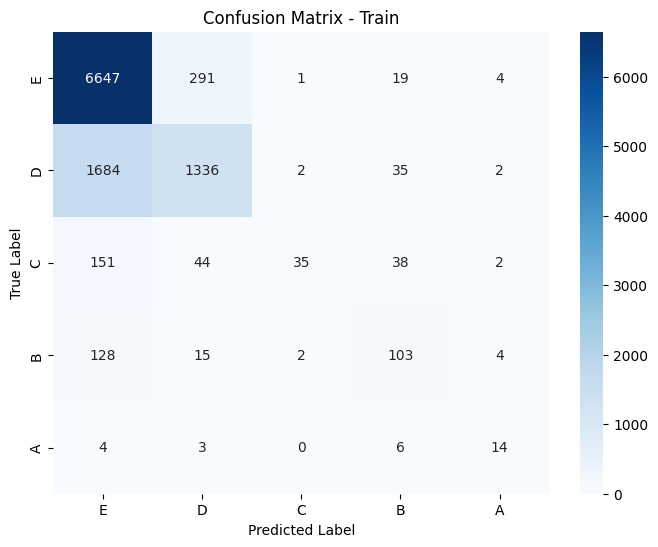

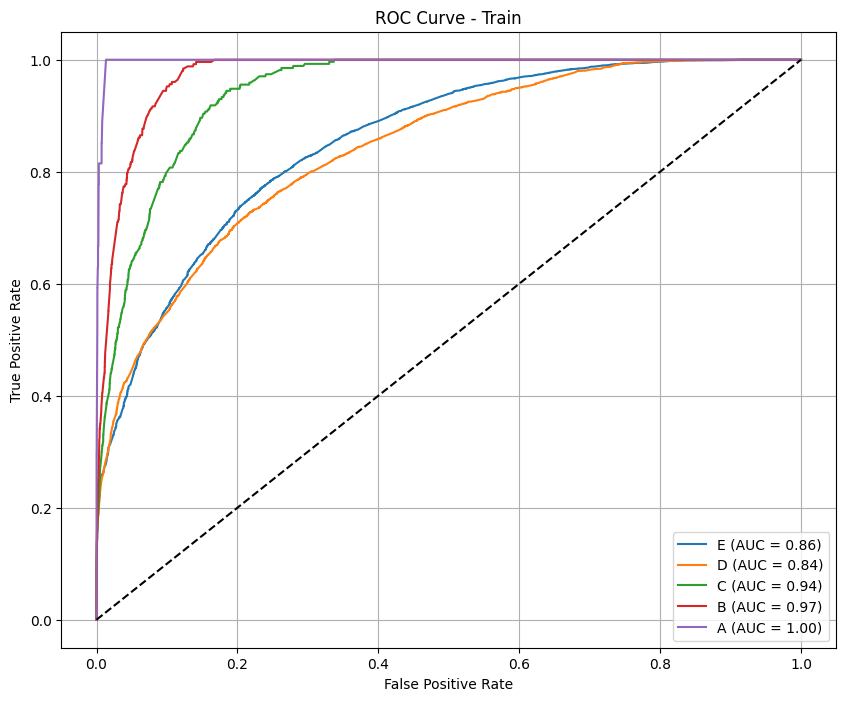


--- Test Metrics ---
F1 Score (per class): [0.91371341 0.4047619  0.         0.         0.        ]
Precision (per class): [0.86950147 0.45945946 0.         0.         0.        ]
Recall (per class): [0.96266234 0.36170213 0.         0.         0.        ]
Accuracy: 0.8294
AUC (One-vs-Rest): 0.8026

Classification Report:
              precision    recall  f1-score   support

           E       0.87      0.96      0.91       616
           D       0.46      0.36      0.40        94
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.83       756
   macro avg       0.27      0.26      0.26       756
weighted avg       0.77      0.83      0.79       756



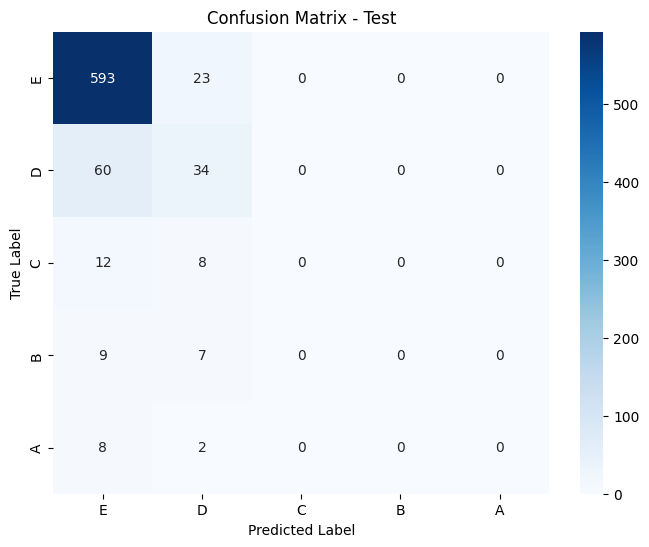

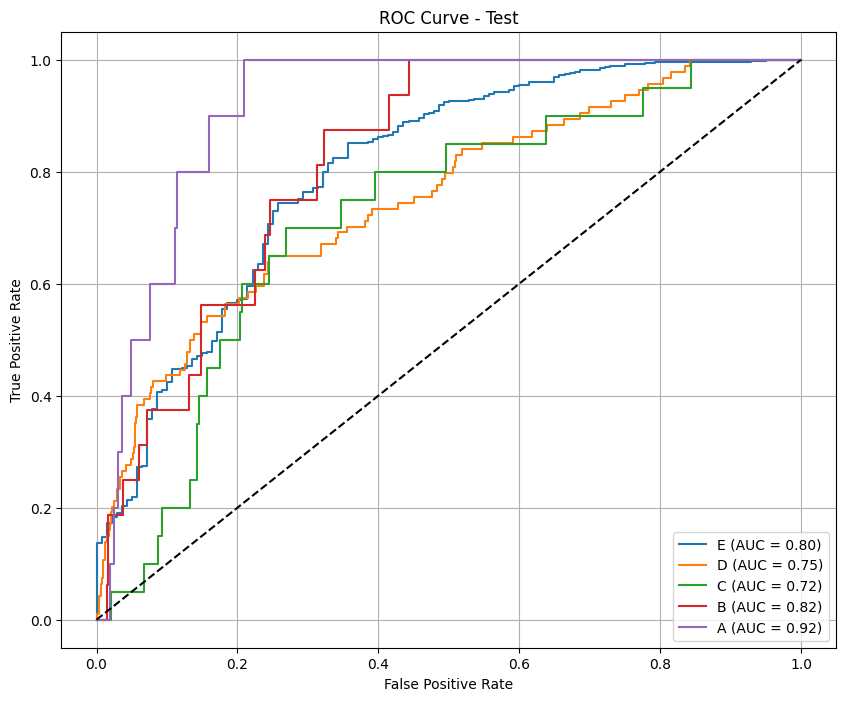

Test predictions saved as test_results_standard_f1_macro_phase1.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase1 ===

--- Train Metrics ---
F1 Score (per class): [0.83928351 0.4975923  0.09187279 0.13235294 0.35294118]
Precision (per class): [0.73623754 0.83333333 1.         0.9        0.85714286]
Recall (per class): [0.975869   0.35469108 0.04814815 0.07142857 0.22222222]
Accuracy: 0.7489
AUC (One-vs-Rest): 0.9209

Classification Report:
              precision    recall  f1-score   support

           E       0.74      0.98      0.84      6962
           D       0.83      0.35      0.50      3059
           C       1.00      0.05      0.09       270
           B       0.90      0.07      0.13       252
           A       0.86      0.22      0.35        27

    accuracy                           0.75     10570
   macro avg       0.87      0.33      0.38     10570
weighted avg       0.78

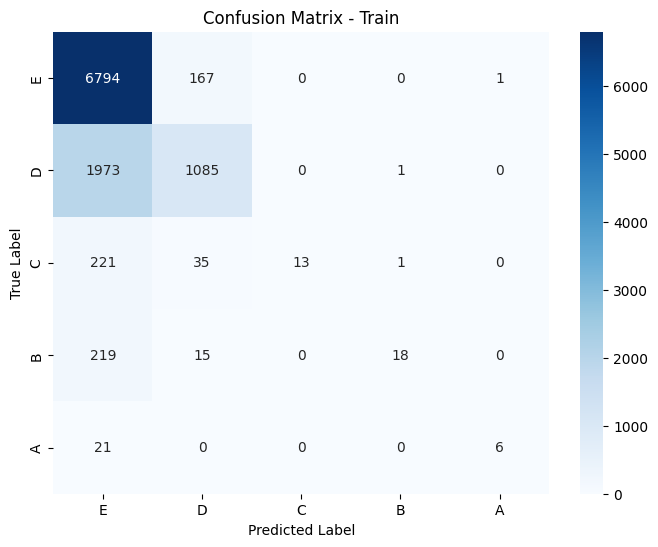

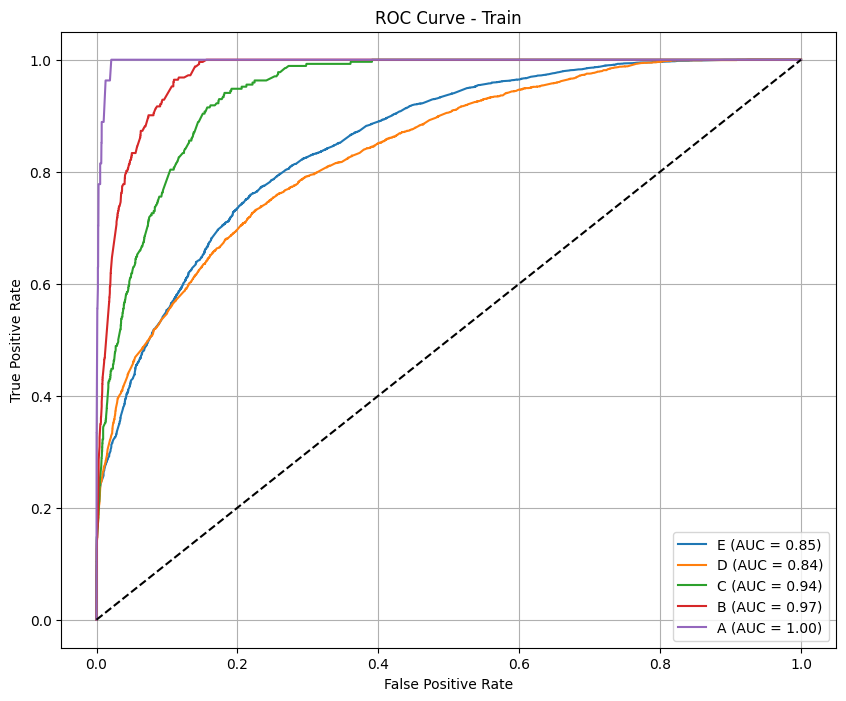


--- Test Metrics ---
F1 Score (per class): [0.91981846 0.375      0.         0.         0.        ]
Precision (per class): [0.8611898 0.54      0.        0.        0.       ]
Recall (per class): [0.98701299 0.28723404 0.         0.         0.        ]
Accuracy: 0.8399
AUC (One-vs-Rest): 0.8285

Classification Report:
              precision    recall  f1-score   support

           E       0.86      0.99      0.92       616
           D       0.54      0.29      0.38        94
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.84       756
   macro avg       0.28      0.25      0.26       756
weighted avg       0.77      0.84      0.80       756



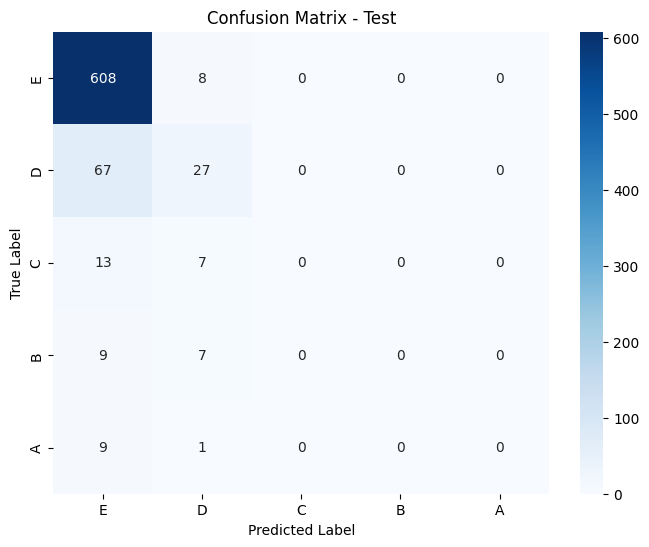

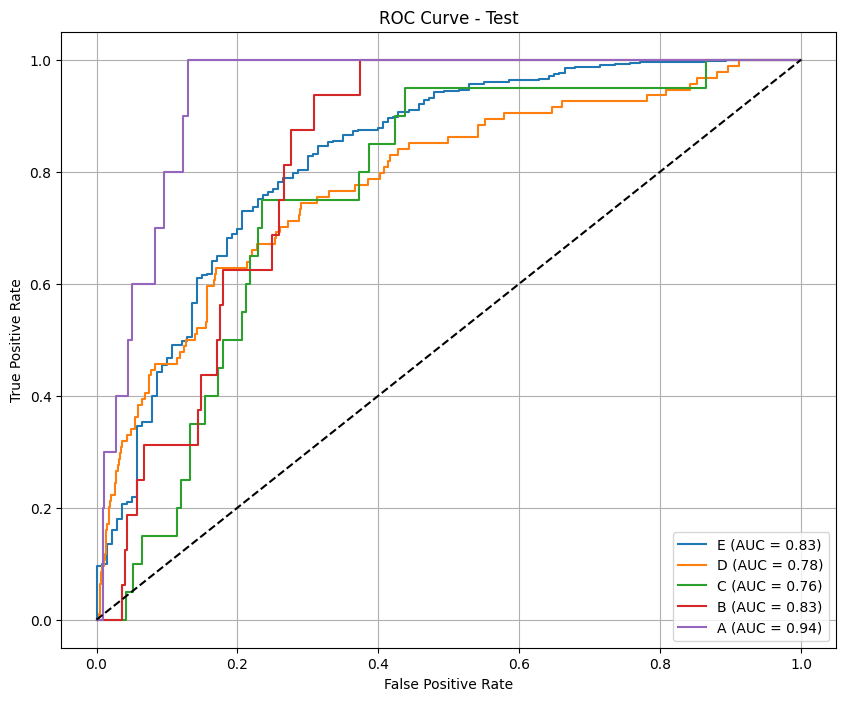

Calibrated predictions saved as test_results_calibrate_standard_f1_macro_phase1.csv

=== Permutation Importance for phase phase1 ===

=== Permutation Importance (Top Features) ===
exercise_count: 0.0390
remaining_time: 0.0323
video_count: 0.0221
school: 0.0175
total_words_phase1: 0.0141
video: 0.0131
assignment: 0.0130
duration_days: 0.0117
chapter_count: 0.0109
user_month: 0.0090
start_month: 0.0044
num_prerequisites: 0.0043
exercise_correct_sum_1: 0.0040
entropy_time_comment_phase1: 0.0033
total_neutral1: 0.0033
user_time_since_last_course: 0.0028
end_month: 0.0026
user_past_course_count: 0.0025
exercise_perc_real_score_sum_1: 0.0020
total_positive1: 0.0020
exam: 0.0018
exercise_perc_goal_score_mean_1: 0.0017
exercise_context_mean_1: 0.0012
field_encoded_1: 0.0011
exercise_perc_real_completed_mean_1: 0.0010
exercise_diff_max_1: 0.0010
exercise_diff_sum_1: 0.0009
user_year: 0.0008
exercise_num_problem_mean_1: 0.0008
total_negative1: 0.0008
field_encoded_2: 0.0007
exercise_perc_real_co

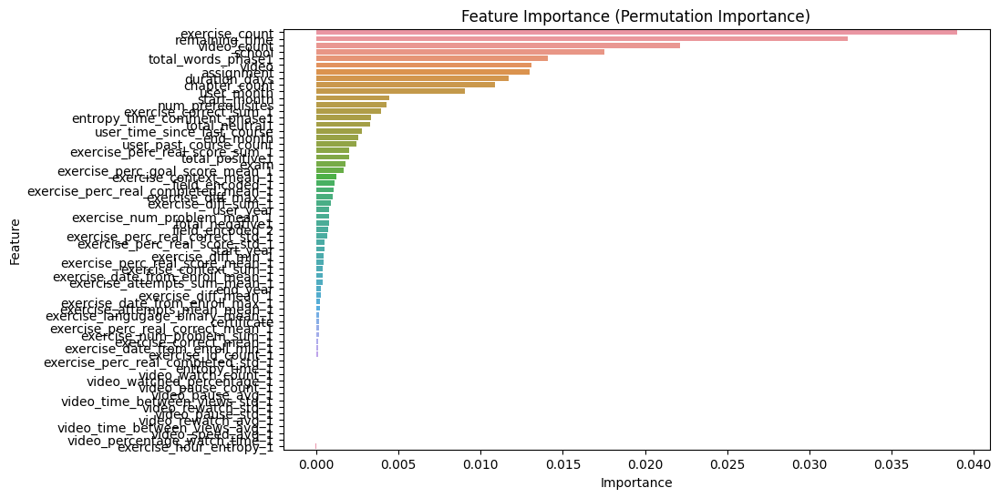


=== Lasso Feature Selection for phase phase1 ===

=== Lasso Feature Importance ===
start_month: 0.2982
start_year: 0.2658
chapter_count: 0.1517
video_count: 0.1455
video: 0.1411
duration_days: 0.1025
assignment: 0.0882
exercise_perc_real_score_sum_1: 0.0851
exercise_count: 0.0816
exercise_correct_sum_1: 0.0797
exercise_perc_real_correct_mean_1: 0.0540
exercise_id_count_1: 0.0354
exercise_num_problem_sum_1: 0.0321
exercise_langugage_binary_mean_1: 0.0291
total_neutral1: 0.0282
exercise_num_problem_mean_1: 0.0280
user_month: 0.0275
exercise_attempts_mean_mean_1: 0.0264
remaining_time: 0.0255
total_words_phase1: 0.0180
entropy_time_comment_phase1: 0.0163
total_positive1: 0.0150
user_past_course_count: 0.0148
num_prerequisites: 0.0141
exercise_perc_real_correct_std_1: 0.0137
school: 0.0136
exercise_perc_real_completed_std_1: 0.0129
field_encoded_1: 0.0078
user_year: 0.0069
exercise_date_from_enroll_max_1: 0.0057
certificate: 0.0046
exercise_diff_min_1: 0.0036
exercise_hour_entropy_1: 0.00

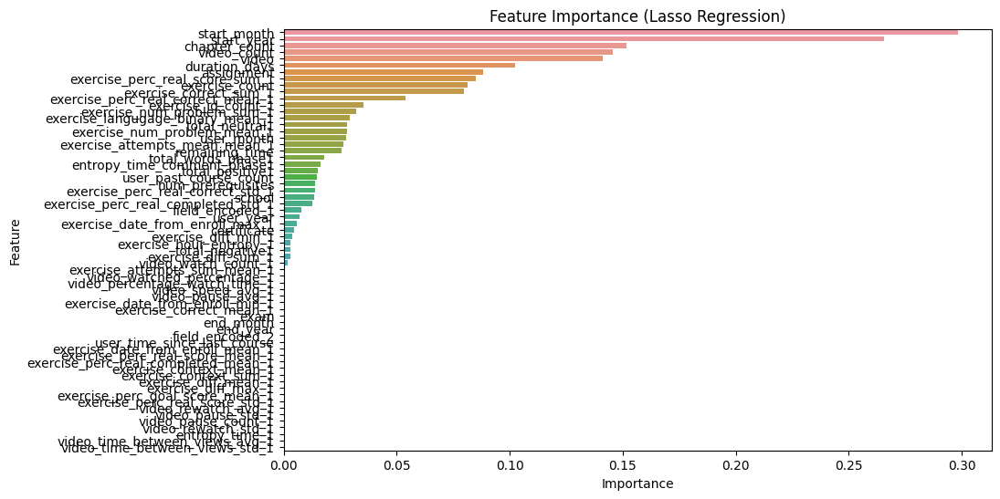


=== Boruta Trick ===

=== Boruta (Trick) Feature Importance ===
Random Feature: 12.8788
remaining_time: 12.3554
school: 10.5313
video: 8.6793
exercise_count: 8.3352
assignment: 7.6418
video_count: 6.9562
duration_days: 5.7798
chapter_count: 5.2726
total_words_phase1: 3.3704
user_month: 3.3470
start_month: 2.4828
num_prerequisites: 1.4666
total_neutral1: 1.2423
field_encoded_1: 0.8886
end_month: 0.8230
exercise_correct_sum_1: 0.7401
user_time_since_last_course: 0.6793
exam: 0.6324
user_past_course_count: 0.6092
certificate: 0.5725
entropy_time_comment_phase1: 0.5006
user_year: 0.4994
field_encoded_2: 0.4239
total_positive1: 0.3712
exercise_perc_real_score_sum_1: 0.2962
exercise_perc_goal_score_mean_1: 0.2540
exercise_correct_mean_1: 0.2409
exercise_context_sum_1: 0.2394
exercise_perc_real_correct_std_1: 0.2282
exercise_perc_real_correct_mean_1: 0.2170
exercise_num_problem_mean_1: 0.1666
exercise_date_from_enroll_max_1: 0.1358
exercise_attempts_mean_mean_1: 0.1253
exercise_perc_real_com

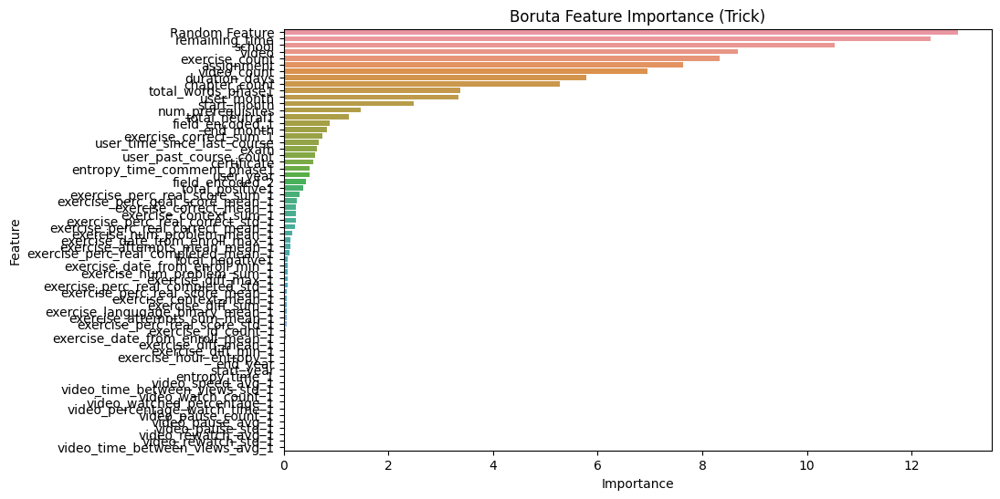


=== Phase phase1 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8548 entries, 0 to 8547
Columns: 113 entries, user_id to label_encoded
dtypes: float64(100), int64(9), object(4)
memory usage: 7.4+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase2: {'rsm': 0.8, 'learning_rate': 0.15, 'l2_leaf_reg': 3, 'iterations': 400, 'depth': 6, 'border_count': 64} ===

=== Evaluation for phase phase2 ===

--- Train Metrics ---
F1 Score (per class): [0.84933483 0.55179487 0.22900763 0.44938272 0.54901961]
Precision (per class): [0.77267425 0.73850377 0.9375     0.52       0.53846154]
Recall (per class): [0.94288256 0.44044208 0.13043478 0.39565217 0.56      ]
Accuracy: 0.7616
AUC (One-vs-Rest): 0.9192

Classification Report:
              precision    recall  f1-score   support

           E       0.77      0.94      0.85      5620
           D       0.74      0.44      0.55      2443
           C       0.94      0.13      0.23

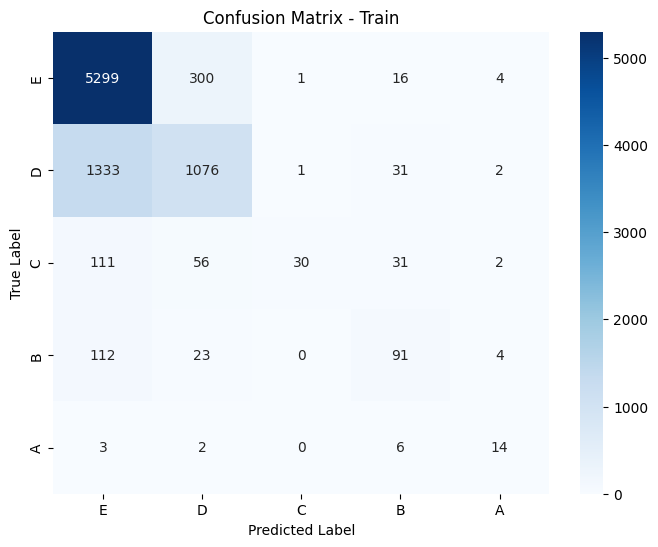

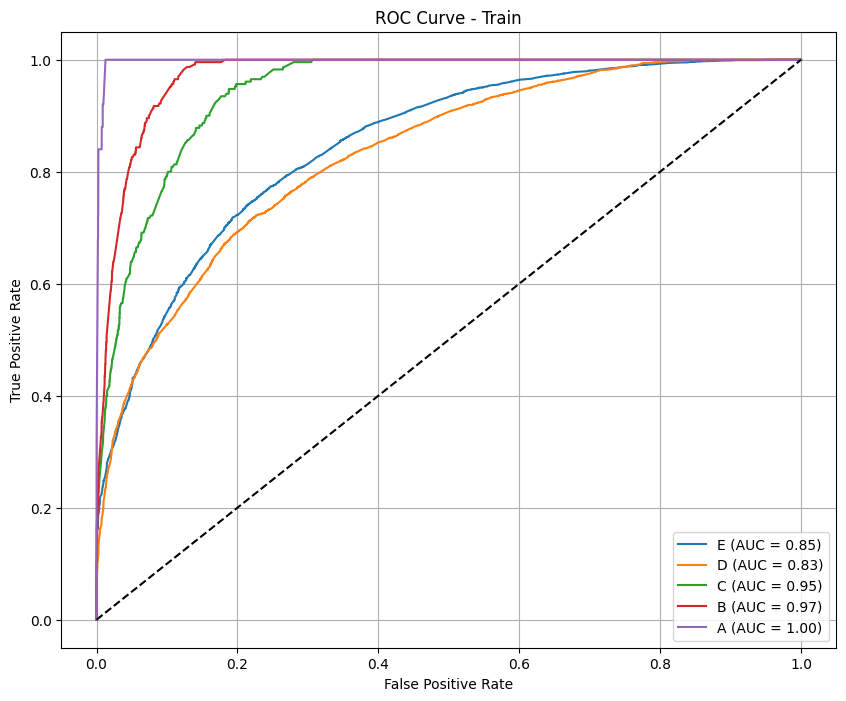


--- Test Metrics ---
F1 Score (per class): [0.910086   0.35928144 0.         0.         0.        ]
Precision (per class): [0.86865672 0.4        0.         0.         0.        ]
Recall (per class): [0.95566502 0.32608696 0.         0.         0.        ]
Accuracy: 0.8204
AUC (One-vs-Rest): 0.7712

Classification Report:
              precision    recall  f1-score   support

           E       0.87      0.96      0.91       609
           D       0.40      0.33      0.36        92
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        15
           A       0.00      0.00      0.00        10

    accuracy                           0.82       746
   macro avg       0.25      0.26      0.25       746
weighted avg       0.76      0.82      0.79       746



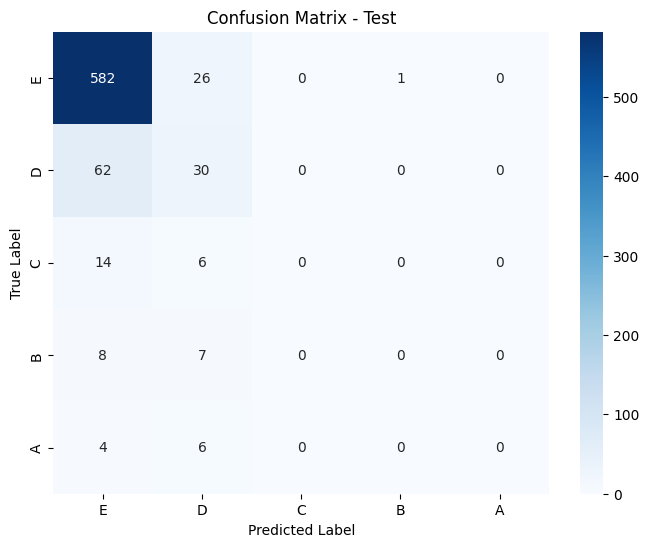

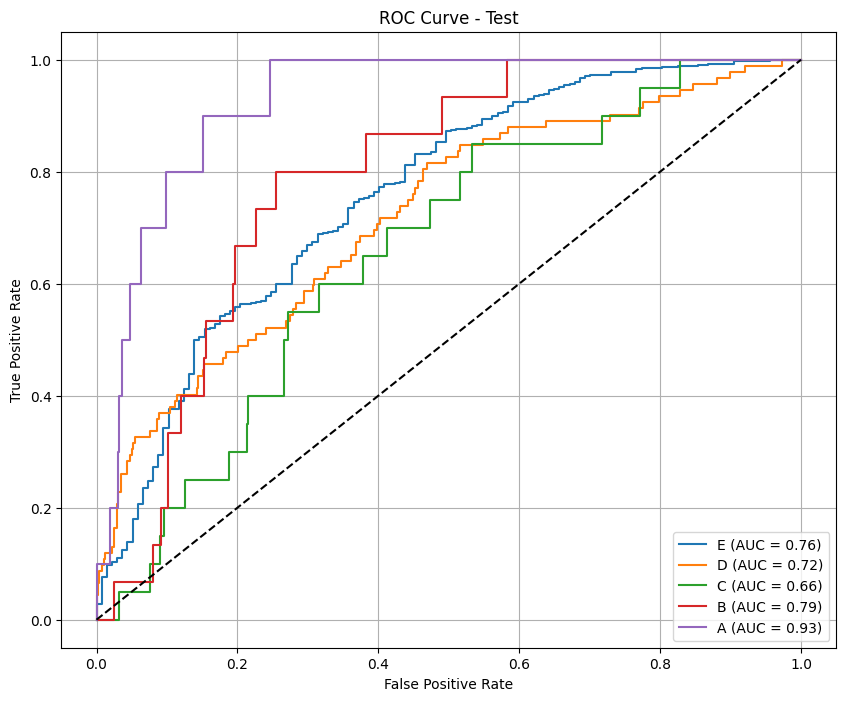

Test predictions saved as test_results_standard_f1_macro_phase2.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase2 ===

--- Train Metrics ---
F1 Score (per class): [0.82718272 0.42263919 0.06722689 0.09836066 0.32258065]
Precision (per class): [0.71498963 0.85024752 1.         0.85714286 0.83333333]
Recall (per class): [0.98113879 0.28121163 0.03478261 0.05217391 0.2       ]
Accuracy: 0.7284
AUC (One-vs-Rest): 0.9168

Classification Report:
              precision    recall  f1-score   support

           E       0.71      0.98      0.83      5620
           D       0.85      0.28      0.42      2443
           C       1.00      0.03      0.07       230
           B       0.86      0.05      0.10       230
           A       0.83      0.20      0.32        25

    accuracy                           0.73      8548
   macro avg       0.85      0.31      0.35      8548
weighted avg       0.77

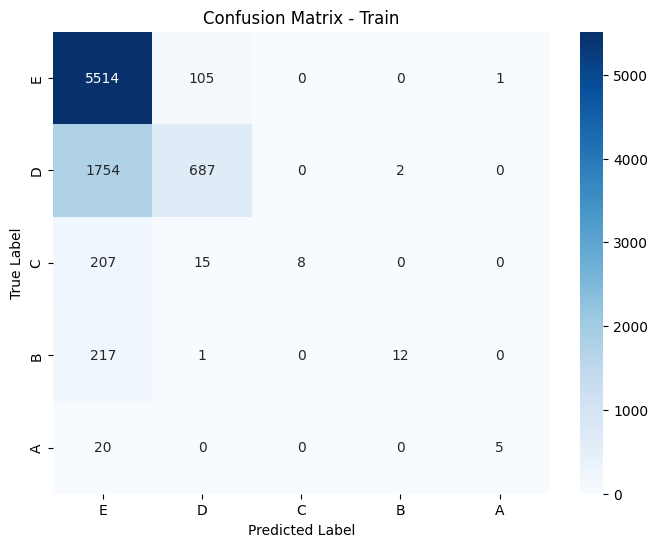

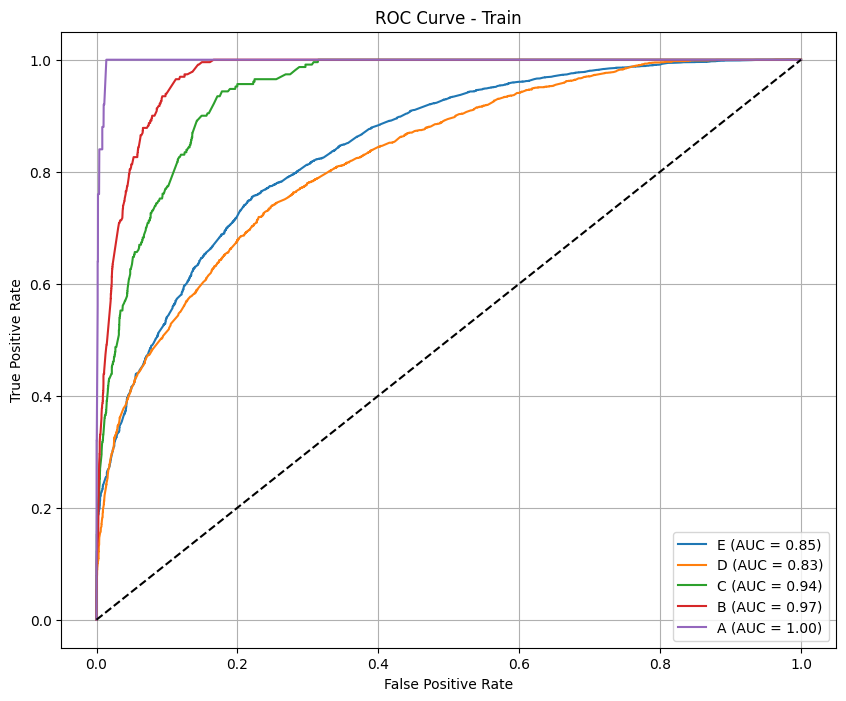


--- Test Metrics ---
F1 Score (per class): [0.90419162 0.16216216 0.         0.         0.        ]
Precision (per class): [0.83081155 0.47368421 0.         0.         0.        ]
Recall (per class): [0.99178982 0.09782609 0.         0.         0.        ]
Accuracy: 0.8217
AUC (One-vs-Rest): 0.7894

Classification Report:
              precision    recall  f1-score   support

           E       0.83      0.99      0.90       609
           D       0.47      0.10      0.16        92
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        15
           A       0.00      0.00      0.00        10

    accuracy                           0.82       746
   macro avg       0.26      0.22      0.21       746
weighted avg       0.74      0.82      0.76       746



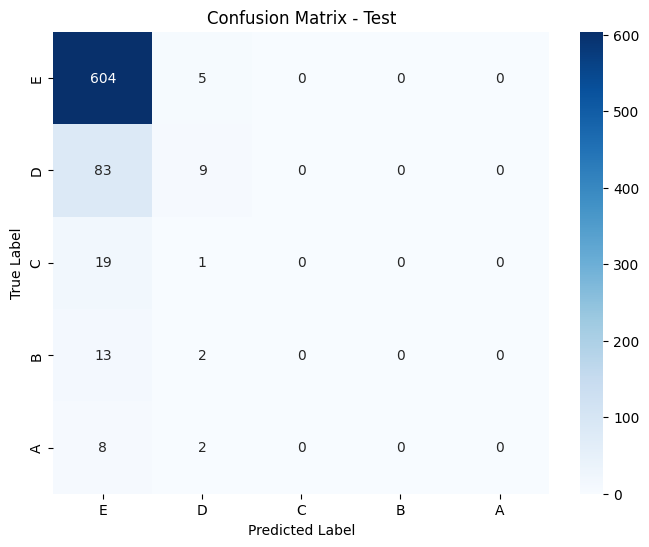

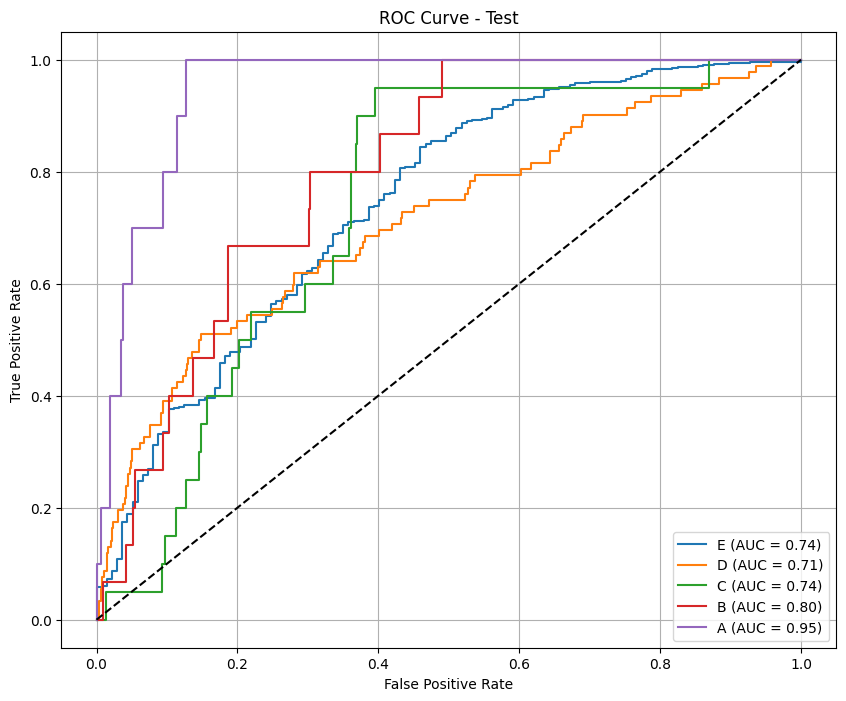

Calibrated predictions saved as test_results_calibrate_standard_f1_macro_phase2.csv

=== Permutation Importance for phase phase2 ===

=== Permutation Importance (Top Features) ===
exercise_count: 0.0405
remaining_time: 0.0374
school: 0.0259
video_count: 0.0226
video: 0.0168
total_words_phase1: 0.0151
assignment: 0.0148
duration_days: 0.0147
chapter_count: 0.0120
user_month: 0.0090
total_words_phase2: 0.0071
num_prerequisites: 0.0056
start_month: 0.0051
total_neutral1: 0.0043
user_past_course_count: 0.0037
total_positive1: 0.0037
entropy_time_comment_phase1: 0.0032
end_month: 0.0029
exercise_correct_sum_2: 0.0027
user_time_since_last_course: 0.0024
field_encoded_1: 0.0021
total_neutral2: 0.0021
field_encoded_2: 0.0020
exam: 0.0018
entropy_time_comment_phase2: 0.0014
total_positive2: 0.0014
start_year: 0.0010
exercise_perc_real_score_sum_1: 0.0008
total_negative1: 0.0007
total_negative2: 0.0006
certificate: 0.0004
exercise_diff_max_2: 0.0003
exercise_correct_sum_1: 0.0003
exercise_perc_r

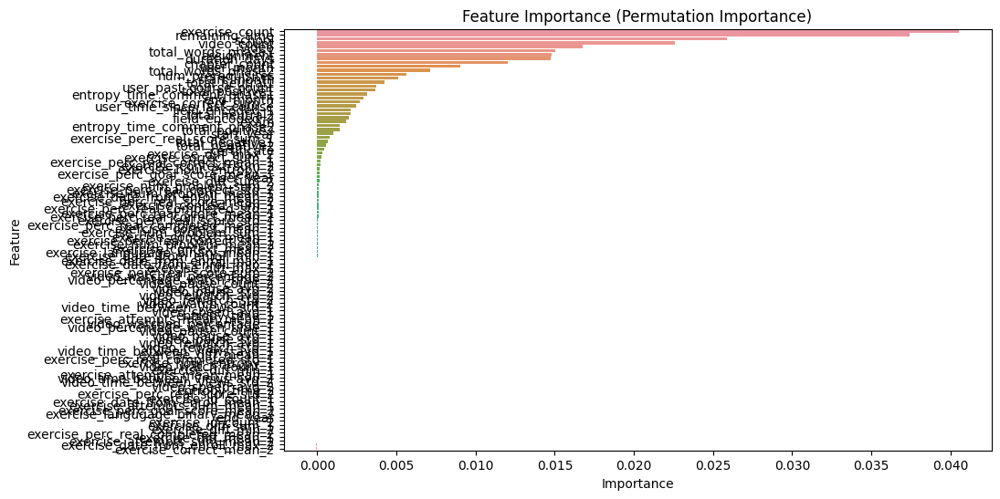


=== Lasso Feature Selection for phase phase2 ===

=== Lasso Feature Importance ===
video: 0.1351
chapter_count: 0.1310
duration_days: 0.1217
video_count: 0.1059
assignment: 0.0912
exercise_count: 0.0873
exercise_correct_sum_2: 0.0648
start_month: 0.0645
remaining_time: 0.0399
total_neutral2: 0.0373
exercise_correct_sum_1: 0.0294
exercise_num_problem_mean_2: 0.0236
user_past_course_count: 0.0215
num_prerequisites: 0.0215
certificate: 0.0208
entropy_time_comment_phase2: 0.0189
total_neutral1: 0.0177
total_words_phase1: 0.0161
exercise_perc_real_completed_std_2: 0.0150
user_time_since_last_course: 0.0132
exercise_perc_real_score_sum_2: 0.0118
school: 0.0117
exercise_langugage_binary_mean_1: 0.0115
field_encoded_2: 0.0110
total_positive1: 0.0073
total_positive2: 0.0068
end_month: 0.0066
exercise_diff_sum_2: 0.0058
end_year: 0.0050
exercise_perc_real_score_sum_1: 0.0049
field_encoded_1: 0.0042
total_negative2: 0.0038
exercise_langugage_binary_mean_2: 0.0038
exercise_perc_real_completed_std

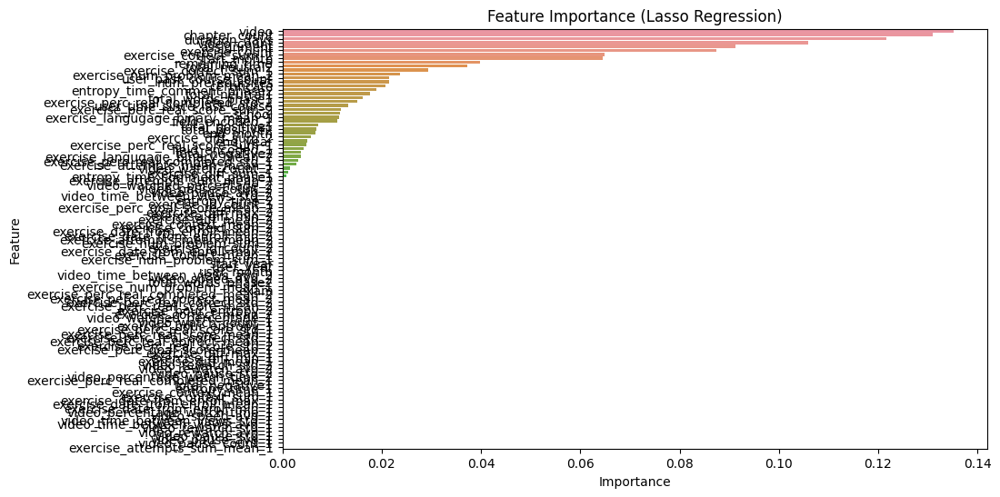


=== Boruta Trick ===

=== Boruta (Trick) Feature Importance ===
remaining_time: 12.1815
Random Feature: 11.8052
school: 11.3286
video: 10.2269
exercise_count: 9.6364
video_count: 7.1540
assignment: 6.6510
chapter_count: 5.2993
duration_days: 4.2142
user_month: 3.4535
num_prerequisites: 2.6143
total_words_phase1: 2.1389
start_month: 2.0608
end_month: 1.8727
total_words_phase2: 1.3879
total_neutral1: 1.1348
field_encoded_1: 0.7757
user_past_course_count: 0.7745
start_year: 0.7031
total_neutral2: 0.6030
exam: 0.5609
entropy_time_comment_phase1: 0.4602
user_time_since_last_course: 0.3645
entropy_time_comment_phase2: 0.3583
field_encoded_2: 0.3375
certificate: 0.3206
total_positive1: 0.2992
user_year: 0.2500
exercise_correct_sum_2: 0.1356
total_positive2: 0.1103
total_negative1: 0.0727
exercise_perc_real_correct_mean_1: 0.0490
exercise_context_mean_2: 0.0469
exercise_diff_sum_1: 0.0315
exercise_num_problem_sum_1: 0.0298
exercise_context_sum_1: 0.0293
exercise_perc_real_score_sum_1: 0.0293


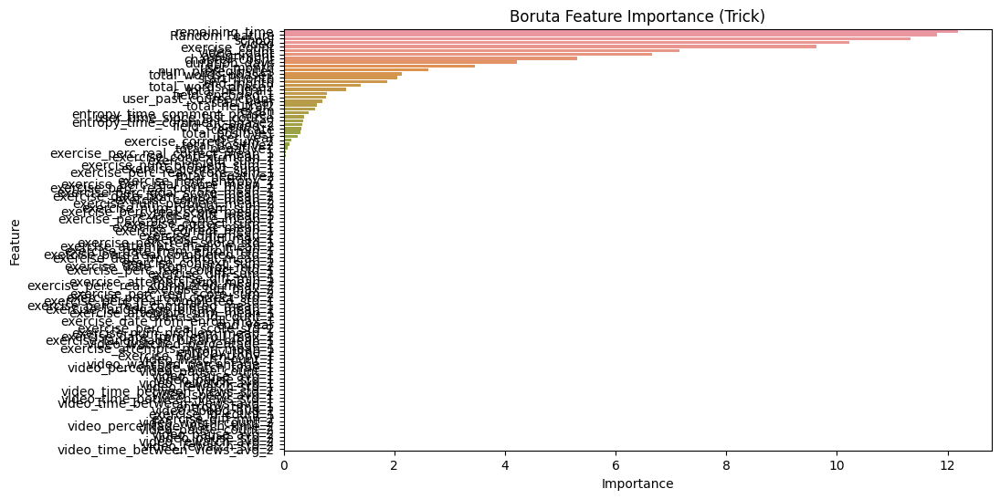


=== Phase phase2 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7803 entries, 0 to 7802
Columns: 156 entries, user_id to label_encoded
dtypes: float64(143), int64(9), object(4)
memory usage: 9.3+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase3: {'rsm': 0.8, 'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 300, 'depth': 9, 'border_count': 64} ===

=== Evaluation for phase phase3 ===

--- Train Metrics ---
F1 Score (per class): [0.85545045 0.57939328 0.30434783 0.49046322 0.46153846]
Precision (per class): [0.78196218 0.75768406 0.94594595 0.5625     0.45      ]
Recall (per class): [0.94418423 0.46902655 0.18134715 0.43478261 0.47368421]
Accuracy: 0.7730
AUC (One-vs-Rest): 0.9299

Classification Report:
              precision    recall  f1-score   support

           E       0.78      0.94      0.86      5124
           D       0.76      0.47      0.58      2260
           C       0.95      0.18      0.30 

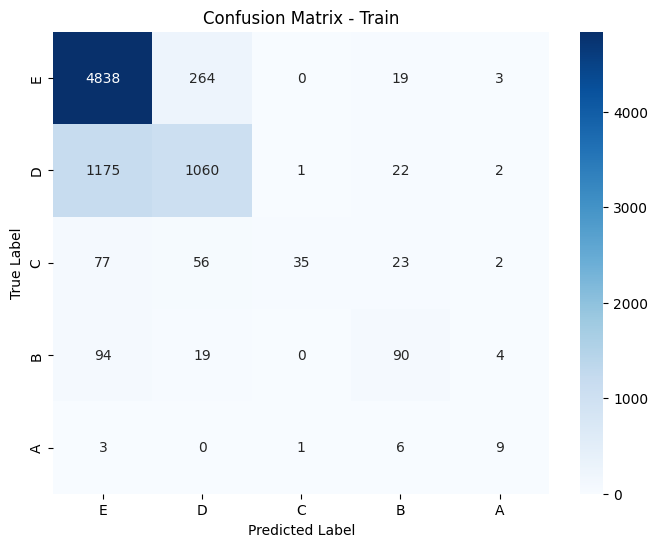

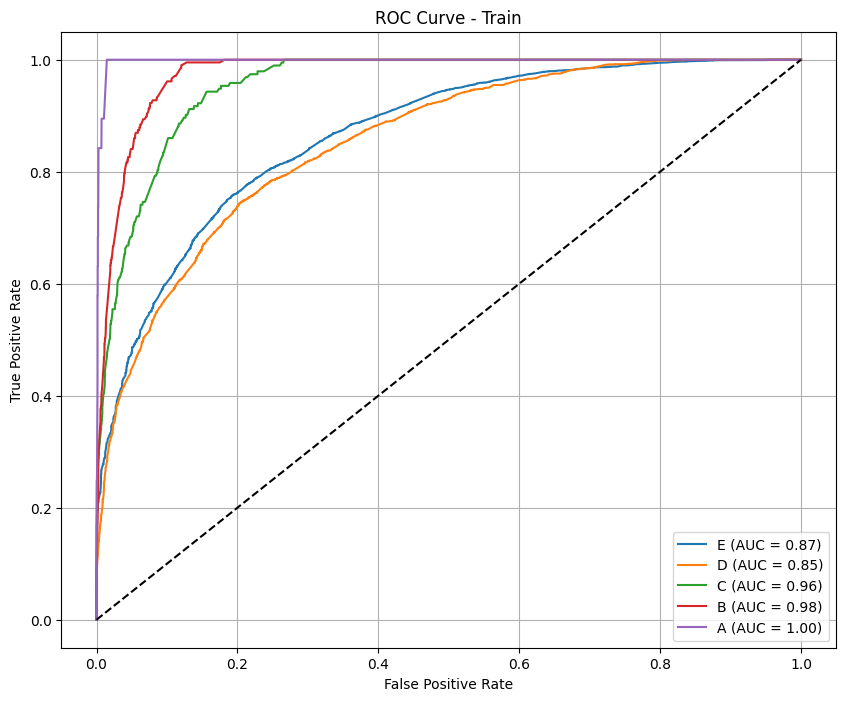


--- Test Metrics ---
F1 Score (per class): [0.89852827 0.0952381  0.         0.         0.        ]
Precision (per class): [0.82503556 0.27777778 0.         0.         0.        ]
Recall (per class): [0.98639456 0.05747126 0.         0.         0.        ]
Accuracy: 0.8114
AUC (One-vs-Rest): 0.7239

Classification Report:
              precision    recall  f1-score   support

           E       0.83      0.99      0.90       588
           D       0.28      0.06      0.10        87
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.81       721
   macro avg       0.22      0.21      0.20       721
weighted avg       0.71      0.81      0.74       721



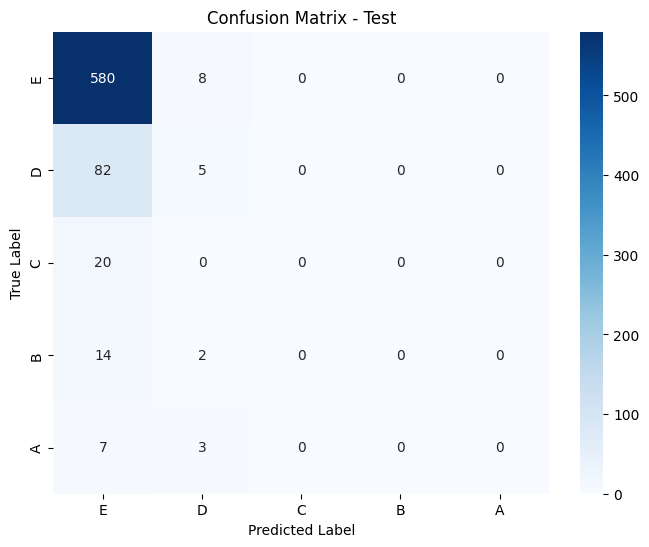

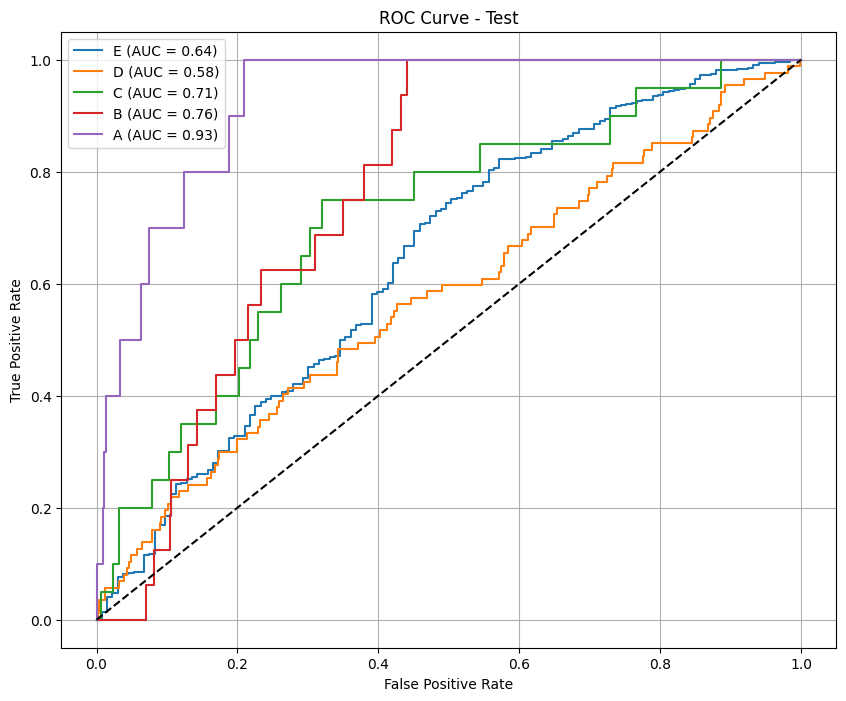

Test predictions saved as test_results_standard_f1_macro_phase3.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase3 ===

--- Train Metrics ---
F1 Score (per class): [0.83577128 0.46367452 0.09852217 0.26771654 0.1       ]
Precision (per class): [0.72785177 0.85782557 1.         0.72340426 1.        ]
Recall (per class): [0.98126464 0.31769912 0.05181347 0.16425121 0.05263158]
Accuracy: 0.7422
AUC (One-vs-Rest): 0.9271

Classification Report:
              precision    recall  f1-score   support

           E       0.73      0.98      0.84      5124
           D       0.86      0.32      0.46      2260
           C       1.00      0.05      0.10       193
           B       0.72      0.16      0.27       207
           A       1.00      0.05      0.10        19

    accuracy                           0.74      7803
   macro avg       0.86      0.31      0.35      7803
weighted avg       0.77

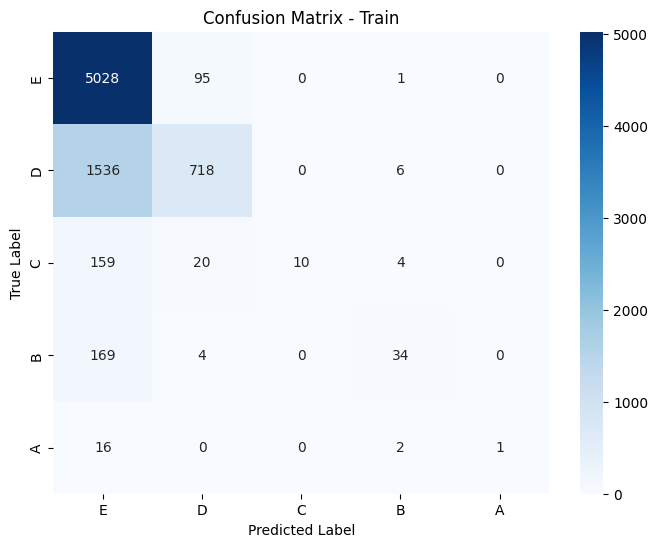

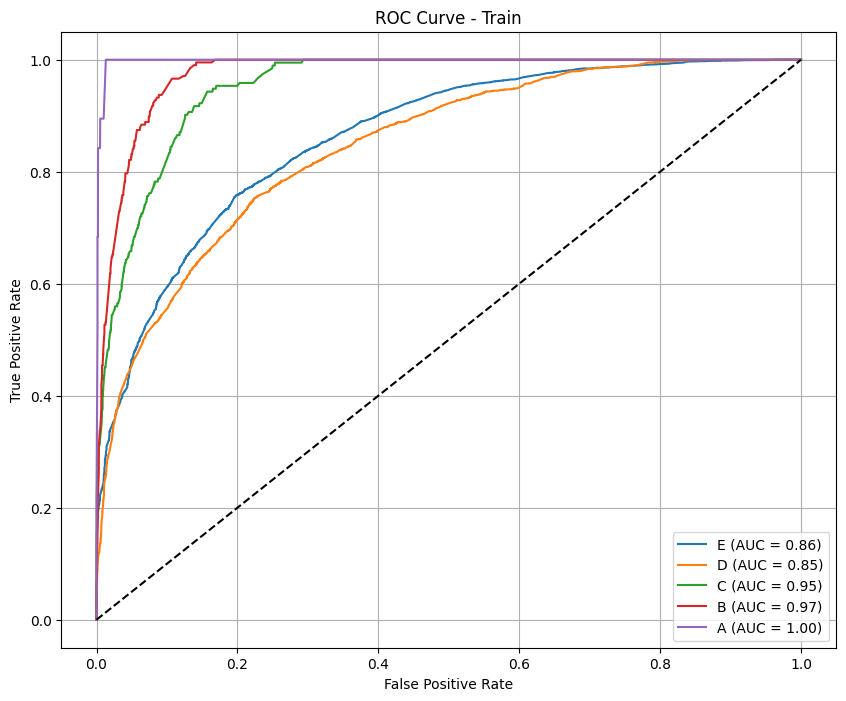


--- Test Metrics ---
F1 Score (per class): [0.89824024 0.02247191 0.         0.         0.        ]
Precision (per class): [0.81641168 0.5        0.         0.         0.        ]
Recall (per class): [0.99829932 0.01149425 0.         0.         0.        ]
Accuracy: 0.8155
AUC (One-vs-Rest): 0.7228

Classification Report:
              precision    recall  f1-score   support

           E       0.82      1.00      0.90       588
           D       0.50      0.01      0.02        87
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.82       721
   macro avg       0.26      0.20      0.18       721
weighted avg       0.73      0.82      0.74       721



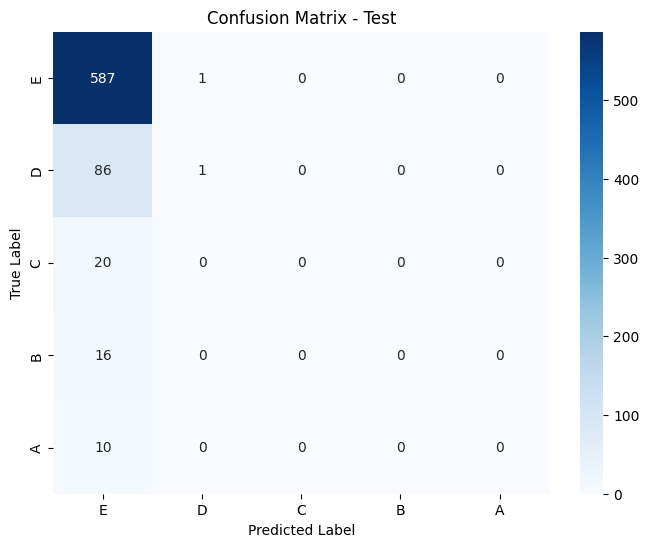

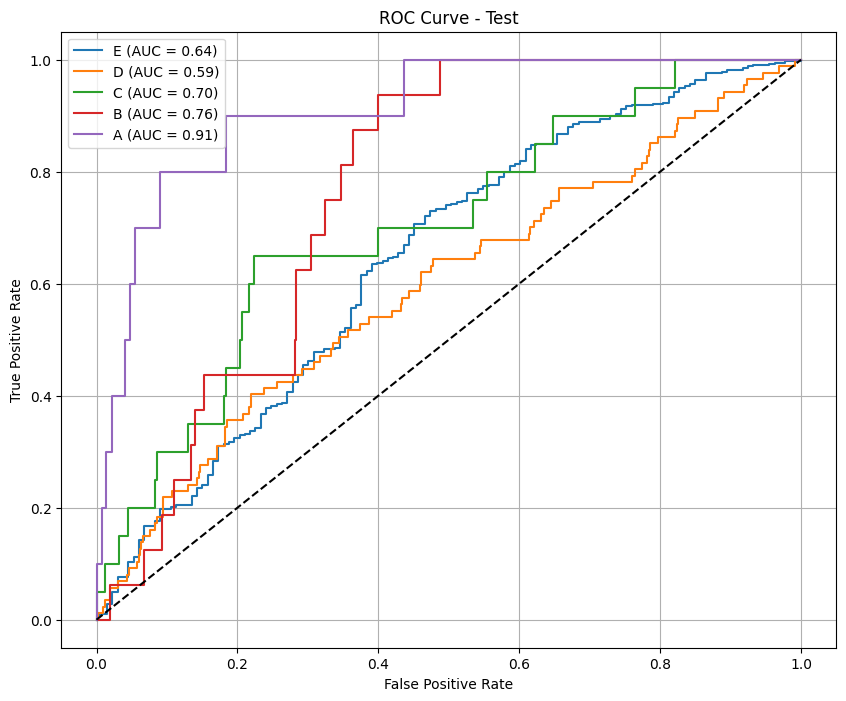

Calibrated predictions saved as test_results_calibrate_standard_f1_macro_phase3.csv

=== Phase phase3 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5363 entries, 0 to 5362
Columns: 199 entries, user_id to label_encoded
dtypes: float64(186), int64(9), object(4)
memory usage: 8.1+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase4: {'rsm': 0.8, 'learning_rate': 0.15, 'l2_leaf_reg': 7, 'iterations': 300, 'depth': 8, 'border_count': 64} ===

=== Evaluation for phase phase4 ===

--- Train Metrics ---
F1 Score (per class): [0.86004162 0.61532508 0.34375    0.51020408 0.4375    ]
Precision (per class): [0.79071992 0.79341317 0.81481481 0.55555556 0.38888889]
Recall (per class): [0.94268606 0.50252845 0.21782178 0.47169811 0.5       ]
Accuracy: 0.7841
AUC (One-vs-Rest): 0.9328

Classification Report:
              precision    recall  f1-score   support

           E       0.79      0.94      0.86      3507
           D 

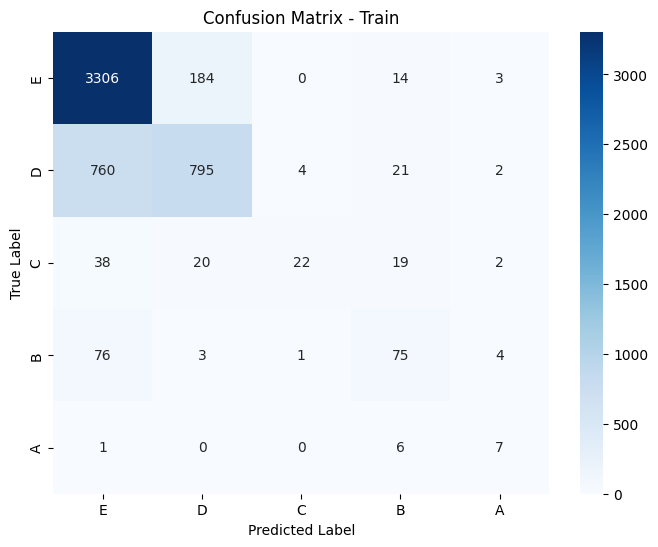

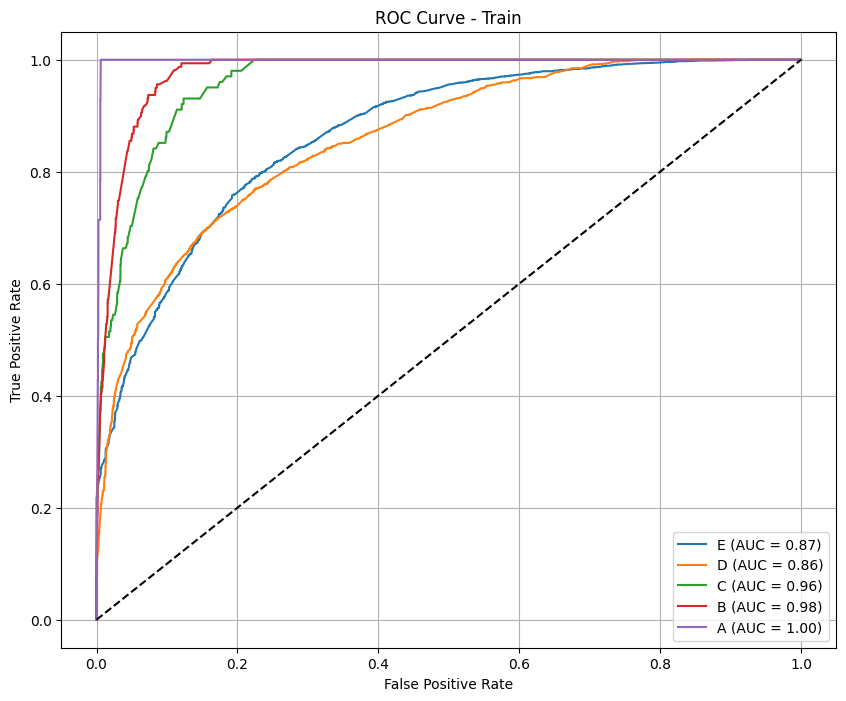


--- Test Metrics ---
F1 Score (per class): [0.87980376 0.01923077 0.         0.         0.        ]
Precision (per class): [0.80538922 0.05263158 0.         0.         0.        ]
Recall (per class): [0.96936937 0.01176471 0.         0.         0.        ]
Accuracy: 0.7846
AUC (One-vs-Rest): 0.6513

Classification Report:
              precision    recall  f1-score   support

           E       0.81      0.97      0.88       555
           D       0.05      0.01      0.02        85
           C       0.00      0.00      0.00        18
           B       0.00      0.00      0.00        18
           A       0.00      0.00      0.00        11

    accuracy                           0.78       687
   macro avg       0.17      0.20      0.18       687
weighted avg       0.66      0.78      0.71       687



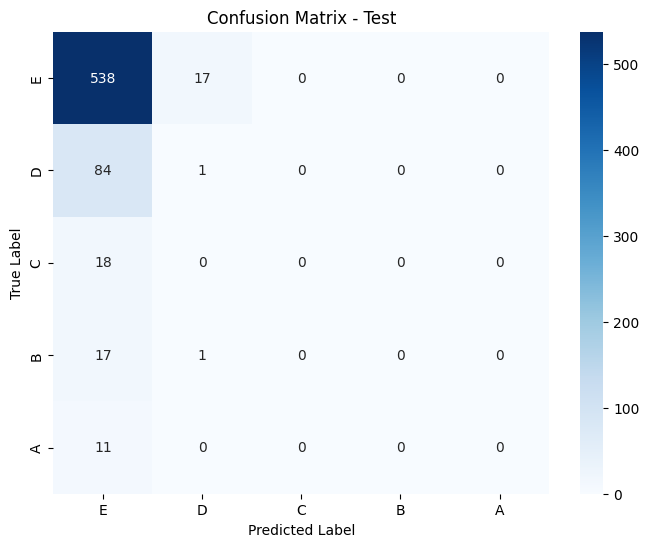

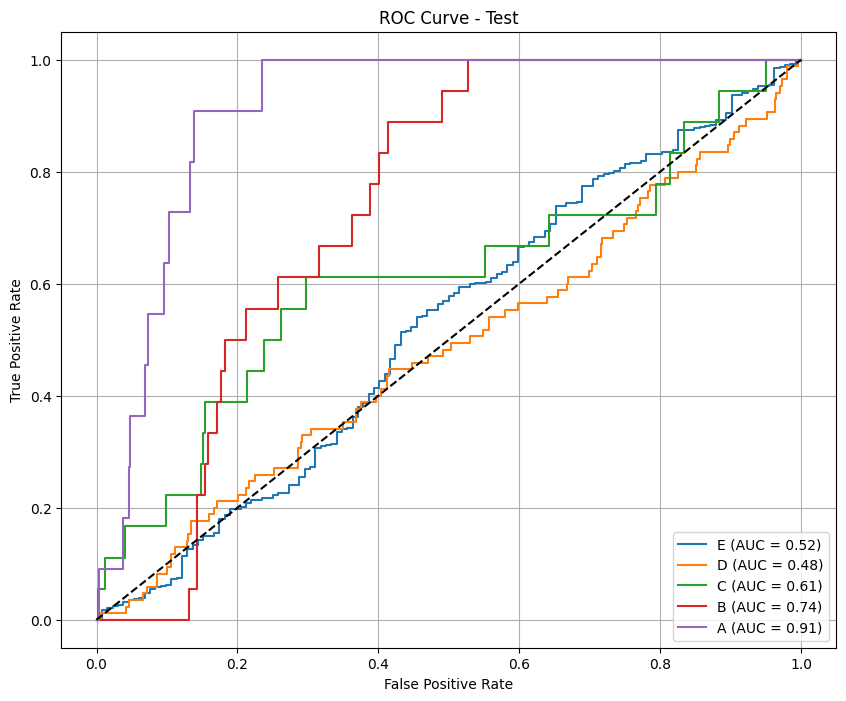

Test predictions saved as test_results_standard_f1_macro_phase4.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase4 ===

--- Train Metrics ---
F1 Score (per class): [0.84478936 0.5070922  0.32520325 0.39069767 0.        ]
Precision (per class): [0.74365647 0.84866469 0.90909091 0.75       0.        ]
Recall (per class): [0.97775877 0.36156764 0.1980198  0.26415094 0.        ]
Accuracy: 0.7576
AUC (One-vs-Rest): 0.9304

Classification Report:
              precision    recall  f1-score   support

           E       0.74      0.98      0.84      3507
           D       0.85      0.36      0.51      1582
           C       0.91      0.20      0.33       101
           B       0.75      0.26      0.39       159
           A       0.00      0.00      0.00        14

    accuracy                           0.76      5363
   macro avg       0.65      0.36      0.41      5363
weighted avg       0.78

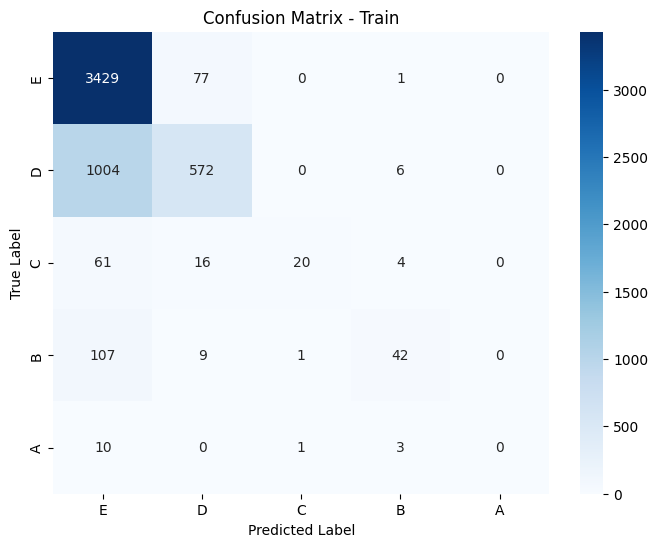

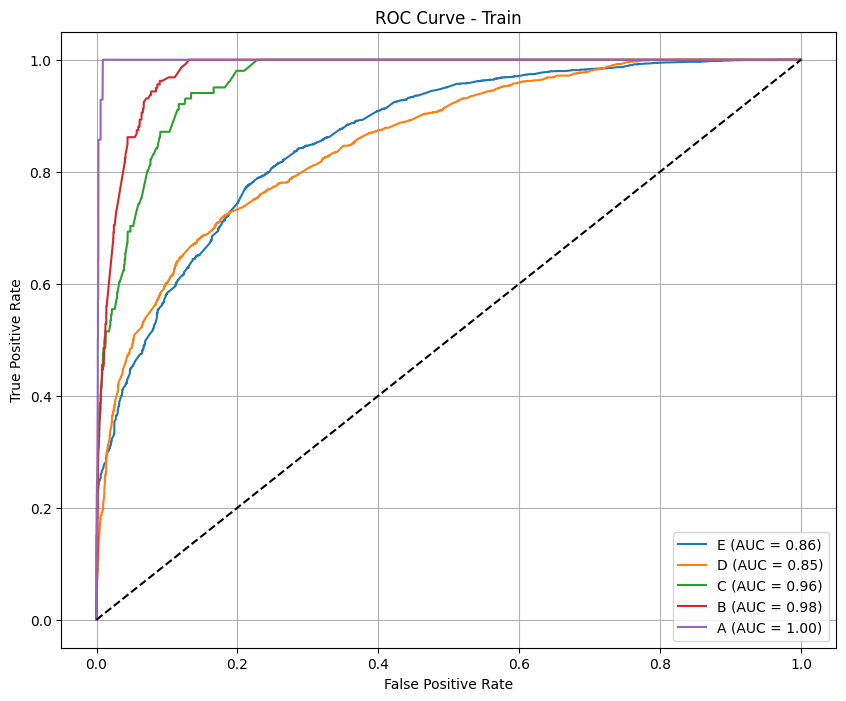


--- Test Metrics ---
F1 Score (per class): [0.89282836 0.         0.         0.         0.        ]
Precision (per class): [0.80758017 0.         0.         0.         0.        ]
Recall (per class): [0.9981982 0.        0.        0.        0.       ]
Accuracy: 0.8064
AUC (One-vs-Rest): 0.6381

Classification Report:
              precision    recall  f1-score   support

           E       0.81      1.00      0.89       555
           D       0.00      0.00      0.00        85
           C       0.00      0.00      0.00        18
           B       0.00      0.00      0.00        18
           A       0.00      0.00      0.00        11

    accuracy                           0.81       687
   macro avg       0.16      0.20      0.18       687
weighted avg       0.65      0.81      0.72       687



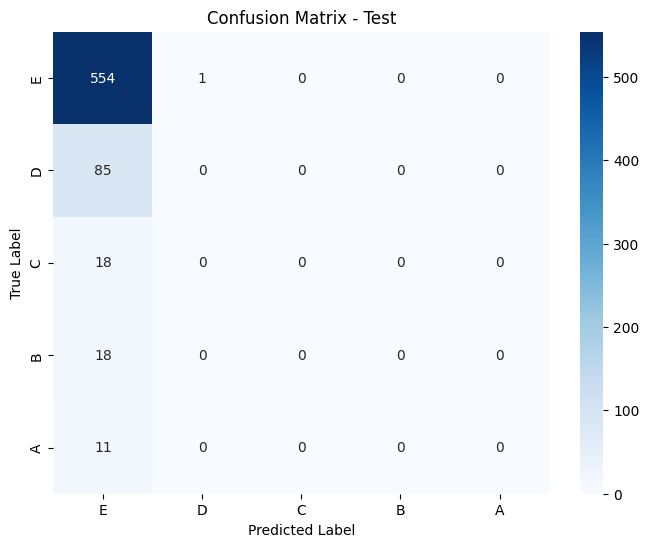

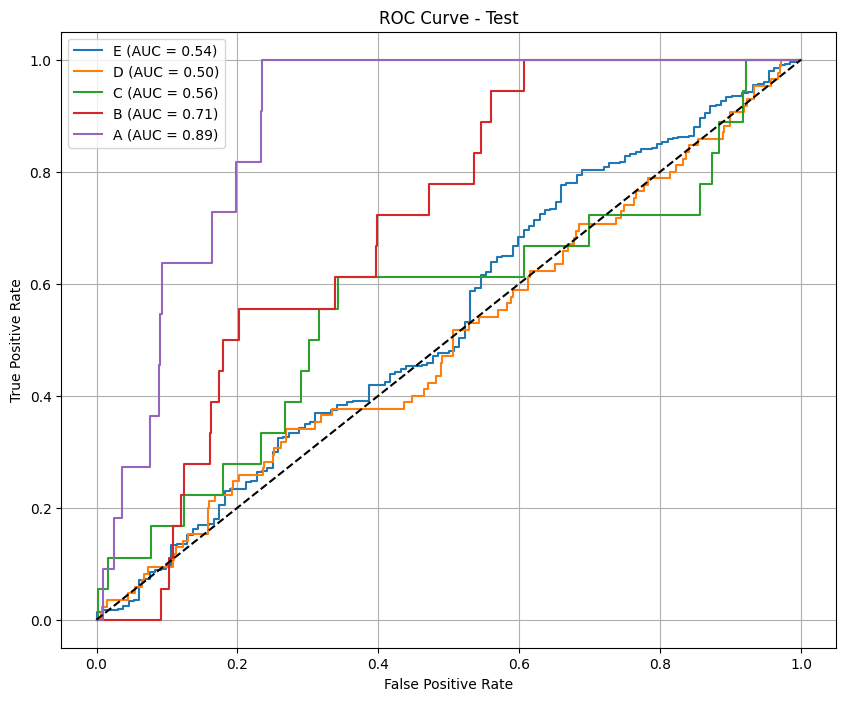

Calibrated predictions saved as test_results_calibrate_standard_f1_macro_phase4.csv

=== Phase phase4 completed ===


In [10]:
# Lặp qua các phase
for phase in ["phase1", "phase2", "phase3", "phase4"]:
    process_phase(phase, metric='f1_macro')

# 2. Scale dữ liệu Normalization 

In [11]:
def process_phase(phase, scale='minmax', metric='accuracy'):
    # Load dữ liệu
    X_train, y_train, X_test, y_test = load_data(phase)

    # Scale dữ liệu
    X_train_scaled, X_test_scaled = scale_data(X_train, X_test, scaler_type=scale)
    X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

    # StratifiedKFold
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Định nghĩa mô hình
    model = CatBoostClassifier(random_state=42, verbose=0)

    # Tham số tìm kiếm
    param_grid = {
        'iterations': [100, 200, 300, 400],
        'depth': [4, 6, 8, 9],
        'learning_rate': [0.01, 0.05, 0.1, 0.15],
        'l2_leaf_reg': [1, 3, 5, 7],
        'border_count': [32, 64],
        'rsm': [0.7, 0.8, 0.9],
    }

    # RandomizedSearchCV
    randomized_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=10,
        cv=skf,
        scoring=metric,
        random_state=42,
        n_jobs=-1,
        verbose=2
    )

    # Train mô hình
    randomized_search.fit(X_train_scaled, y_train)

    best_model = randomized_search.best_estimator_
    best_params = randomized_search.best_params_
    print(f"\n=== Best Parameters for phase {phase}: {best_params} ===")

    # Đánh giá mô hình trước calibrate
    print(f"\n=== Evaluation for phase {phase} ===")
    eval_results = evaluate_model(best_model, X_train_scaled, y_train, X_test_scaled, y_test)

    # Lưu kết quả dự đoán
    y_test_pred = best_model.predict(X_test_scaled)
    results_df = X_test.copy()
    results_df['True_Label'] = y_test
    results_df['Predicted_Label'] = y_test_pred
    filename = f"test_results_{scale}_{metric}_{phase}.csv"
    results_df.to_csv(filename, index=False)
    print(f"Test predictions saved as {filename}")

    # Calibrate mô hình
    calibrated_model = calibrate_model(best_model, X_train_scaled, y_train)

    # Đánh giá mô hình sau calibrate
    print(f"\n=== Evaluation after calibration for phase {phase} ===")
    eval_results_cal = evaluate_model(calibrated_model, X_train_scaled, y_train, X_test_scaled, y_test)

    # Lưu kết quả dự đoán sau calibrate
    y_calibrated_pred = calibrated_model.predict(X_test_scaled)
    results_df['Calibrated_Predicted_Label'] = y_calibrated_pred
    filename_cal = f"test_results_calibrate_{scale}_{metric}_{phase}.csv"
    results_df.to_csv(filename_cal, index=False)
    print(f"Calibrated predictions saved as {filename_cal}")

    # Nếu phase 1 hoặc 2 → chọn feature
    if int(phase[-1]) <= 2:
        print(f"\n=== Permutation Importance for phase {phase} ===")
        perm_importance = plot_permutation_importance(best_model, X_train_scaled, y_train)
        perm_importance.to_csv(f"perm_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

        print(f"\n=== Lasso Feature Selection for phase {phase} ===")
        selected_features, lasso_importance = lasso_feature_selection(X_train_scaled, y_train)
        lasso_importance.to_csv(f"lasso_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

        print("\n=== Boruta Trick ===")
        boruta_model = CatBoostClassifier(**best_params, random_state=42, verbose=0)
        important_features = boruta_trick(boruta_model, X_train_scaled, y_train)
        important_features.to_csv(f"boruta_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

    print(f"\n=== Phase {phase} completed ===")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10570 entries, 0 to 10569
Data columns (total 70 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   user_id                              10570 non-null  object 
 1   school                               6715 non-null   object 
 2   course_id                            10570 non-null  object 
 3   field_encoded_1                      10570 non-null  int64  
 4   field_encoded_2                      10570 non-null  int64  
 5   start_year                           10570 non-null  float64
 6   start_month                          10570 non-null  float64
 7   end_year                             10570 non-null  float64
 8   end_month                            10570 non-null  float64
 9   user_year                            10570 non-null  float64
 10  user_month                           10570 non-null  float64
 11  video_count                 

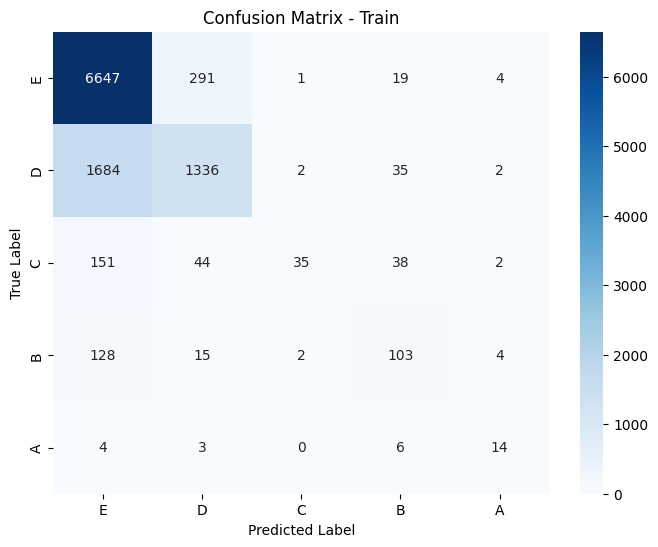

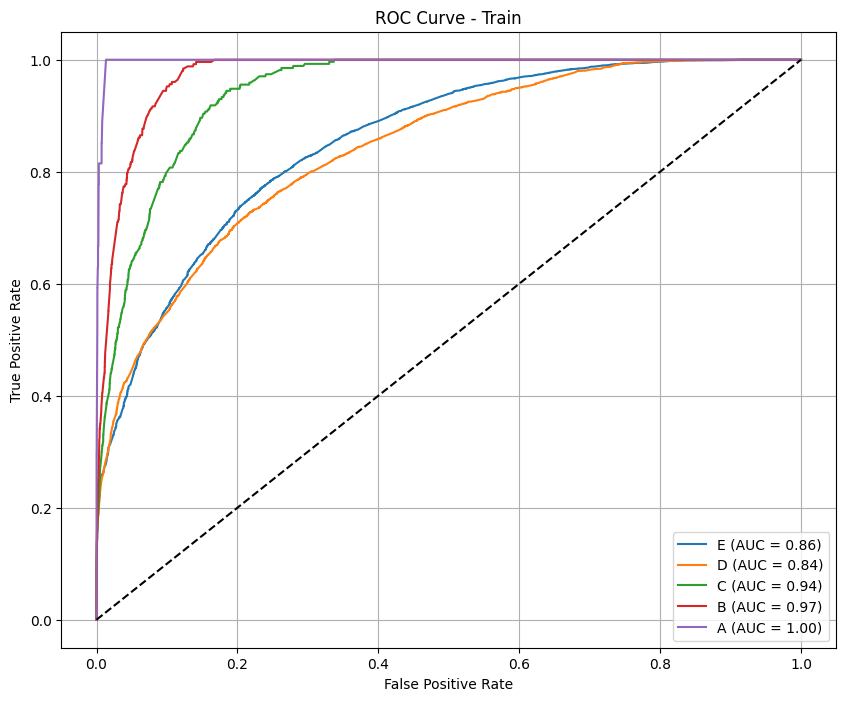


--- Test Metrics ---
F1 Score (per class): [0.91371341 0.4047619  0.         0.         0.        ]
Precision (per class): [0.86950147 0.45945946 0.         0.         0.        ]
Recall (per class): [0.96266234 0.36170213 0.         0.         0.        ]
Accuracy: 0.8294
AUC (One-vs-Rest): 0.8026

Classification Report:
              precision    recall  f1-score   support

           E       0.87      0.96      0.91       616
           D       0.46      0.36      0.40        94
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.83       756
   macro avg       0.27      0.26      0.26       756
weighted avg       0.77      0.83      0.79       756



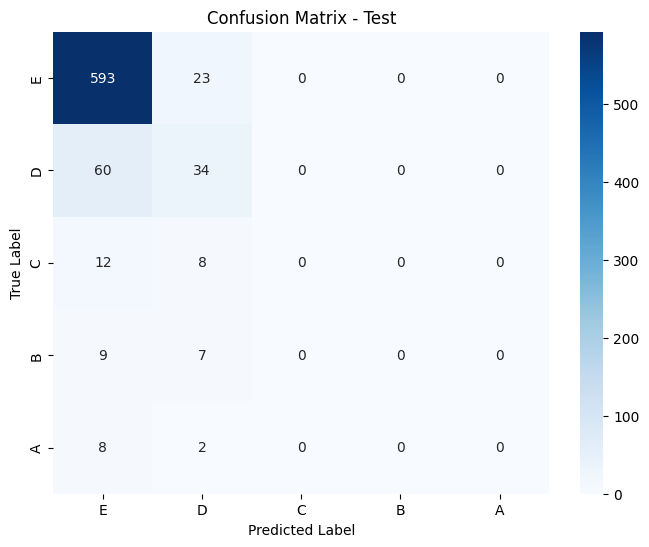

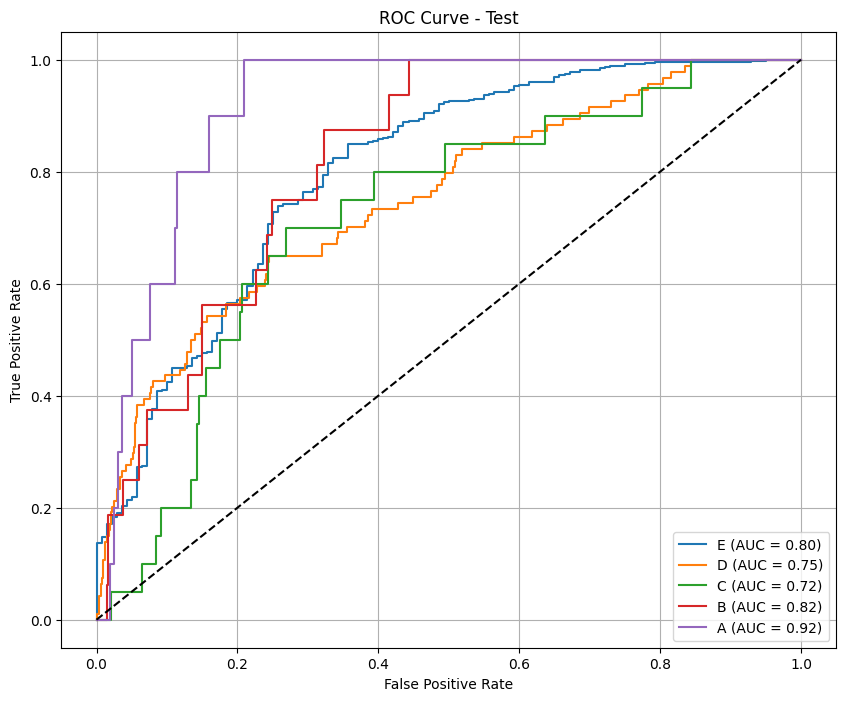

Test predictions saved as test_results_minmax_f1_macro_phase1.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase1 ===

--- Train Metrics ---
F1 Score (per class): [0.83928351 0.4975923  0.09187279 0.13235294 0.35294118]
Precision (per class): [0.73623754 0.83333333 1.         0.9        0.85714286]
Recall (per class): [0.975869   0.35469108 0.04814815 0.07142857 0.22222222]
Accuracy: 0.7489
AUC (One-vs-Rest): 0.9209

Classification Report:
              precision    recall  f1-score   support

           E       0.74      0.98      0.84      6962
           D       0.83      0.35      0.50      3059
           C       1.00      0.05      0.09       270
           B       0.90      0.07      0.13       252
           A       0.86      0.22      0.35        27

    accuracy                           0.75     10570
   macro avg       0.87      0.33      0.38     10570
weighted avg       0.78  

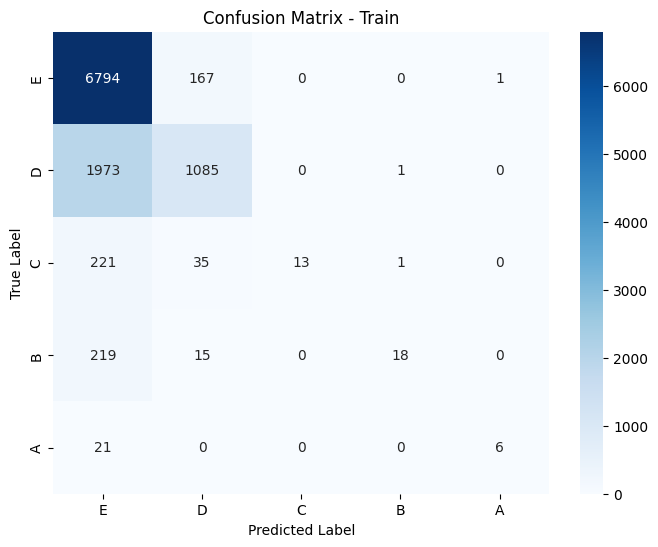

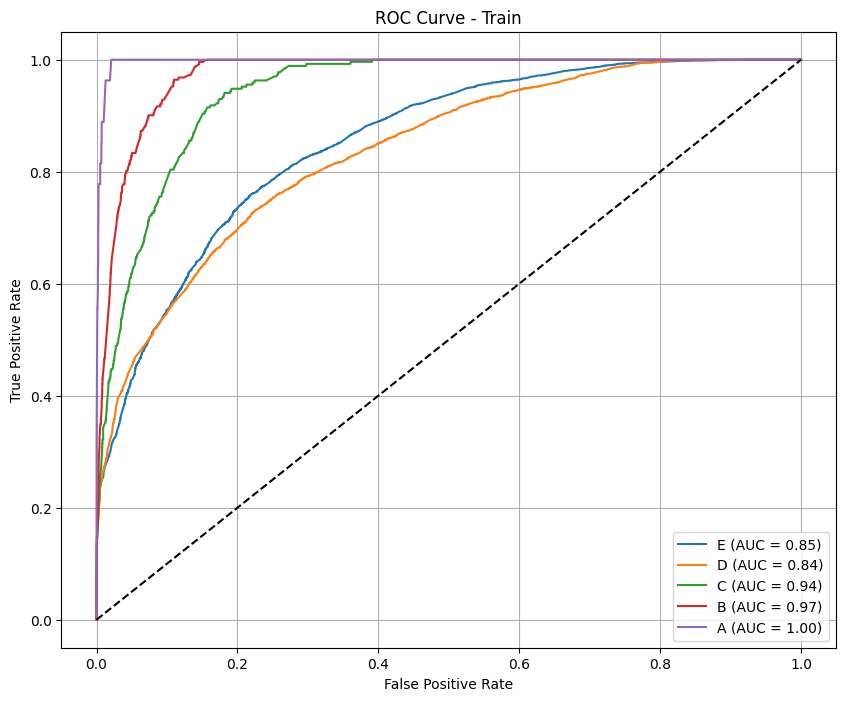


--- Test Metrics ---
F1 Score (per class): [0.91981846 0.375      0.         0.         0.        ]
Precision (per class): [0.8611898 0.54      0.        0.        0.       ]
Recall (per class): [0.98701299 0.28723404 0.         0.         0.        ]
Accuracy: 0.8399
AUC (One-vs-Rest): 0.8285

Classification Report:
              precision    recall  f1-score   support

           E       0.86      0.99      0.92       616
           D       0.54      0.29      0.38        94
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.84       756
   macro avg       0.28      0.25      0.26       756
weighted avg       0.77      0.84      0.80       756



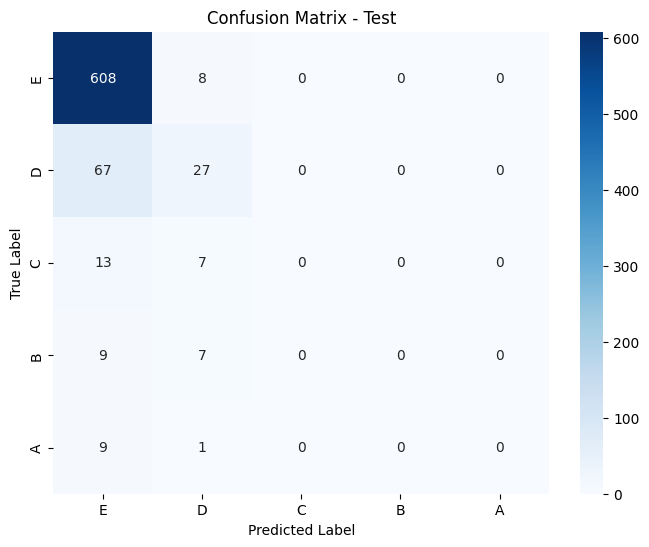

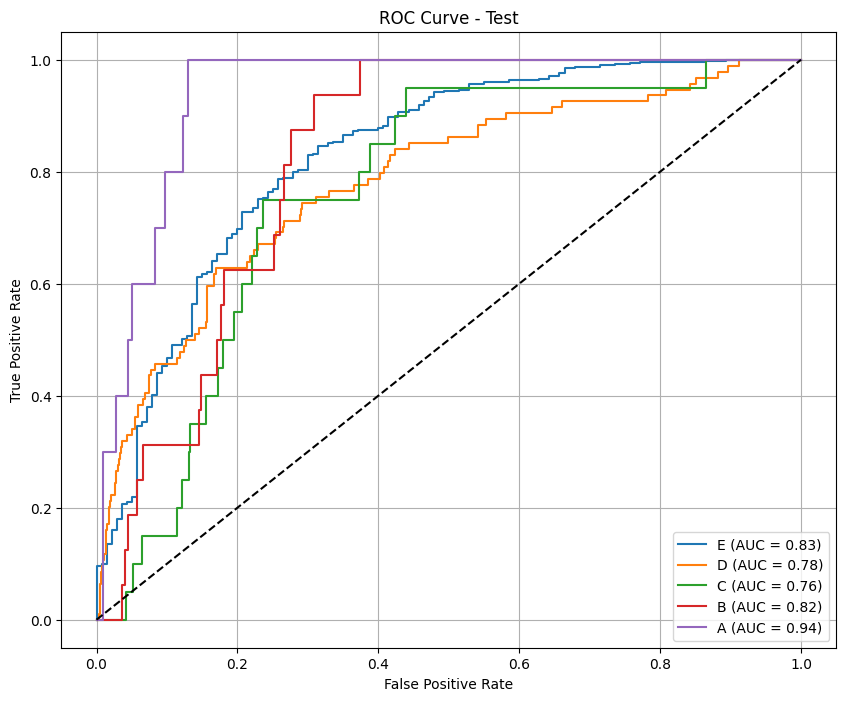

Calibrated predictions saved as test_results_calibrate_minmax_f1_macro_phase1.csv

=== Permutation Importance for phase phase1 ===

=== Permutation Importance (Top Features) ===
exercise_count: 0.0390
remaining_time: 0.0323
video_count: 0.0221
school: 0.0175
total_words_phase1: 0.0141
video: 0.0131
assignment: 0.0130
duration_days: 0.0117
chapter_count: 0.0109
user_month: 0.0090
start_month: 0.0044
num_prerequisites: 0.0043
exercise_correct_sum_1: 0.0040
entropy_time_comment_phase1: 0.0033
total_neutral1: 0.0033
user_time_since_last_course: 0.0028
end_month: 0.0026
user_past_course_count: 0.0025
exercise_perc_real_score_sum_1: 0.0020
total_positive1: 0.0020
exam: 0.0018
exercise_perc_goal_score_mean_1: 0.0017
exercise_context_mean_1: 0.0012
field_encoded_1: 0.0011
exercise_perc_real_completed_mean_1: 0.0010
exercise_diff_max_1: 0.0010
exercise_diff_sum_1: 0.0009
user_year: 0.0008
exercise_num_problem_mean_1: 0.0008
total_negative1: 0.0008
field_encoded_2: 0.0007
exercise_perc_real_corr

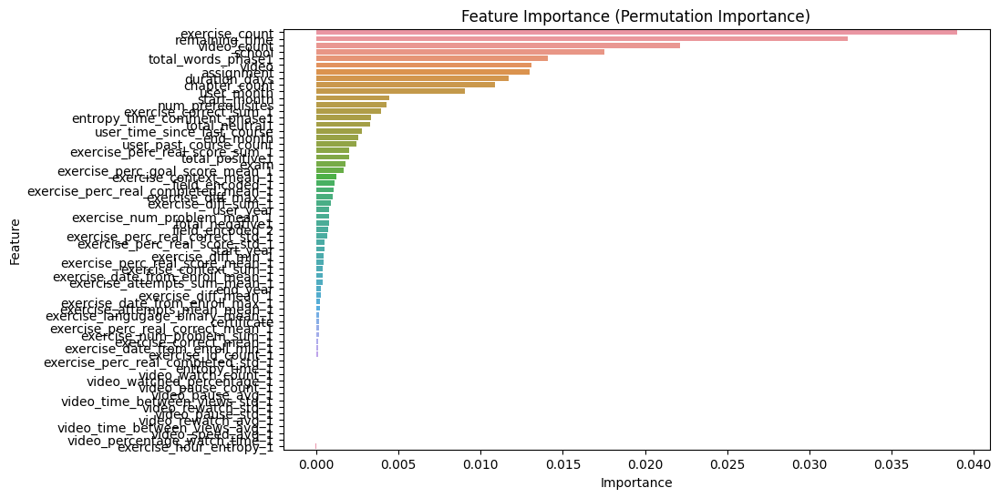


=== Lasso Feature Selection for phase phase1 ===

=== Lasso Feature Importance ===
chapter_count: 1.5836
start_month: 1.0470
exercise_perc_real_score_sum_1: 1.0451
video: 0.9049
start_year: 0.8763
video_count: 0.7833
duration_days: 0.5997
assignment: 0.5595
exercise_count: 0.4585
exercise_perc_real_correct_mean_1: 0.4530
exercise_attempts_mean_mean_1: 0.2888
exercise_langugage_binary_mean_1: 0.2820
total_neutral1: 0.2773
user_year: 0.1770
user_past_course_count: 0.1749
exercise_correct_sum_1: 0.1486
exercise_perc_real_correct_std_1: 0.1380
exercise_id_count_1: 0.1272
exercise_perc_real_completed_std_1: 0.0768
num_prerequisites: 0.0613
school: 0.0454
remaining_time: 0.0440
entropy_time_comment_phase1: 0.0324
field_encoded_1: 0.0278
exercise_date_from_enroll_max_1: 0.0193
exercise_date_from_enroll_mean_1: 0.0101
certificate: 0.0042
user_month: 0.0000
user_time_since_last_course: 0.0000
field_encoded_2: 0.0000
end_year: 0.0000
end_month: 0.0000
exercise_date_from_enroll_min_1: 0.0000
exe

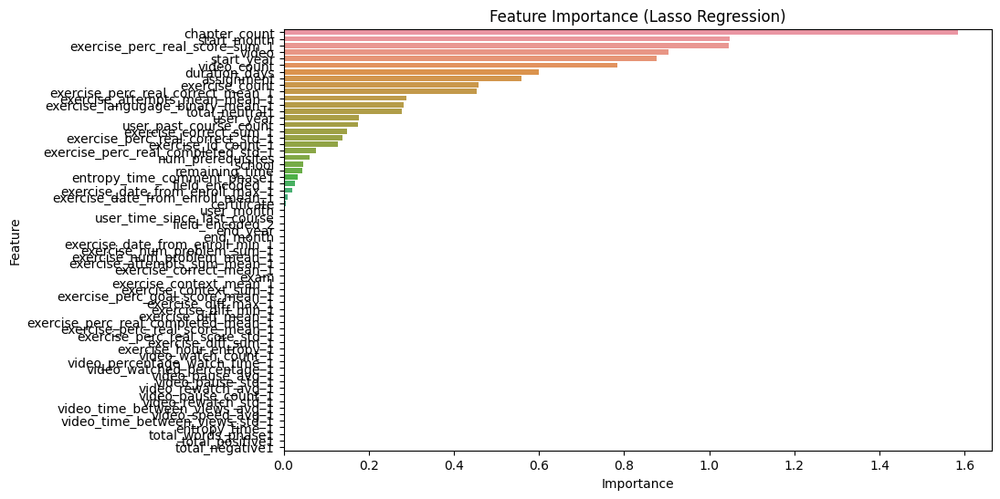


=== Boruta Trick ===

=== Boruta (Trick) Feature Importance ===
remaining_time: 12.3692
Random Feature: 11.9169
school: 9.3383
exercise_count: 8.9688
video: 8.7713
assignment: 7.4043
video_count: 6.7716
duration_days: 5.7612
chapter_count: 5.4935
total_words_phase1: 3.3787
user_month: 3.1581
start_month: 2.5030
num_prerequisites: 1.6211
end_month: 1.5993
total_neutral1: 1.2546
field_encoded_1: 1.0835
user_time_since_last_course: 0.8814
certificate: 0.7692
exercise_correct_sum_1: 0.7533
user_past_course_count: 0.7051
exam: 0.6059
field_encoded_2: 0.4275
entropy_time_comment_phase1: 0.4093
user_year: 0.3664
exercise_perc_real_score_sum_1: 0.3662
start_year: 0.3465
total_positive1: 0.3206
exercise_context_sum_1: 0.3120
exercise_perc_goal_score_mean_1: 0.3077
exercise_perc_real_correct_std_1: 0.2333
exercise_correct_mean_1: 0.2244
exercise_perc_real_correct_mean_1: 0.1969
exercise_num_problem_mean_1: 0.1556
exercise_date_from_enroll_max_1: 0.1368
exercise_perc_real_completed_mean_1: 0.106

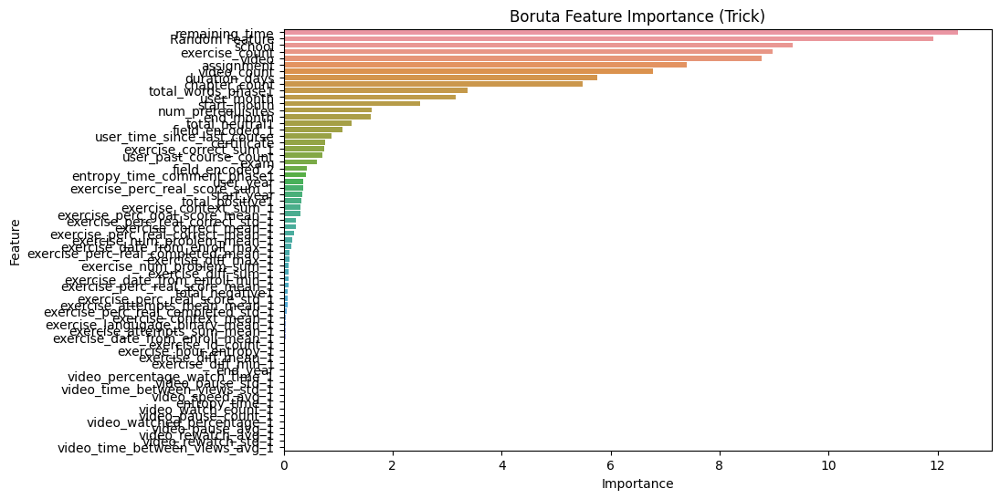


=== Phase phase1 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8548 entries, 0 to 8547
Columns: 113 entries, user_id to label_encoded
dtypes: float64(100), int64(9), object(4)
memory usage: 7.4+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END border_count=64, depth=6, iterations=400, l2_leaf_reg=3, learning_rate=0.15, rsm=0.8; total time=  21.8s
[CV] END border_count=64, depth=9, iterations=300, l2_leaf_reg=3, learning_rate=0.1, rsm=0.8; total time=  51.9s
[CV] END border_count=64, depth=4, iterations=200, l2_leaf_reg=7, learning_rate=0.1, rsm=0.9; total time=   6.1s
[CV] END border_count=64, depth=4, iterations=200, l2_leaf_reg=7, learning_rate=0.1, rsm=0.9; total time=   5.7s
[CV] END border_count=64, depth=4, iterations=200, l2_leaf_reg=7, learning_rate=0.1, rsm=0.9; total time=   6.2s
[CV] END border_count=64, depth=8, iterations=300, l2_leaf_reg=7, learning_rate=0.15, rsm=0.8; total time=  34.9s
[CV] END border_count=64, depth=6, it

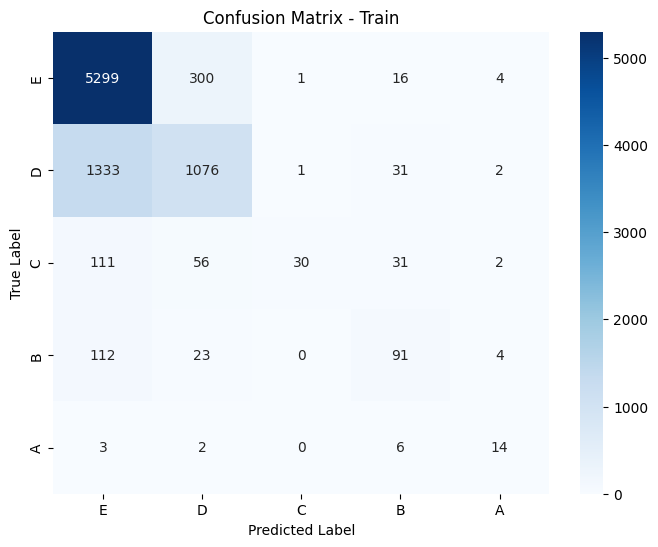

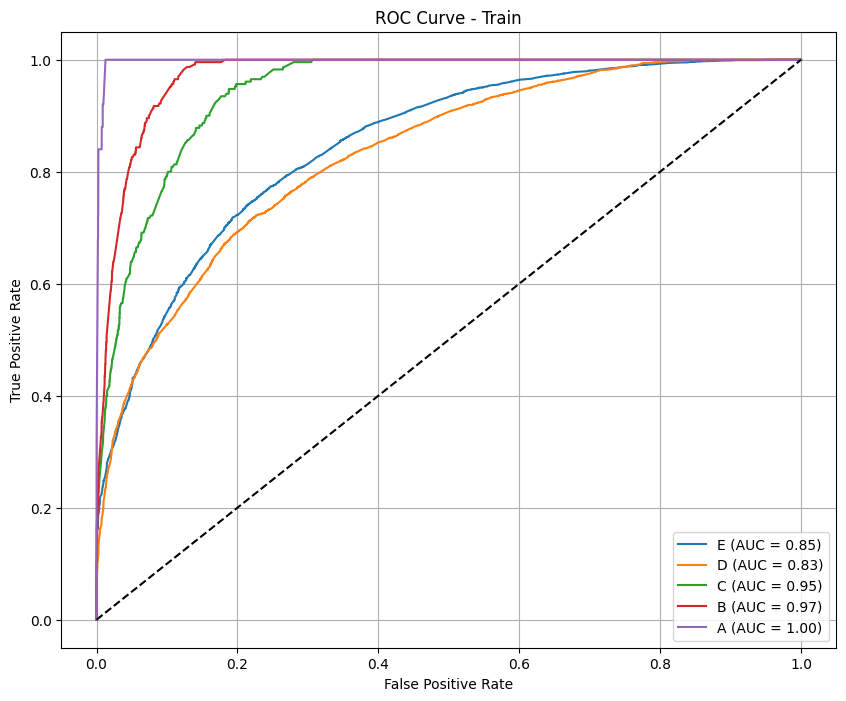


--- Test Metrics ---
F1 Score (per class): [0.910086   0.35928144 0.         0.         0.        ]
Precision (per class): [0.86865672 0.4        0.         0.         0.        ]
Recall (per class): [0.95566502 0.32608696 0.         0.         0.        ]
Accuracy: 0.8204
AUC (One-vs-Rest): 0.7712

Classification Report:
              precision    recall  f1-score   support

           E       0.87      0.96      0.91       609
           D       0.40      0.33      0.36        92
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        15
           A       0.00      0.00      0.00        10

    accuracy                           0.82       746
   macro avg       0.25      0.26      0.25       746
weighted avg       0.76      0.82      0.79       746



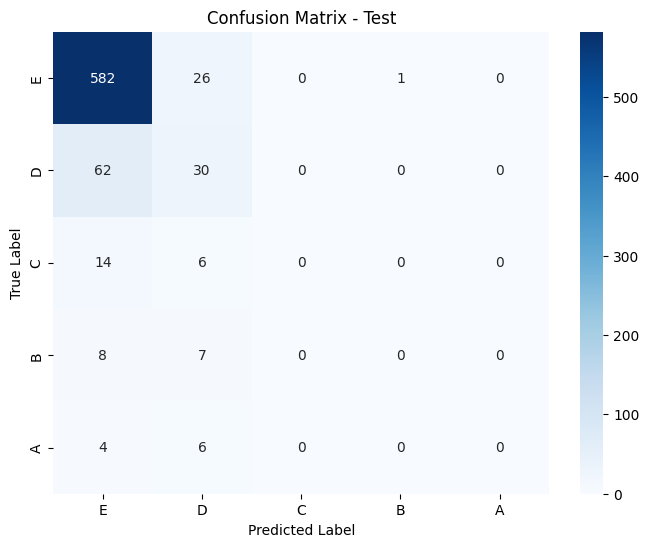

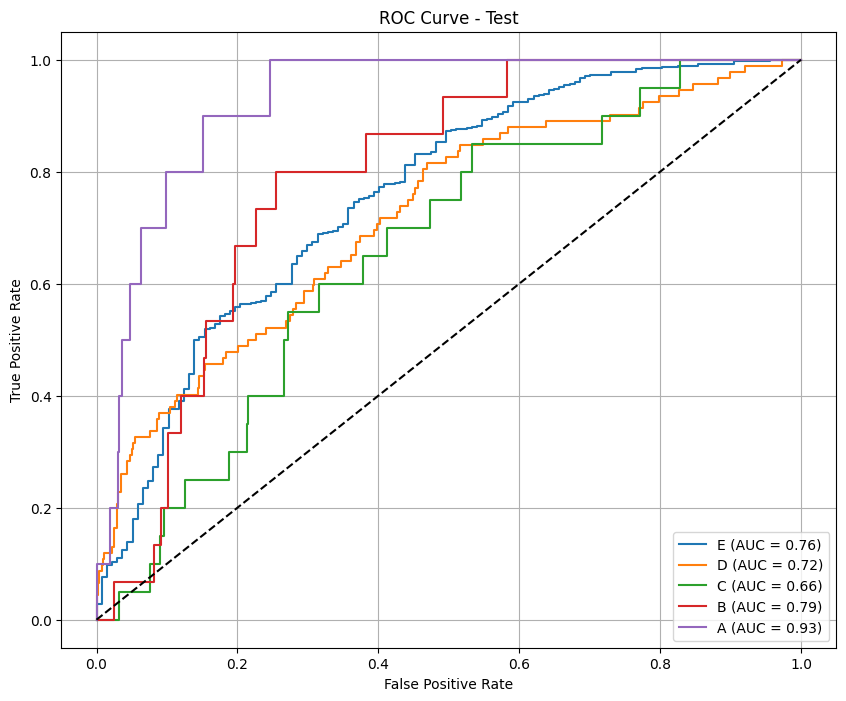

Test predictions saved as test_results_minmax_f1_macro_phase2.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase2 ===

--- Train Metrics ---
F1 Score (per class): [0.82718272 0.42263919 0.06722689 0.09836066 0.32258065]
Precision (per class): [0.71498963 0.85024752 1.         0.85714286 0.83333333]
Recall (per class): [0.98113879 0.28121163 0.03478261 0.05217391 0.2       ]
Accuracy: 0.7284
AUC (One-vs-Rest): 0.9168

Classification Report:
              precision    recall  f1-score   support

           E       0.71      0.98      0.83      5620
           D       0.85      0.28      0.42      2443
           C       1.00      0.03      0.07       230
           B       0.86      0.05      0.10       230
           A       0.83      0.20      0.32        25

    accuracy                           0.73      8548
   macro avg       0.85      0.31      0.35      8548
weighted avg       0.77  

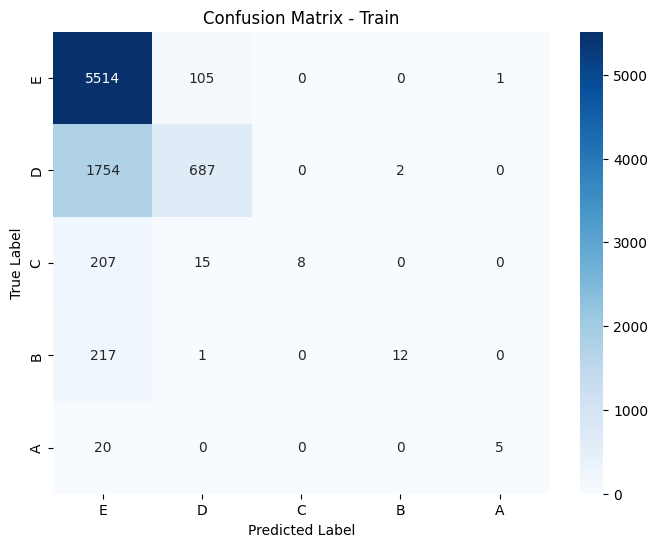

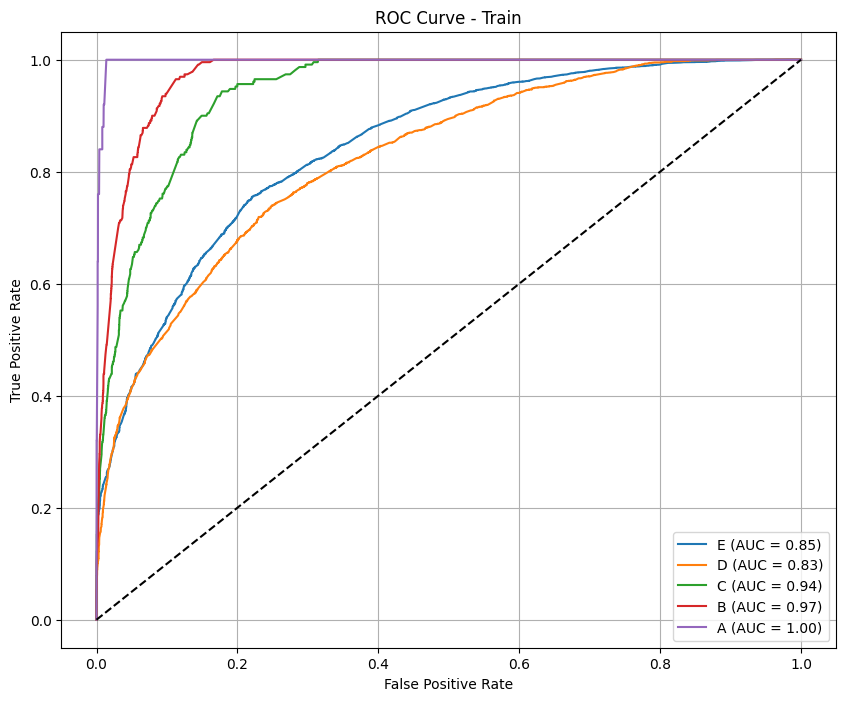


--- Test Metrics ---
F1 Score (per class): [0.90419162 0.16216216 0.         0.         0.        ]
Precision (per class): [0.83081155 0.47368421 0.         0.         0.        ]
Recall (per class): [0.99178982 0.09782609 0.         0.         0.        ]
Accuracy: 0.8217
AUC (One-vs-Rest): 0.7894

Classification Report:
              precision    recall  f1-score   support

           E       0.83      0.99      0.90       609
           D       0.47      0.10      0.16        92
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        15
           A       0.00      0.00      0.00        10

    accuracy                           0.82       746
   macro avg       0.26      0.22      0.21       746
weighted avg       0.74      0.82      0.76       746



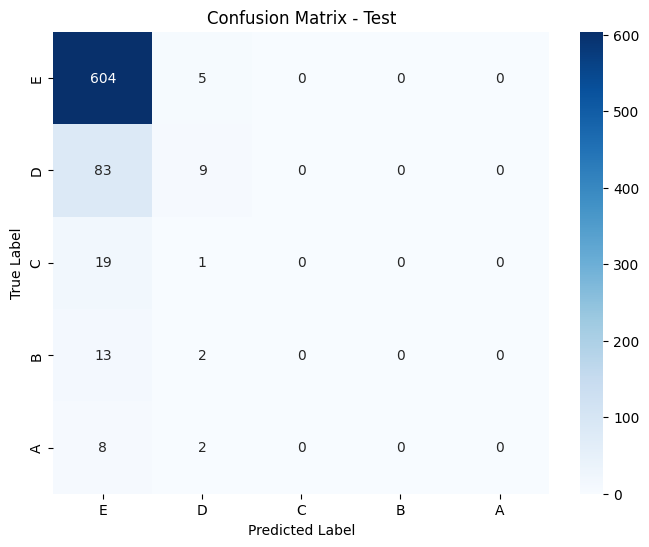

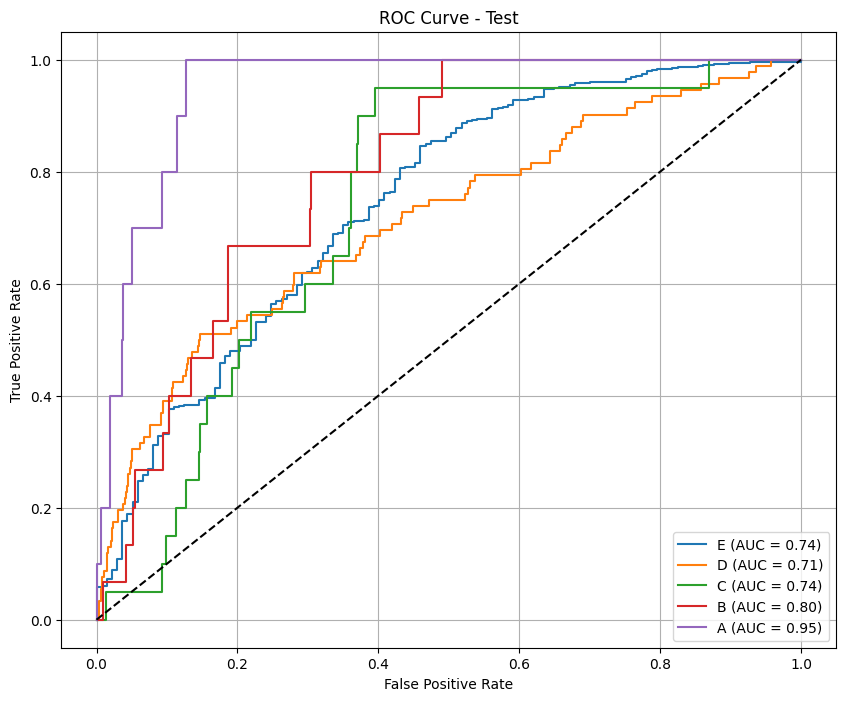

Calibrated predictions saved as test_results_calibrate_minmax_f1_macro_phase2.csv

=== Permutation Importance for phase phase2 ===

=== Permutation Importance (Top Features) ===
exercise_count: 0.0405
remaining_time: 0.0374
school: 0.0259
video_count: 0.0226
video: 0.0168
total_words_phase1: 0.0151
assignment: 0.0148
duration_days: 0.0147
chapter_count: 0.0120
user_month: 0.0090
total_words_phase2: 0.0071
num_prerequisites: 0.0056
start_month: 0.0051
total_neutral1: 0.0043
user_past_course_count: 0.0037
total_positive1: 0.0037
entropy_time_comment_phase1: 0.0032
end_month: 0.0029
exercise_correct_sum_2: 0.0027
user_time_since_last_course: 0.0024
field_encoded_1: 0.0021
total_neutral2: 0.0021
field_encoded_2: 0.0020
exam: 0.0018
entropy_time_comment_phase2: 0.0014
total_positive2: 0.0014
start_year: 0.0010
exercise_perc_real_score_sum_1: 0.0008
total_negative1: 0.0007
total_negative2: 0.0006
certificate: 0.0004
exercise_diff_max_2: 0.0003
exercise_correct_sum_1: 0.0003
exercise_perc_rea

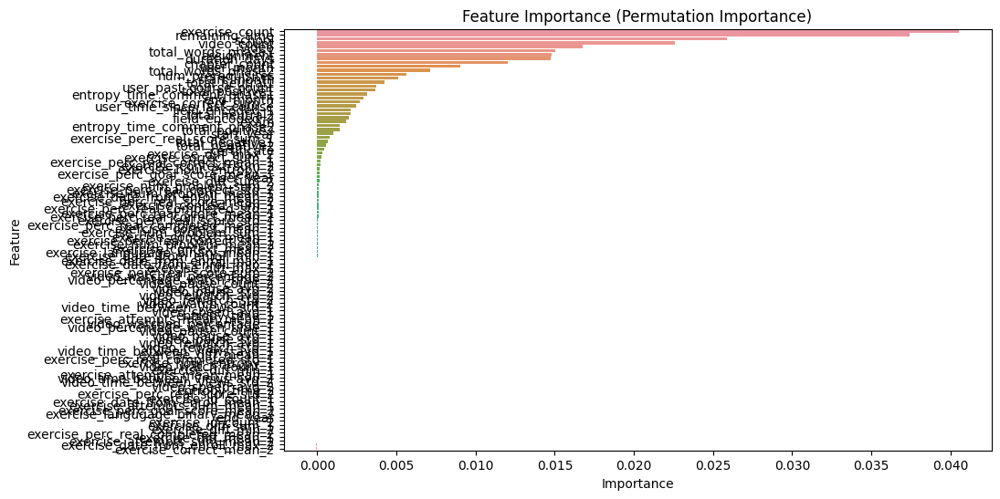


=== Lasso Feature Selection for phase phase2 ===

=== Lasso Feature Importance ===
start_month: 2.3058
start_year: 2.2177
exercise_correct_sum_2: 2.0343
chapter_count: 1.6239
end_year: 1.5427
end_month: 1.4220
total_words_phase1: 1.2738
exercise_correct_sum_1: 1.0230
total_neutral2: 0.9090
video: 0.8848
exercise_num_problem_mean_2: 0.8670
user_past_course_count: 0.8516
video_count: 0.8429
assignment: 0.7483
total_neutral1: 0.6861
total_positive1: 0.5854
exercise_diff_sum_2: 0.5831
exercise_perc_real_score_sum_1: 0.5290
exercise_count: 0.4827
total_positive2: 0.3539
exercise_num_problem_sum_1: 0.3485
exercise_perc_real_completed_std_2: 0.3366
total_negative2: 0.2768
entropy_time_comment_phase2: 0.2672
exercise_id_count_2: 0.2399
user_year: 0.2296
exercise_hour_entropy_2: 0.2215
exercise_langugage_binary_mean_1: 0.2161
exercise_attempts_mean_mean_1: 0.2111
exercise_perc_real_score_std_1: 0.2061
exercise_perc_real_completed_std_1: 0.1868
exercise_perc_real_score_sum_2: 0.1675
exercise_co

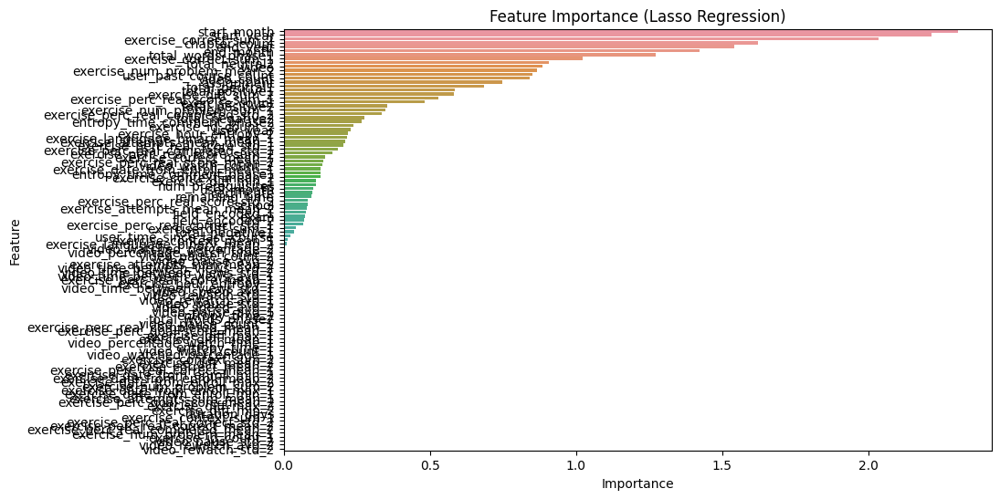


=== Boruta Trick ===

=== Boruta (Trick) Feature Importance ===
remaining_time: 12.9969
Random Feature: 11.2504
school: 10.8790
video: 10.2191
exercise_count: 9.6598
video_count: 8.0542
assignment: 6.7523
chapter_count: 5.3084
duration_days: 3.8709
user_month: 3.7545
num_prerequisites: 2.2167
total_words_phase1: 2.2059
start_month: 2.0021
end_month: 1.6628
total_words_phase2: 1.5558
total_neutral1: 1.0486
user_past_course_count: 0.7765
start_year: 0.7101
total_neutral2: 0.6712
field_encoded_1: 0.6511
exam: 0.6151
user_time_since_last_course: 0.3418
field_encoded_2: 0.3365
entropy_time_comment_phase2: 0.3356
user_year: 0.3356
total_positive1: 0.2990
entropy_time_comment_phase1: 0.2844
certificate: 0.1636
exercise_correct_sum_2: 0.1496
total_positive2: 0.1200
total_negative1: 0.0580
exercise_perc_real_correct_mean_1: 0.0535
exercise_context_mean_2: 0.0485
exercise_context_sum_1: 0.0412
exercise_num_problem_sum_1: 0.0303
exercise_hour_entropy_2: 0.0273
total_negative2: 0.0264
exercise_pe

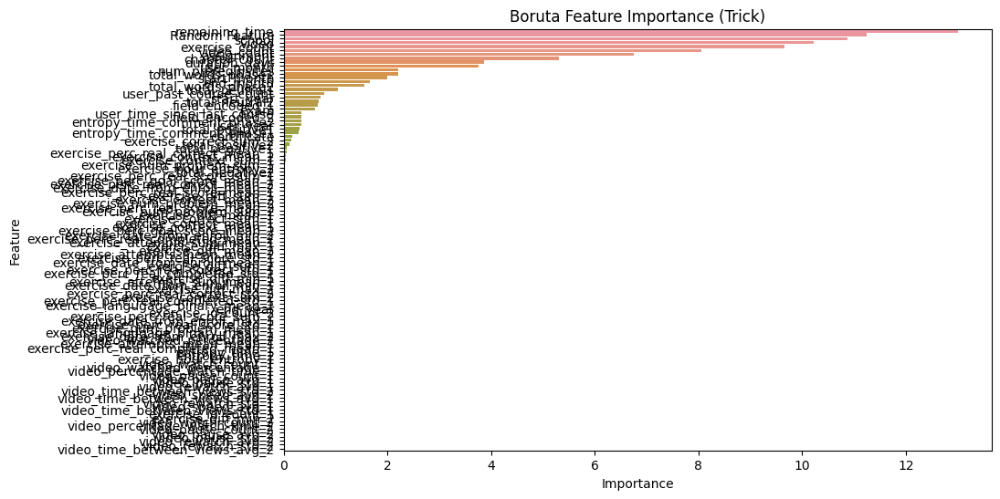


=== Phase phase2 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7803 entries, 0 to 7802
Columns: 156 entries, user_id to label_encoded
dtypes: float64(143), int64(9), object(4)
memory usage: 9.3+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase3: {'rsm': 0.8, 'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 300, 'depth': 9, 'border_count': 64} ===

=== Evaluation for phase phase3 ===

--- Train Metrics ---
F1 Score (per class): [0.85545045 0.57939328 0.30434783 0.49046322 0.46153846]
Precision (per class): [0.78196218 0.75768406 0.94594595 0.5625     0.45      ]
Recall (per class): [0.94418423 0.46902655 0.18134715 0.43478261 0.47368421]
Accuracy: 0.7730
AUC (One-vs-Rest): 0.9299

Classification Report:
              precision    recall  f1-score   support

           E       0.78      0.94      0.86      5124
           D       0.76      0.47      0.58      2260
           C       0.95      0.18      0.30 

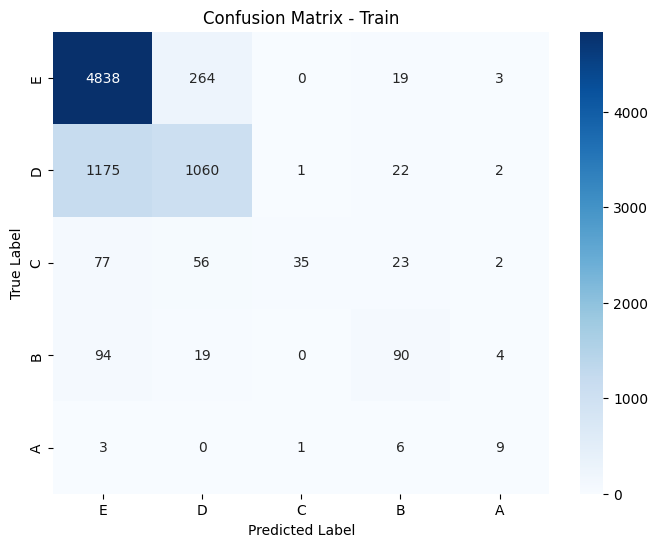

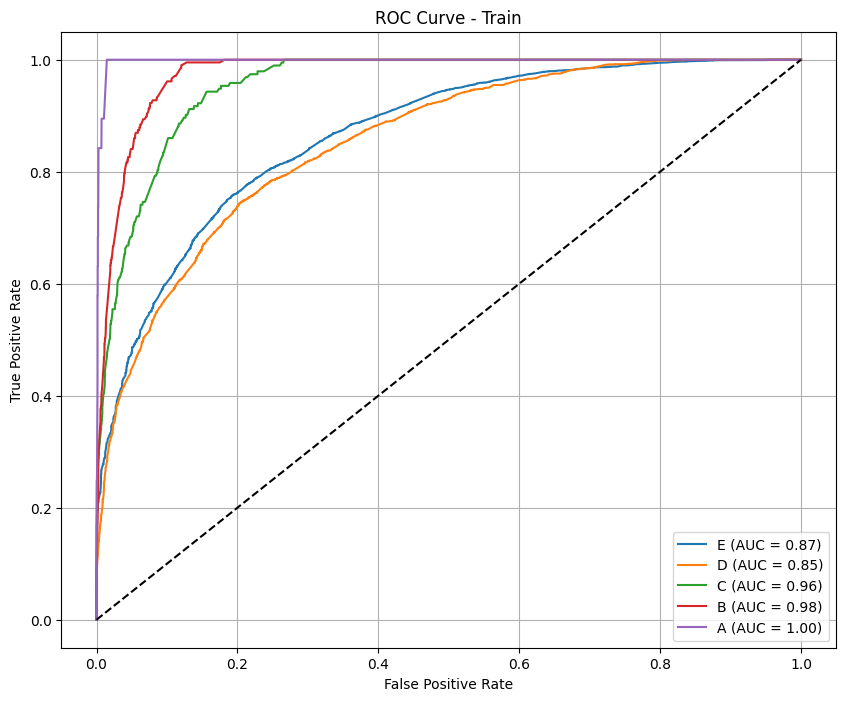


--- Test Metrics ---
F1 Score (per class): [0.89852827 0.0952381  0.         0.         0.        ]
Precision (per class): [0.82503556 0.27777778 0.         0.         0.        ]
Recall (per class): [0.98639456 0.05747126 0.         0.         0.        ]
Accuracy: 0.8114
AUC (One-vs-Rest): 0.7238

Classification Report:
              precision    recall  f1-score   support

           E       0.83      0.99      0.90       588
           D       0.28      0.06      0.10        87
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.81       721
   macro avg       0.22      0.21      0.20       721
weighted avg       0.71      0.81      0.74       721



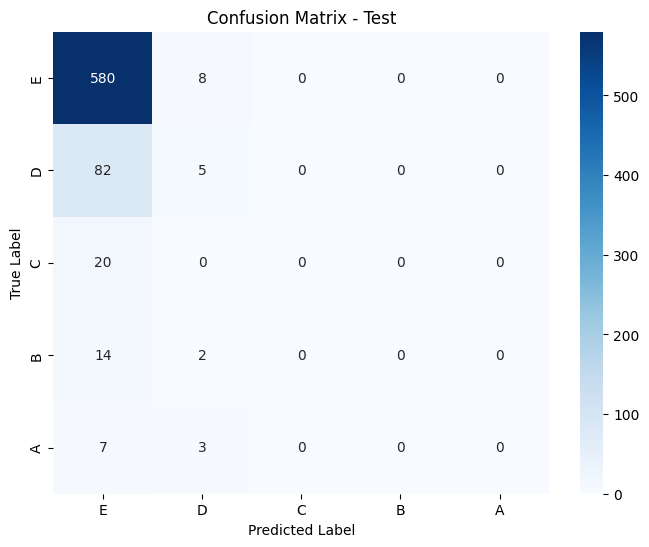

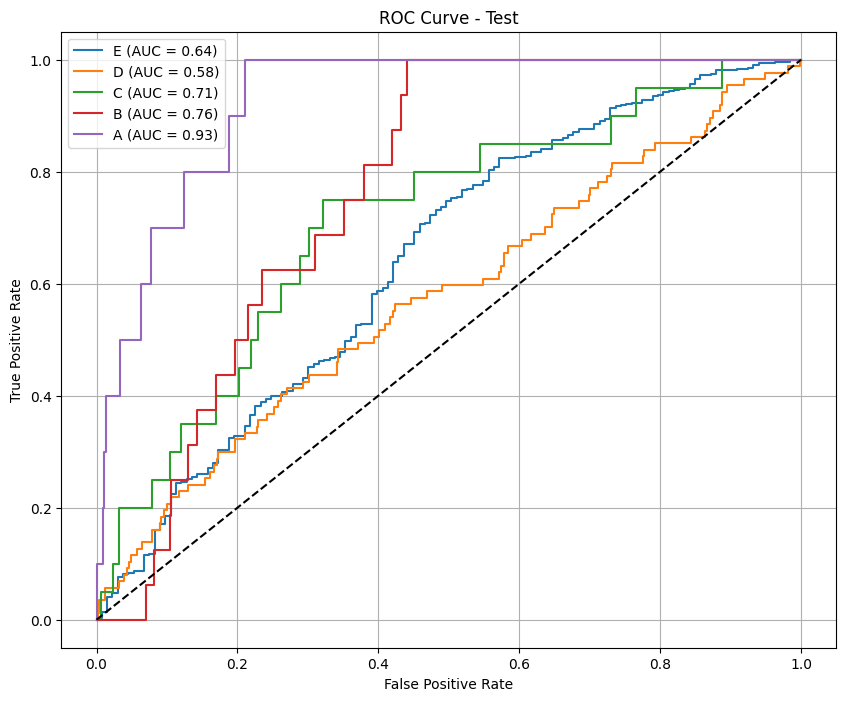

Test predictions saved as test_results_minmax_f1_macro_phase3.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase3 ===

--- Train Metrics ---
F1 Score (per class): [0.83577128 0.46367452 0.09852217 0.26771654 0.1       ]
Precision (per class): [0.72785177 0.85782557 1.         0.72340426 1.        ]
Recall (per class): [0.98126464 0.31769912 0.05181347 0.16425121 0.05263158]
Accuracy: 0.7422
AUC (One-vs-Rest): 0.9271

Classification Report:
              precision    recall  f1-score   support

           E       0.73      0.98      0.84      5124
           D       0.86      0.32      0.46      2260
           C       1.00      0.05      0.10       193
           B       0.72      0.16      0.27       207
           A       1.00      0.05      0.10        19

    accuracy                           0.74      7803
   macro avg       0.86      0.31      0.35      7803
weighted avg       0.77  

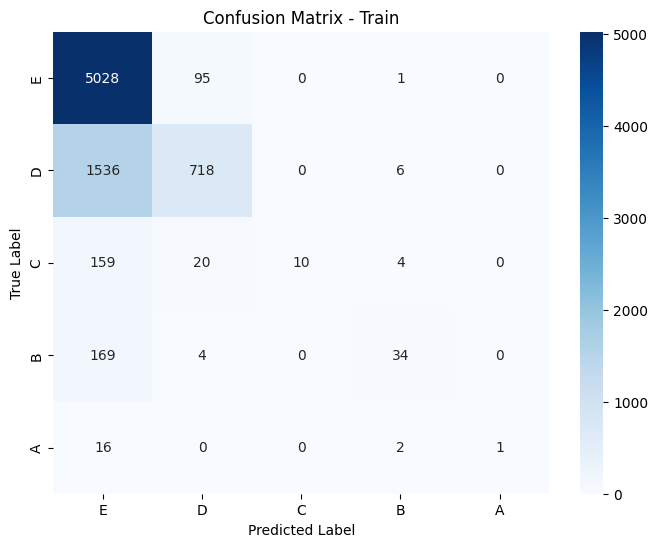

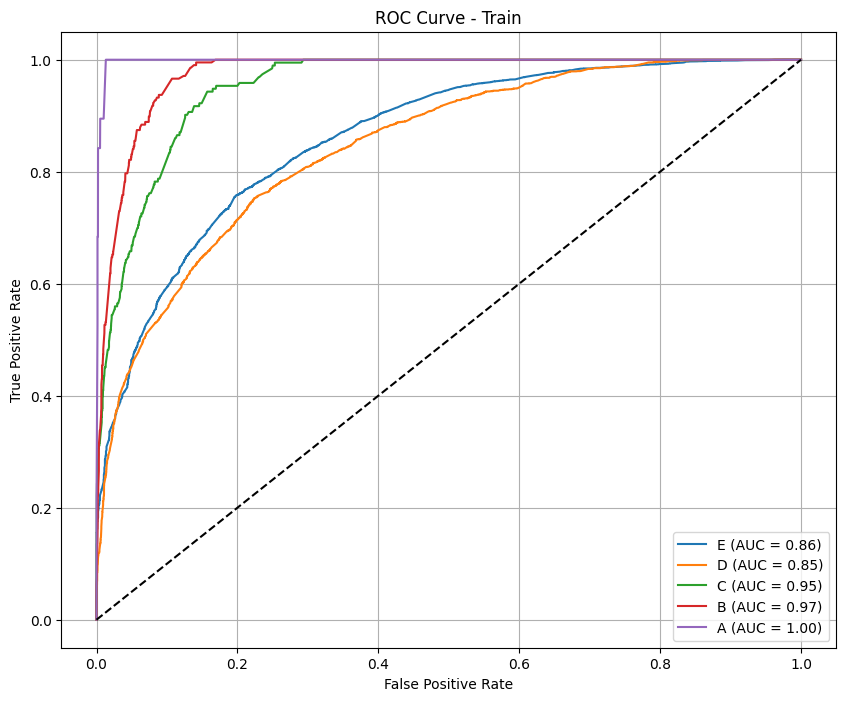


--- Test Metrics ---
F1 Score (per class): [0.89824024 0.02247191 0.         0.         0.        ]
Precision (per class): [0.81641168 0.5        0.         0.         0.        ]
Recall (per class): [0.99829932 0.01149425 0.         0.         0.        ]
Accuracy: 0.8155
AUC (One-vs-Rest): 0.7230

Classification Report:
              precision    recall  f1-score   support

           E       0.82      1.00      0.90       588
           D       0.50      0.01      0.02        87
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.82       721
   macro avg       0.26      0.20      0.18       721
weighted avg       0.73      0.82      0.74       721



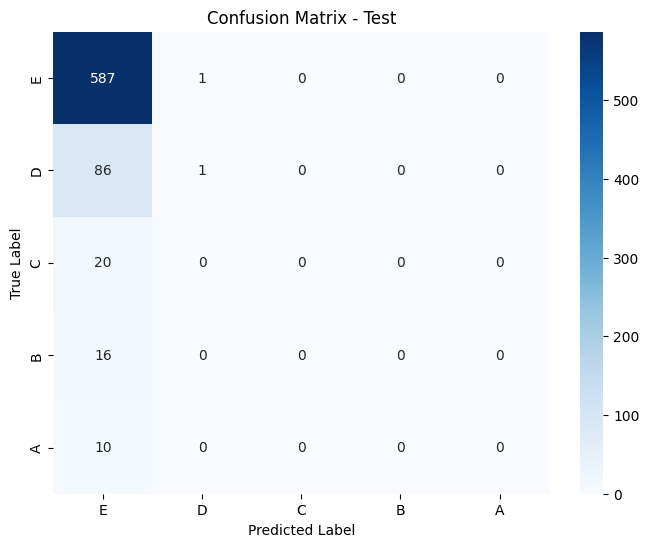

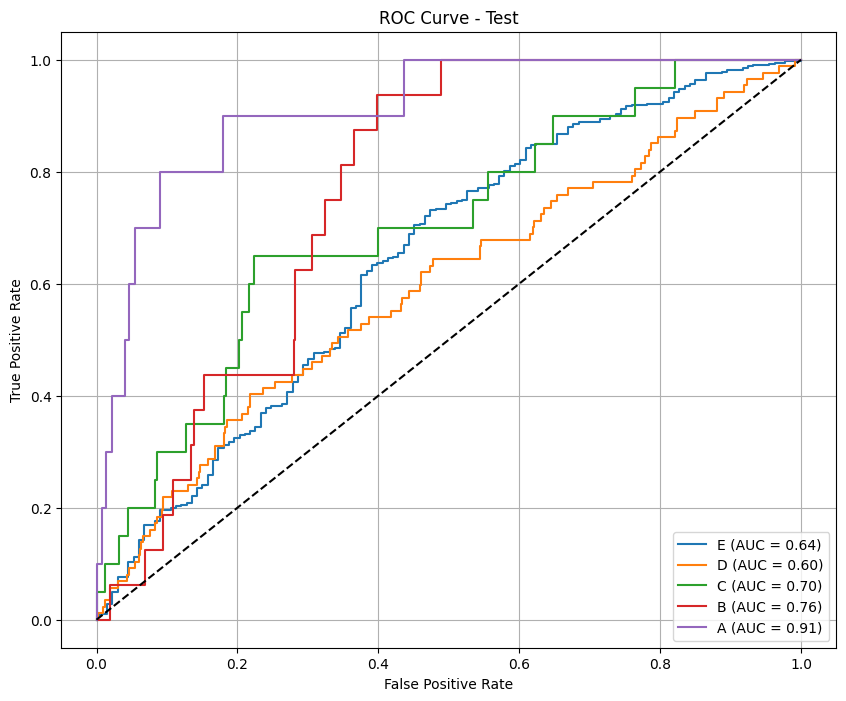

Calibrated predictions saved as test_results_calibrate_minmax_f1_macro_phase3.csv

=== Phase phase3 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5363 entries, 0 to 5362
Columns: 199 entries, user_id to label_encoded
dtypes: float64(186), int64(9), object(4)
memory usage: 8.1+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase4: {'rsm': 0.8, 'learning_rate': 0.15, 'l2_leaf_reg': 7, 'iterations': 300, 'depth': 8, 'border_count': 64} ===

=== Evaluation for phase phase4 ===

--- Train Metrics ---
F1 Score (per class): [0.86004162 0.61532508 0.34375    0.51020408 0.4375    ]
Precision (per class): [0.79071992 0.79341317 0.81481481 0.55555556 0.38888889]
Recall (per class): [0.94268606 0.50252845 0.21782178 0.47169811 0.5       ]
Accuracy: 0.7841
AUC (One-vs-Rest): 0.9328

Classification Report:
              precision    recall  f1-score   support

           E       0.79      0.94      0.86      3507
           D   

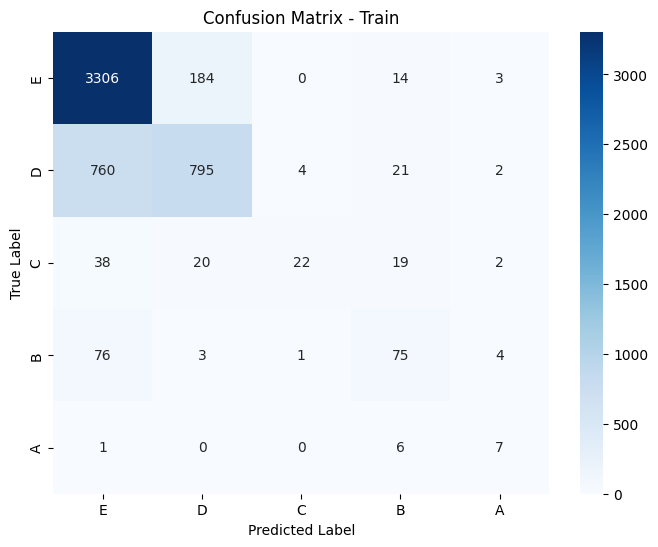

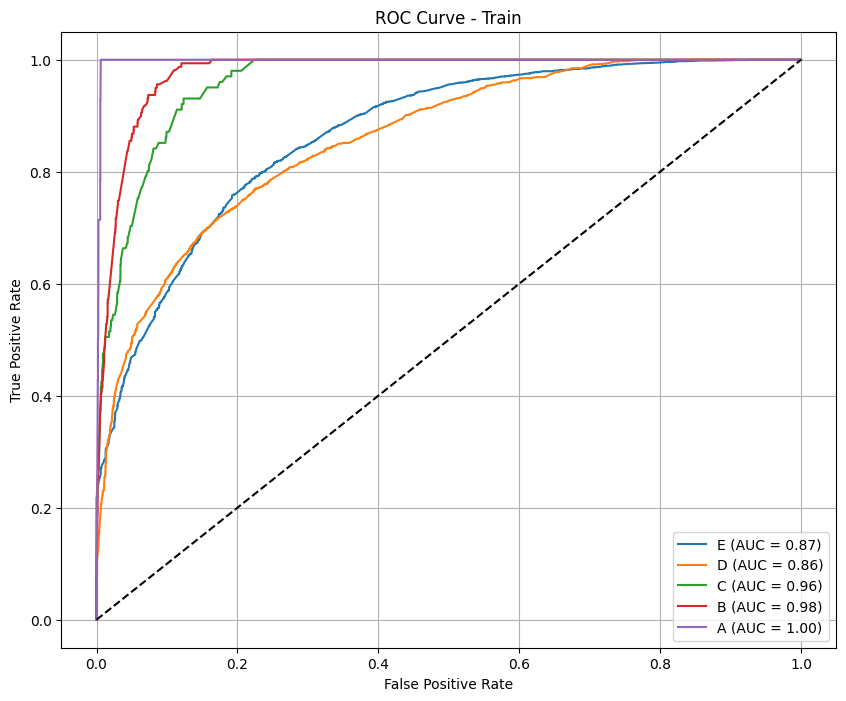


--- Test Metrics ---
F1 Score (per class): [0.87980376 0.01923077 0.         0.         0.        ]
Precision (per class): [0.80538922 0.05263158 0.         0.         0.        ]
Recall (per class): [0.96936937 0.01176471 0.         0.         0.        ]
Accuracy: 0.7846
AUC (One-vs-Rest): 0.6515

Classification Report:
              precision    recall  f1-score   support

           E       0.81      0.97      0.88       555
           D       0.05      0.01      0.02        85
           C       0.00      0.00      0.00        18
           B       0.00      0.00      0.00        18
           A       0.00      0.00      0.00        11

    accuracy                           0.78       687
   macro avg       0.17      0.20      0.18       687
weighted avg       0.66      0.78      0.71       687



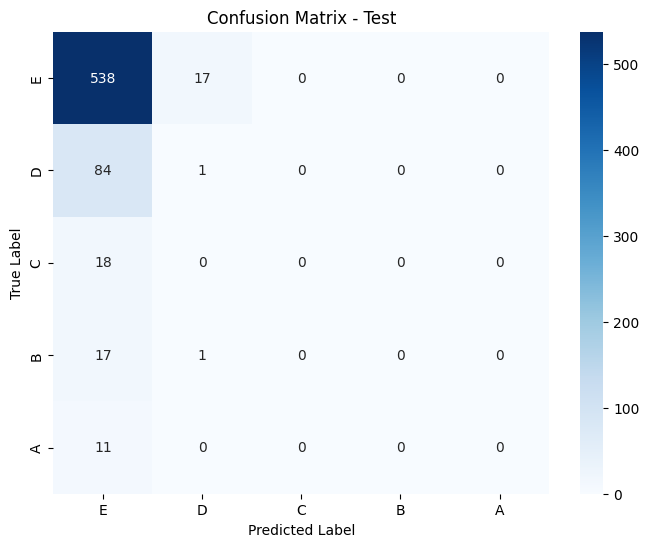

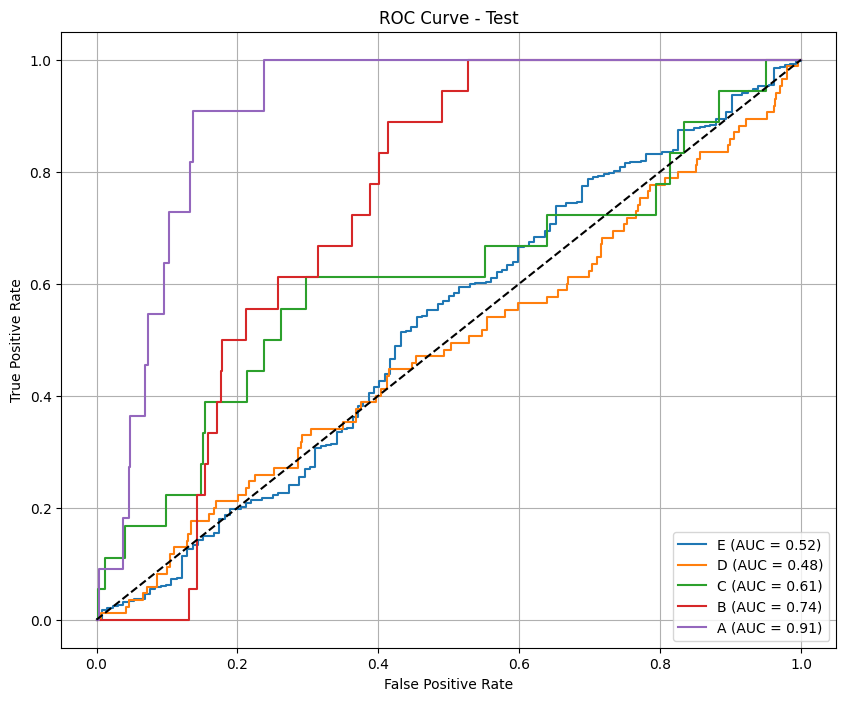

Test predictions saved as test_results_minmax_f1_macro_phase4.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase4 ===

--- Train Metrics ---
F1 Score (per class): [0.84478936 0.5070922  0.32520325 0.39069767 0.        ]
Precision (per class): [0.74365647 0.84866469 0.90909091 0.75       0.        ]
Recall (per class): [0.97775877 0.36156764 0.1980198  0.26415094 0.        ]
Accuracy: 0.7576
AUC (One-vs-Rest): 0.9304

Classification Report:
              precision    recall  f1-score   support

           E       0.74      0.98      0.84      3507
           D       0.85      0.36      0.51      1582
           C       0.91      0.20      0.33       101
           B       0.75      0.26      0.39       159
           A       0.00      0.00      0.00        14

    accuracy                           0.76      5363
   macro avg       0.65      0.36      0.41      5363
weighted avg       0.78  

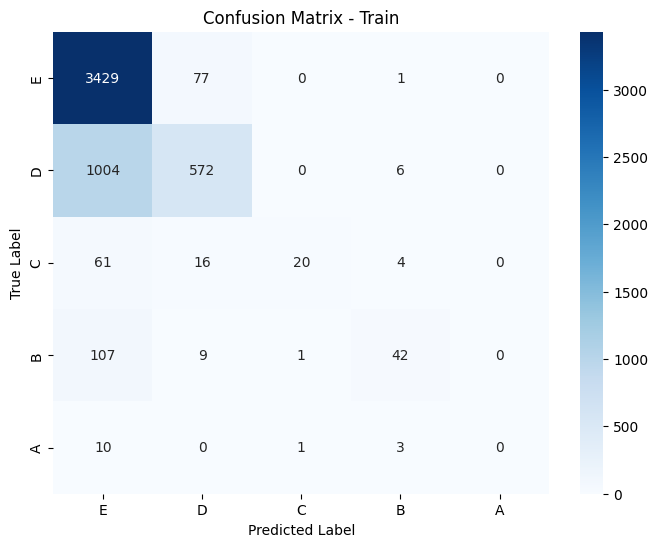

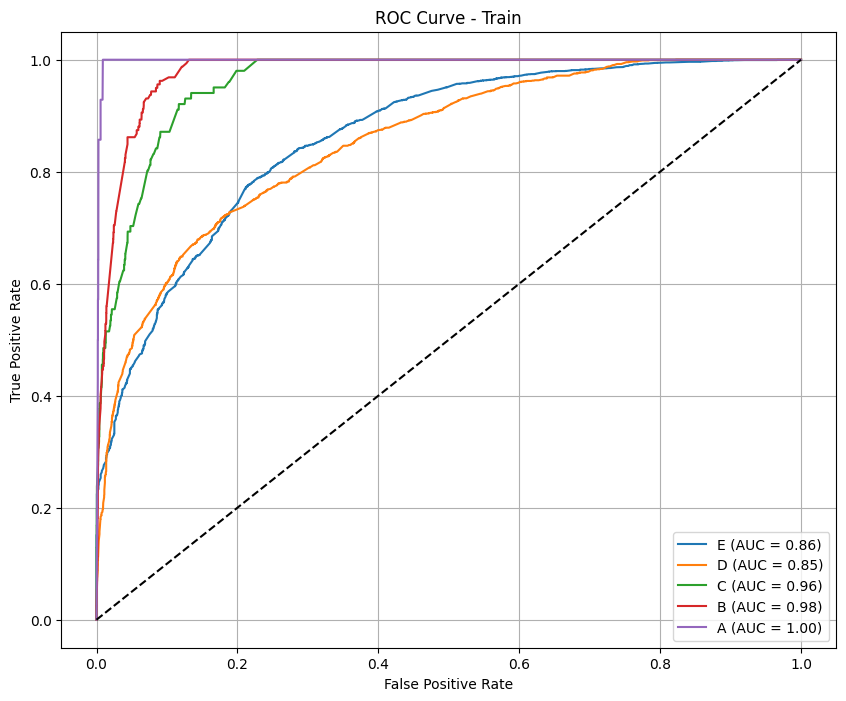


--- Test Metrics ---
F1 Score (per class): [0.89282836 0.         0.         0.         0.        ]
Precision (per class): [0.80758017 0.         0.         0.         0.        ]
Recall (per class): [0.9981982 0.        0.        0.        0.       ]
Accuracy: 0.8064
AUC (One-vs-Rest): 0.6381

Classification Report:
              precision    recall  f1-score   support

           E       0.81      1.00      0.89       555
           D       0.00      0.00      0.00        85
           C       0.00      0.00      0.00        18
           B       0.00      0.00      0.00        18
           A       0.00      0.00      0.00        11

    accuracy                           0.81       687
   macro avg       0.16      0.20      0.18       687
weighted avg       0.65      0.81      0.72       687



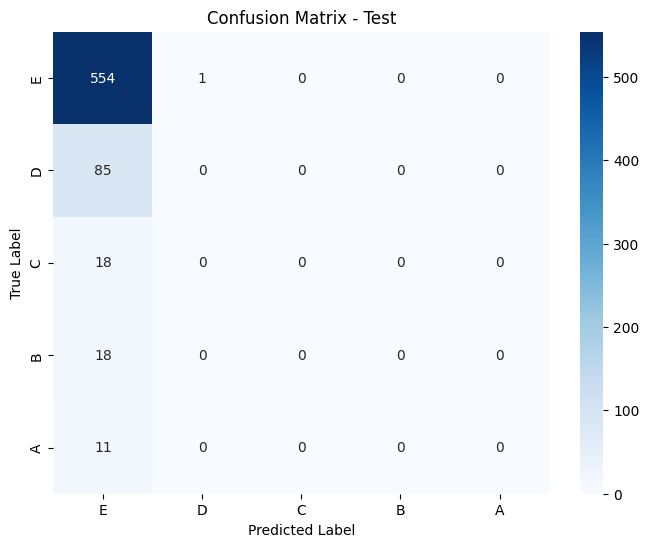

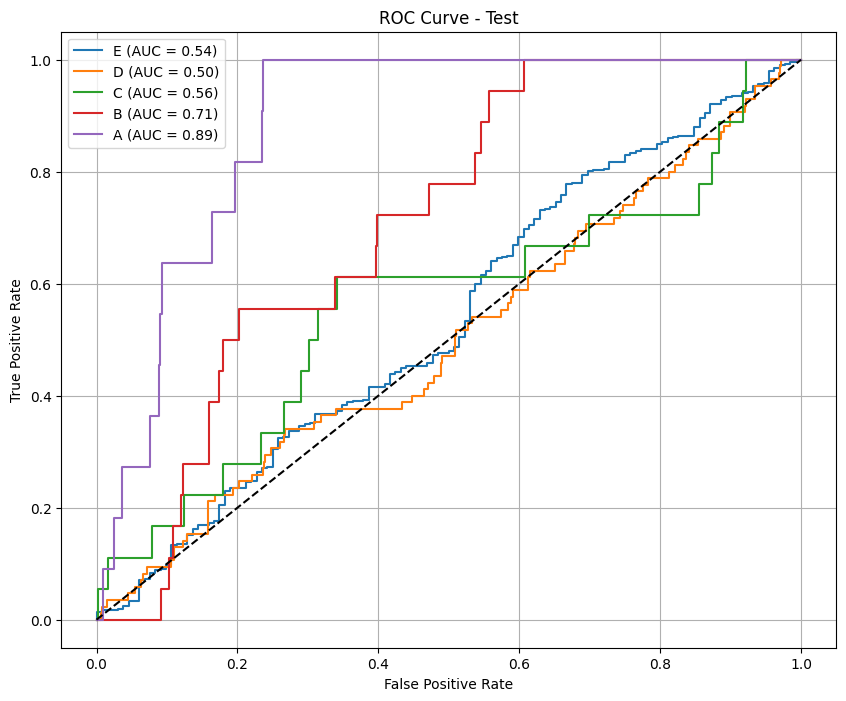

Calibrated predictions saved as test_results_calibrate_minmax_f1_macro_phase4.csv

=== Phase phase4 completed ===


In [12]:
# Lặp qua các phase
for phase in ["phase1", "phase2", "phase3", "phase4"]:
    process_phase(phase, metric='f1_macro')

# 3. Scale dữ liệu theo Robust 

In [13]:
def process_phase(phase, scale='robust', metric='accuracy'):
    # Load dữ liệu
    X_train, y_train, X_test, y_test = load_data(phase)

    # Scale dữ liệu
    X_train_scaled, X_test_scaled = scale_data(X_train, X_test, scaler_type=scale)
    X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

    # StratifiedKFold
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Định nghĩa mô hình
    model = CatBoostClassifier(random_state=42, verbose=0)

    # Tham số tìm kiếm
    param_grid = {
        'iterations': [100, 200, 300, 400],
        'depth': [4, 6, 8, 9],
        'learning_rate': [0.01, 0.05, 0.1, 0.15],
        'l2_leaf_reg': [1, 3, 5, 7],
        'border_count': [32, 64],
        'rsm': [0.7, 0.8, 0.9],
    }

    # RandomizedSearchCV
    randomized_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=10,
        cv=skf,
        scoring=metric,
        random_state=42,
        n_jobs=-1,
        verbose=2
    )

    # Train mô hình
    randomized_search.fit(X_train_scaled, y_train)

    best_model = randomized_search.best_estimator_
    best_params = randomized_search.best_params_
    print(f"\n=== Best Parameters for phase {phase}: {best_params} ===")

    # Đánh giá mô hình trước calibrate
    print(f"\n=== Evaluation for phase {phase} ===")
    eval_results = evaluate_model(best_model, X_train_scaled, y_train, X_test_scaled, y_test)

    # Lưu kết quả dự đoán
    y_test_pred = best_model.predict(X_test_scaled)
    results_df = X_test.copy()
    results_df['True_Label'] = y_test
    results_df['Predicted_Label'] = y_test_pred
    filename = f"test_results_{scale}_{metric}_{phase}.csv"
    results_df.to_csv(filename, index=False)
    print(f"Test predictions saved as {filename}")

    # Calibrate mô hình
    calibrated_model = calibrate_model(best_model, X_train_scaled, y_train)

    # Đánh giá mô hình sau calibrate
    print(f"\n=== Evaluation after calibration for phase {phase} ===")
    eval_results_cal = evaluate_model(calibrated_model, X_train_scaled, y_train, X_test_scaled, y_test)

    # Lưu kết quả dự đoán sau calibrate
    y_calibrated_pred = calibrated_model.predict(X_test_scaled)
    results_df['Calibrated_Predicted_Label'] = y_calibrated_pred
    filename_cal = f"test_results_calibrate_{scale}_{metric}_{phase}.csv"
    results_df.to_csv(filename_cal, index=False)
    print(f"Calibrated predictions saved as {filename_cal}")

    # Nếu phase 1 hoặc 2 → chọn feature
    if int(phase[-1]) <= 2:
        print(f"\n=== Permutation Importance for phase {phase} ===")
        perm_importance = plot_permutation_importance(best_model, X_train_scaled, y_train)
        perm_importance.to_csv(f"perm_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

        print(f"\n=== Lasso Feature Selection for phase {phase} ===")
        selected_features, lasso_importance = lasso_feature_selection(X_train_scaled, y_train)
        lasso_importance.to_csv(f"lasso_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

        print("\n=== Boruta Trick ===")
        boruta_model = CatBoostClassifier(**best_params, random_state=42, verbose=0)
        important_features = boruta_trick(boruta_model, X_train_scaled, y_train)
        important_features.to_csv(f"boruta_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

    print(f"\n=== Phase {phase} completed ===")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10570 entries, 0 to 10569
Data columns (total 70 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   user_id                              10570 non-null  object 
 1   school                               6715 non-null   object 
 2   course_id                            10570 non-null  object 
 3   field_encoded_1                      10570 non-null  int64  
 4   field_encoded_2                      10570 non-null  int64  
 5   start_year                           10570 non-null  float64
 6   start_month                          10570 non-null  float64
 7   end_year                             10570 non-null  float64
 8   end_month                            10570 non-null  float64
 9   user_year                            10570 non-null  float64
 10  user_month                           10570 non-null  float64
 11  video_count                 

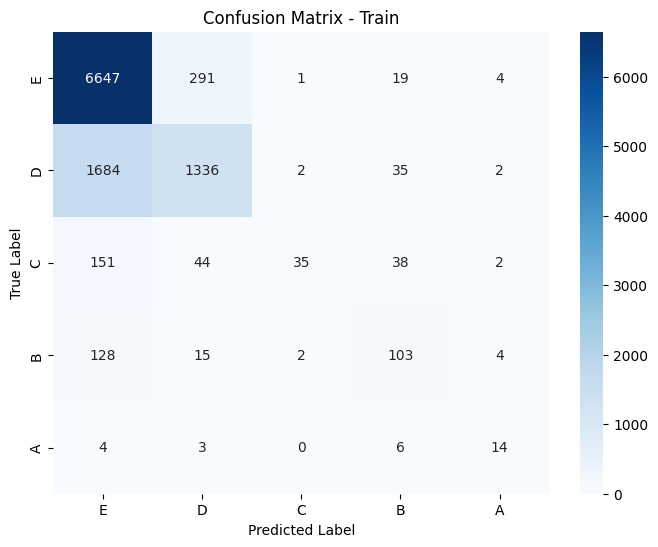

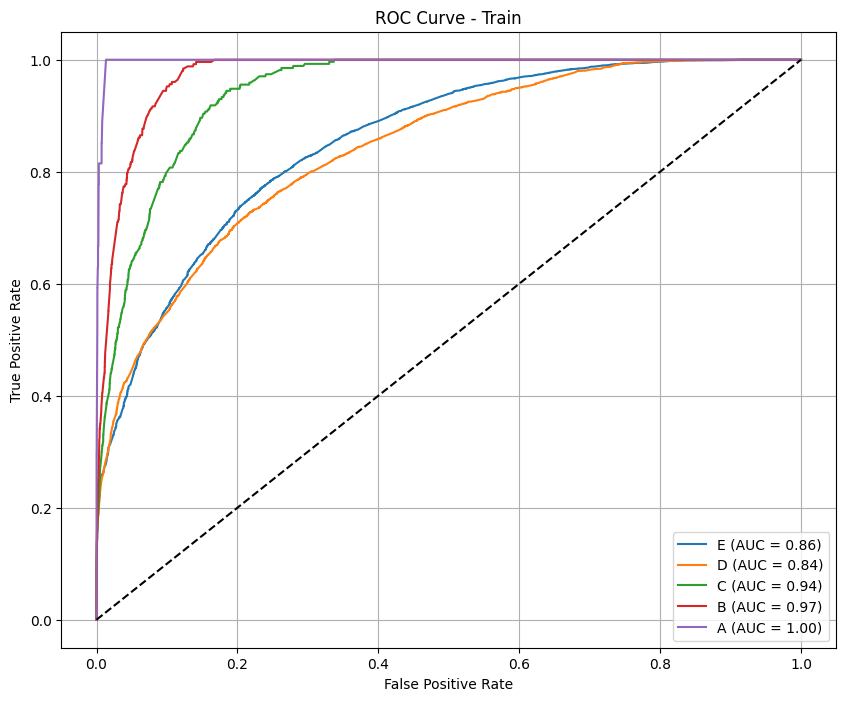


--- Test Metrics ---
F1 Score (per class): [0.91371341 0.4047619  0.         0.         0.        ]
Precision (per class): [0.86950147 0.45945946 0.         0.         0.        ]
Recall (per class): [0.96266234 0.36170213 0.         0.         0.        ]
Accuracy: 0.8294
AUC (One-vs-Rest): 0.8024

Classification Report:
              precision    recall  f1-score   support

           E       0.87      0.96      0.91       616
           D       0.46      0.36      0.40        94
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.83       756
   macro avg       0.27      0.26      0.26       756
weighted avg       0.77      0.83      0.79       756



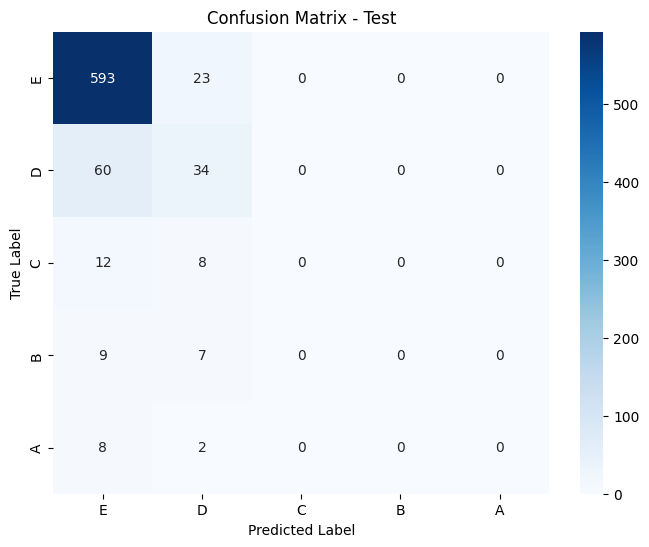

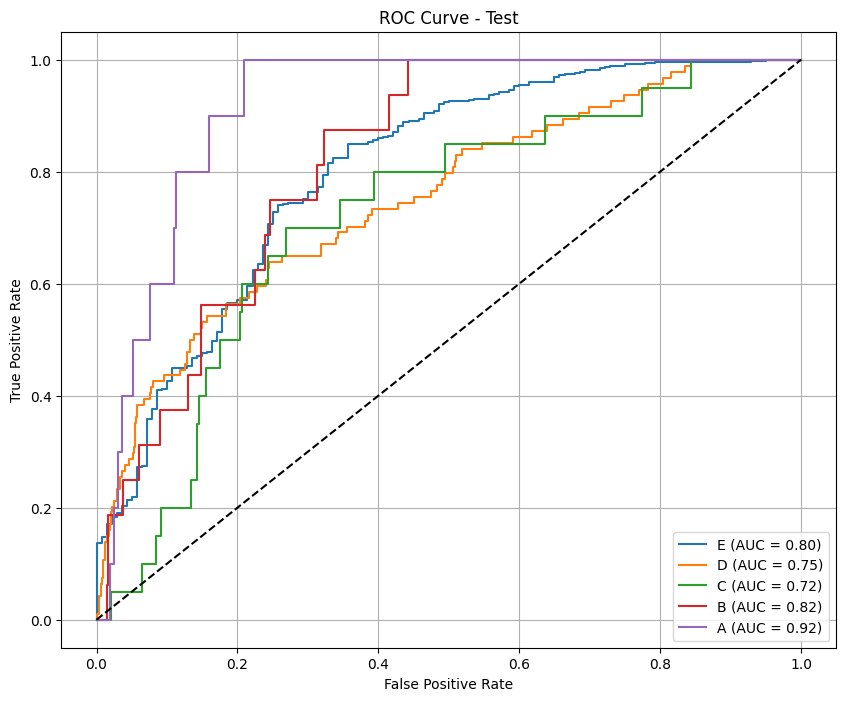

Test predictions saved as test_results_robust_f1_macro_phase1.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase1 ===

--- Train Metrics ---
F1 Score (per class): [0.83928351 0.4975923  0.09187279 0.13235294 0.35294118]
Precision (per class): [0.73623754 0.83333333 1.         0.9        0.85714286]
Recall (per class): [0.975869   0.35469108 0.04814815 0.07142857 0.22222222]
Accuracy: 0.7489
AUC (One-vs-Rest): 0.9209

Classification Report:
              precision    recall  f1-score   support

           E       0.74      0.98      0.84      6962
           D       0.83      0.35      0.50      3059
           C       1.00      0.05      0.09       270
           B       0.90      0.07      0.13       252
           A       0.86      0.22      0.35        27

    accuracy                           0.75     10570
   macro avg       0.87      0.33      0.38     10570
weighted avg       0.78  

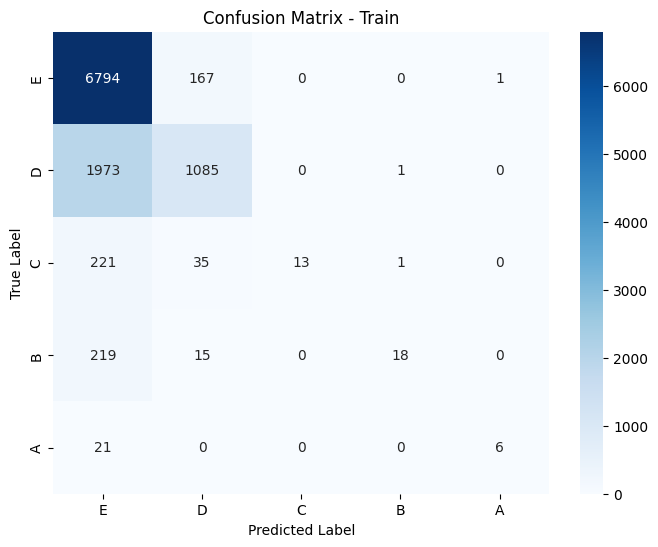

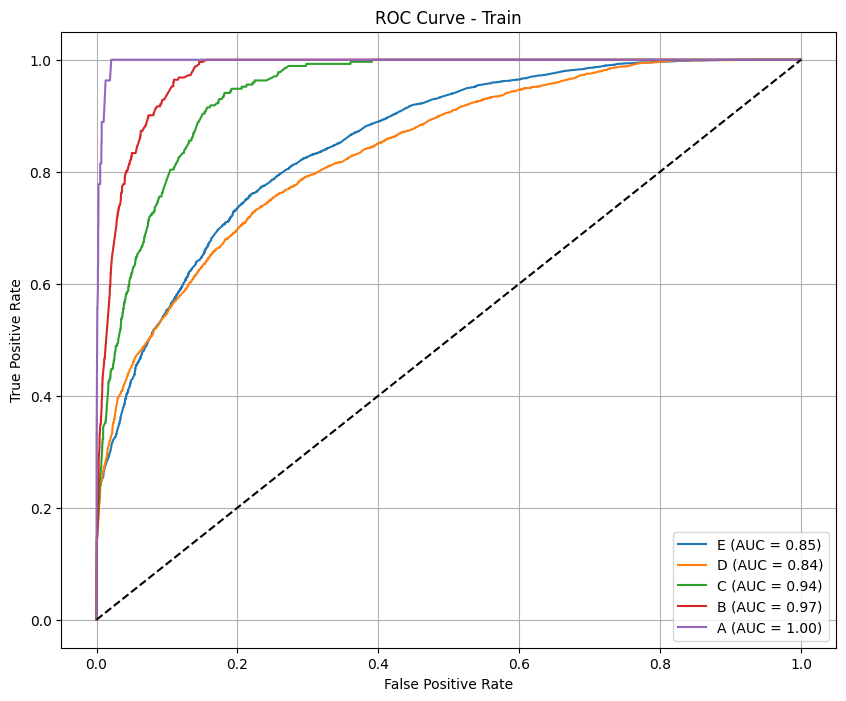


--- Test Metrics ---
F1 Score (per class): [0.91981846 0.375      0.         0.         0.        ]
Precision (per class): [0.8611898 0.54      0.        0.        0.       ]
Recall (per class): [0.98701299 0.28723404 0.         0.         0.        ]
Accuracy: 0.8399
AUC (One-vs-Rest): 0.8284

Classification Report:
              precision    recall  f1-score   support

           E       0.86      0.99      0.92       616
           D       0.54      0.29      0.38        94
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.84       756
   macro avg       0.28      0.25      0.26       756
weighted avg       0.77      0.84      0.80       756



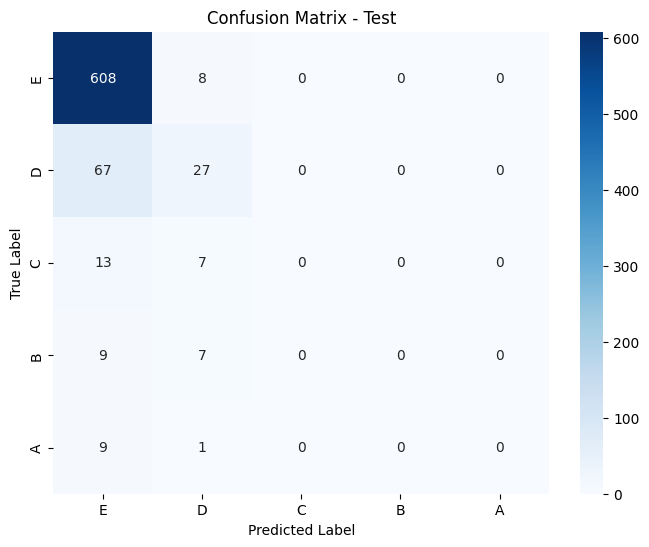

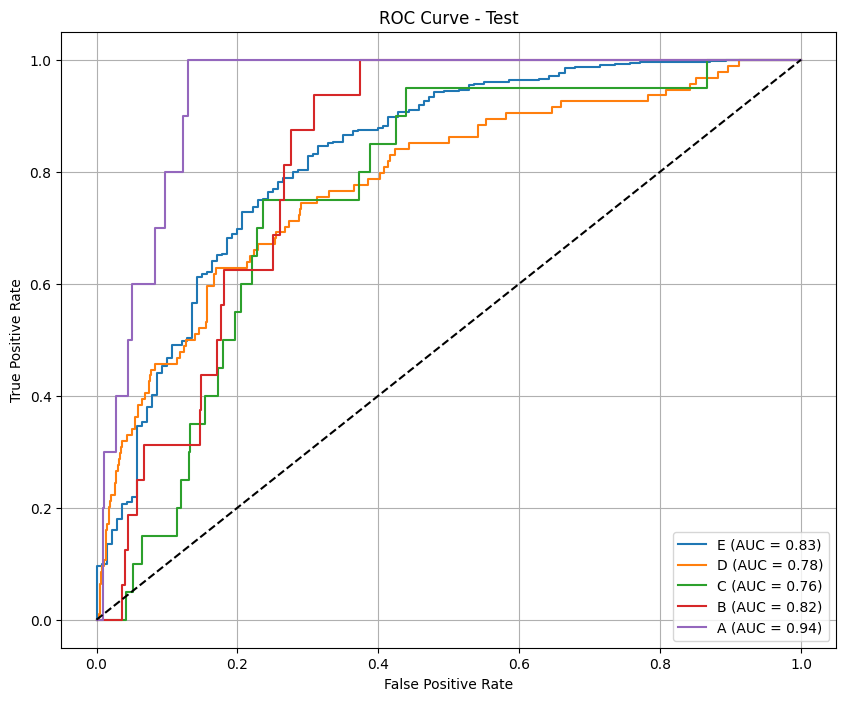

Calibrated predictions saved as test_results_calibrate_robust_f1_macro_phase1.csv

=== Permutation Importance for phase phase1 ===

=== Permutation Importance (Top Features) ===
exercise_count: 0.0390
remaining_time: 0.0323
video_count: 0.0221
school: 0.0175
total_words_phase1: 0.0141
video: 0.0131
assignment: 0.0130
duration_days: 0.0117
chapter_count: 0.0109
user_month: 0.0090
start_month: 0.0044
num_prerequisites: 0.0043
exercise_correct_sum_1: 0.0040
entropy_time_comment_phase1: 0.0033
total_neutral1: 0.0033
user_time_since_last_course: 0.0028
end_month: 0.0026
user_past_course_count: 0.0025
exercise_perc_real_score_sum_1: 0.0020
total_positive1: 0.0020
exam: 0.0018
exercise_perc_goal_score_mean_1: 0.0017
exercise_context_mean_1: 0.0012
field_encoded_1: 0.0011
exercise_perc_real_completed_mean_1: 0.0010
exercise_diff_max_1: 0.0010
exercise_diff_sum_1: 0.0009
user_year: 0.0008
exercise_num_problem_mean_1: 0.0008
total_negative1: 0.0008
field_encoded_2: 0.0007
exercise_perc_real_corr

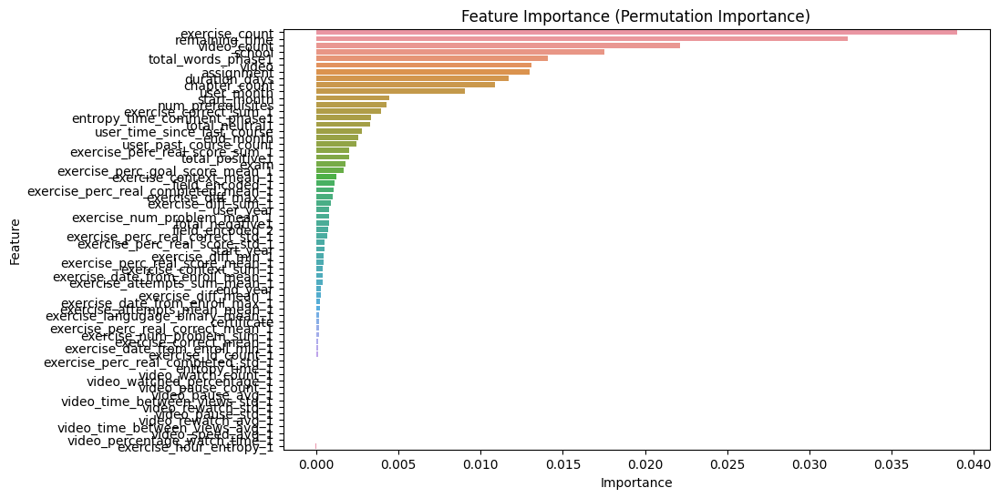


=== Lasso Feature Selection for phase phase1 ===

=== Lasso Feature Importance ===
video: 0.2335
chapter_count: 0.1343
video_count: 0.0871
duration_days: 0.0851
exercise_count: 0.0472
start_month: 0.0450
exercise_correct_sum_1: 0.0178
remaining_time: 0.0159
exercise_num_problem_sum_1: 0.0097
total_neutral1: 0.0050
user_month: 0.0050
exam: 0.0038
field_encoded_2: 0.0016
exercise_context_sum_1: 0.0010
field_encoded_1: 0.0002
user_time_since_last_course: 0.0001
num_prerequisites: 0.0000
total_words_phase1: 0.0000
certificate: 0.0000
school: 0.0000
start_year: 0.0000
user_past_course_count: 0.0000
end_month: 0.0000
assignment: 0.0000
exercise_id_count_1: 0.0000
exercise_correct_mean_1: 0.0000
exercise_num_problem_mean_1: 0.0000
exercise_attempts_sum_mean_1: 0.0000
exercise_attempts_mean_mean_1: 0.0000
end_year: 0.0000
entropy_time_comment_phase1: 0.0000
user_year: 0.0000
exercise_date_from_enroll_max_1: 0.0000
exercise_date_from_enroll_mean_1: 0.0000
exercise_date_from_enroll_min_1: 0.000

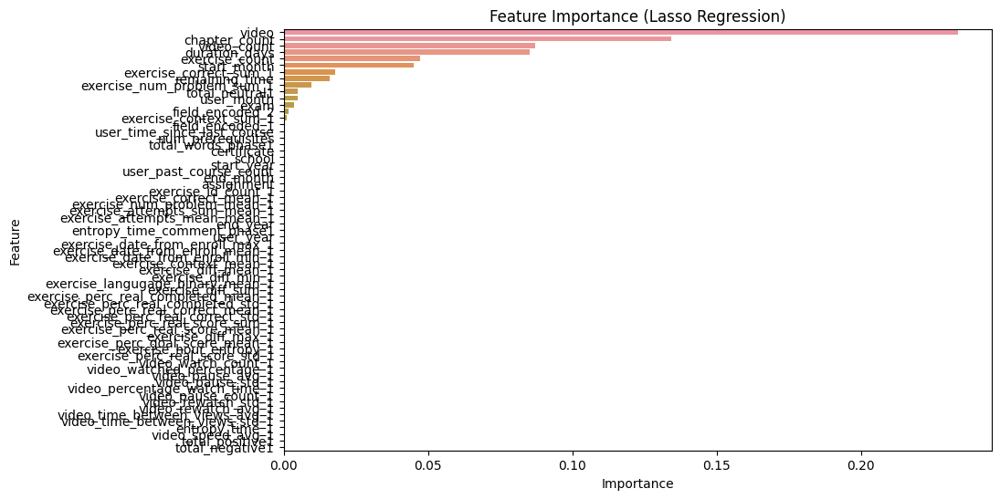


=== Boruta Trick ===

=== Boruta (Trick) Feature Importance ===
remaining_time: 12.8630
Random Feature: 12.2280
school: 9.6359
video: 8.2489
exercise_count: 8.1900
assignment: 7.9337
video_count: 7.6161
chapter_count: 5.6499
duration_days: 5.5466
user_month: 3.8444
total_words_phase1: 3.3807
start_month: 2.4721
num_prerequisites: 1.5710
total_neutral1: 1.1999
end_month: 1.0116
user_time_since_last_course: 0.8122
field_encoded_1: 0.7683
exercise_correct_sum_1: 0.7180
user_past_course_count: 0.6535
certificate: 0.6285
entropy_time_comment_phase1: 0.5584
exam: 0.5320
total_positive1: 0.3730
exercise_perc_real_score_sum_1: 0.3648
field_encoded_2: 0.3454
user_year: 0.3062
exercise_perc_goal_score_mean_1: 0.2678
exercise_context_sum_1: 0.2567
exercise_perc_real_correct_std_1: 0.2252
exercise_correct_mean_1: 0.2165
exercise_perc_real_correct_mean_1: 0.1853
exercise_num_problem_mean_1: 0.1667
exercise_date_from_enroll_max_1: 0.1382
exercise_perc_real_completed_mean_1: 0.1194
exercise_diff_max

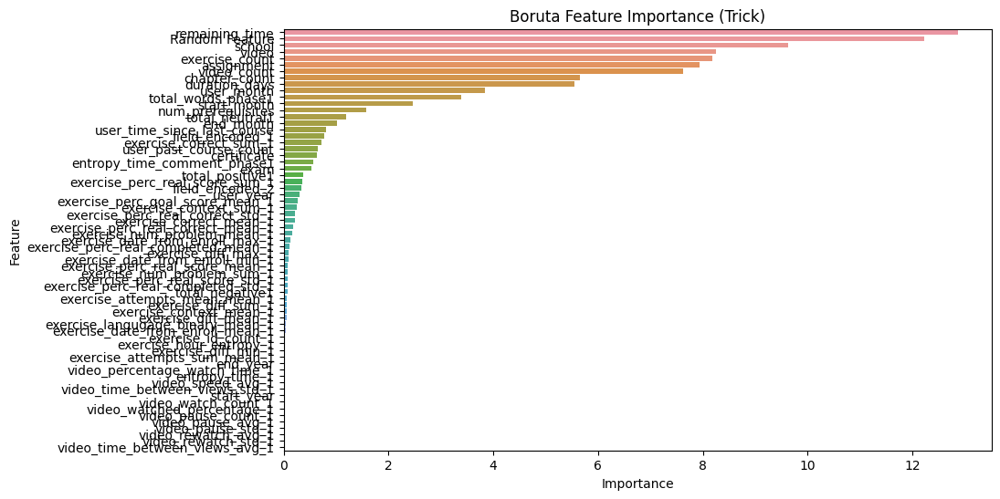


=== Phase phase1 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8548 entries, 0 to 8547
Columns: 113 entries, user_id to label_encoded
dtypes: float64(100), int64(9), object(4)
memory usage: 7.4+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase2: {'rsm': 0.8, 'learning_rate': 0.15, 'l2_leaf_reg': 3, 'iterations': 400, 'depth': 6, 'border_count': 64} ===

=== Evaluation for phase phase2 ===

--- Train Metrics ---
F1 Score (per class): [0.84933483 0.55179487 0.22900763 0.44938272 0.54901961]
Precision (per class): [0.77267425 0.73850377 0.9375     0.52       0.53846154]
Recall (per class): [0.94288256 0.44044208 0.13043478 0.39565217 0.56      ]
Accuracy: 0.7616
AUC (One-vs-Rest): 0.9192

Classification Report:
              precision    recall  f1-score   support

           E       0.77      0.94      0.85      5620
           D       0.74      0.44      0.55      2443
           C       0.94      0.13      0.23

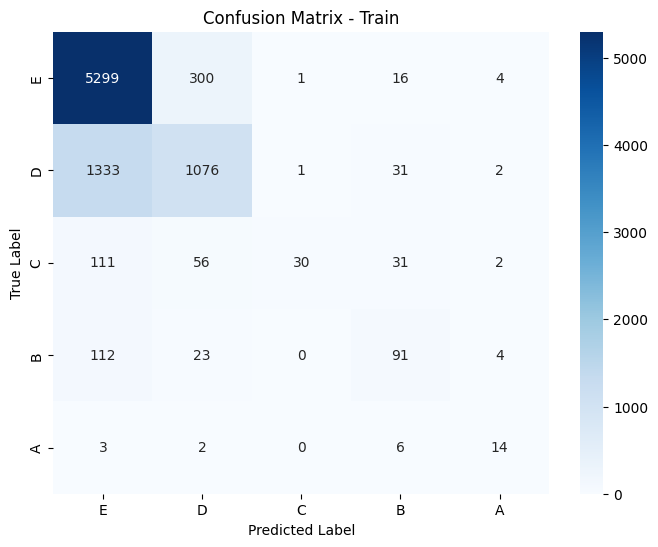

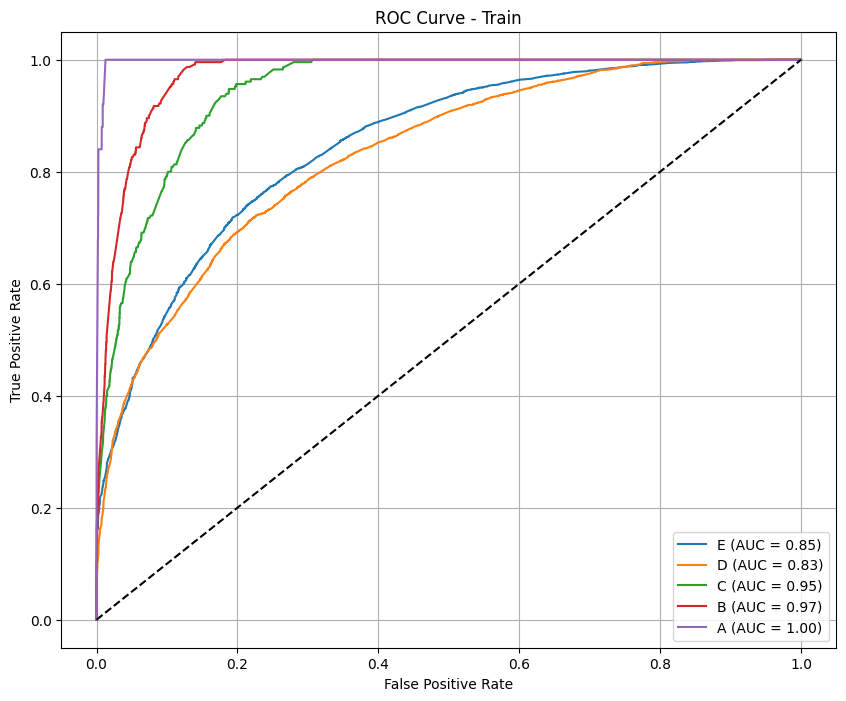


--- Test Metrics ---
F1 Score (per class): [0.910086   0.35928144 0.         0.         0.        ]
Precision (per class): [0.86865672 0.4        0.         0.         0.        ]
Recall (per class): [0.95566502 0.32608696 0.         0.         0.        ]
Accuracy: 0.8204
AUC (One-vs-Rest): 0.7713

Classification Report:
              precision    recall  f1-score   support

           E       0.87      0.96      0.91       609
           D       0.40      0.33      0.36        92
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        15
           A       0.00      0.00      0.00        10

    accuracy                           0.82       746
   macro avg       0.25      0.26      0.25       746
weighted avg       0.76      0.82      0.79       746



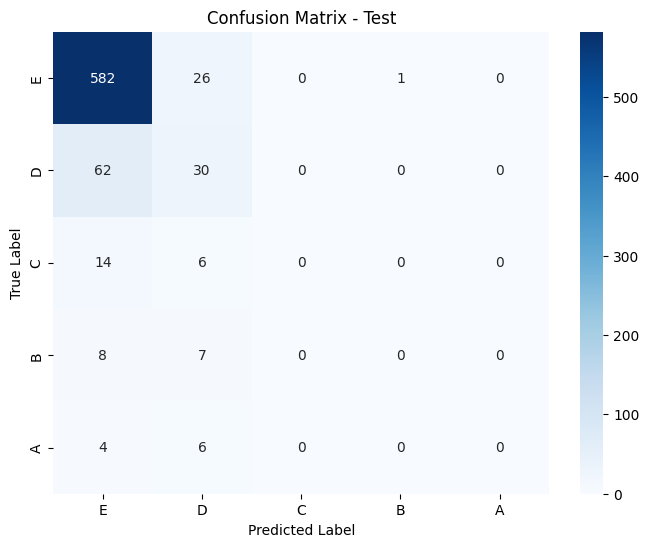

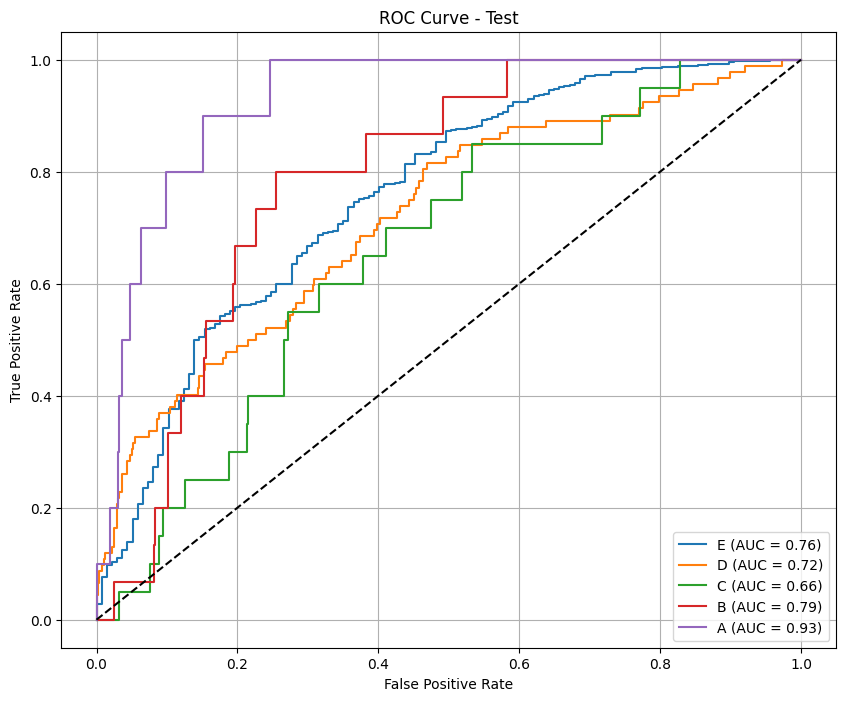

Test predictions saved as test_results_robust_f1_macro_phase2.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase2 ===

--- Train Metrics ---
F1 Score (per class): [0.82718272 0.42263919 0.06722689 0.09836066 0.32258065]
Precision (per class): [0.71498963 0.85024752 1.         0.85714286 0.83333333]
Recall (per class): [0.98113879 0.28121163 0.03478261 0.05217391 0.2       ]
Accuracy: 0.7284
AUC (One-vs-Rest): 0.9168

Classification Report:
              precision    recall  f1-score   support

           E       0.71      0.98      0.83      5620
           D       0.85      0.28      0.42      2443
           C       1.00      0.03      0.07       230
           B       0.86      0.05      0.10       230
           A       0.83      0.20      0.32        25

    accuracy                           0.73      8548
   macro avg       0.85      0.31      0.35      8548
weighted avg       0.77  

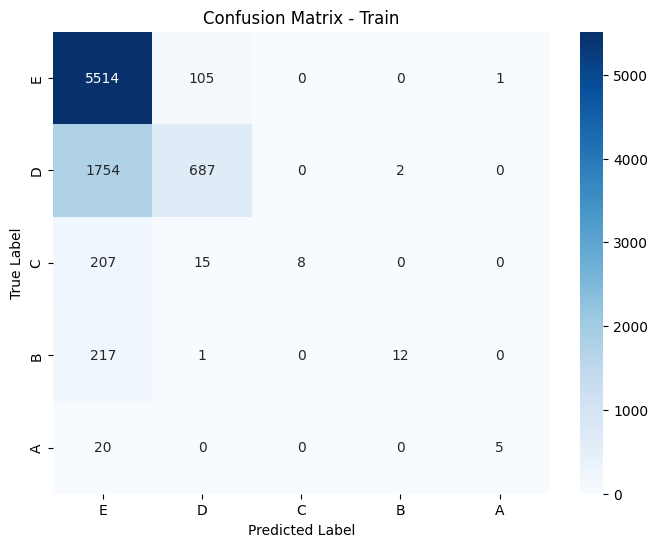

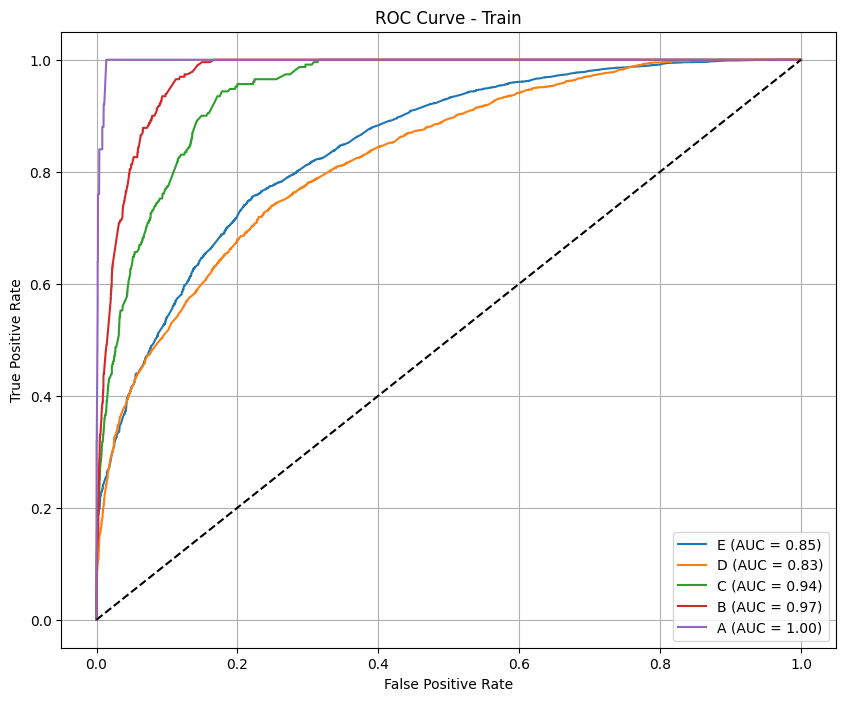


--- Test Metrics ---
F1 Score (per class): [0.90419162 0.16216216 0.         0.         0.        ]
Precision (per class): [0.83081155 0.47368421 0.         0.         0.        ]
Recall (per class): [0.99178982 0.09782609 0.         0.         0.        ]
Accuracy: 0.8217
AUC (One-vs-Rest): 0.7893

Classification Report:
              precision    recall  f1-score   support

           E       0.83      0.99      0.90       609
           D       0.47      0.10      0.16        92
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        15
           A       0.00      0.00      0.00        10

    accuracy                           0.82       746
   macro avg       0.26      0.22      0.21       746
weighted avg       0.74      0.82      0.76       746



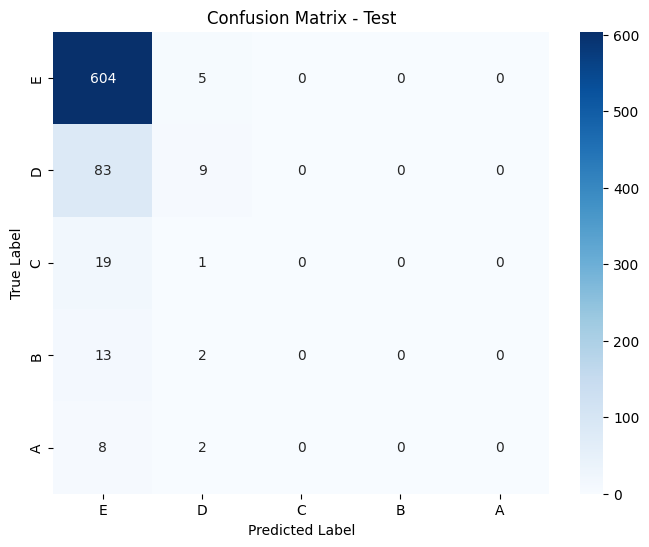

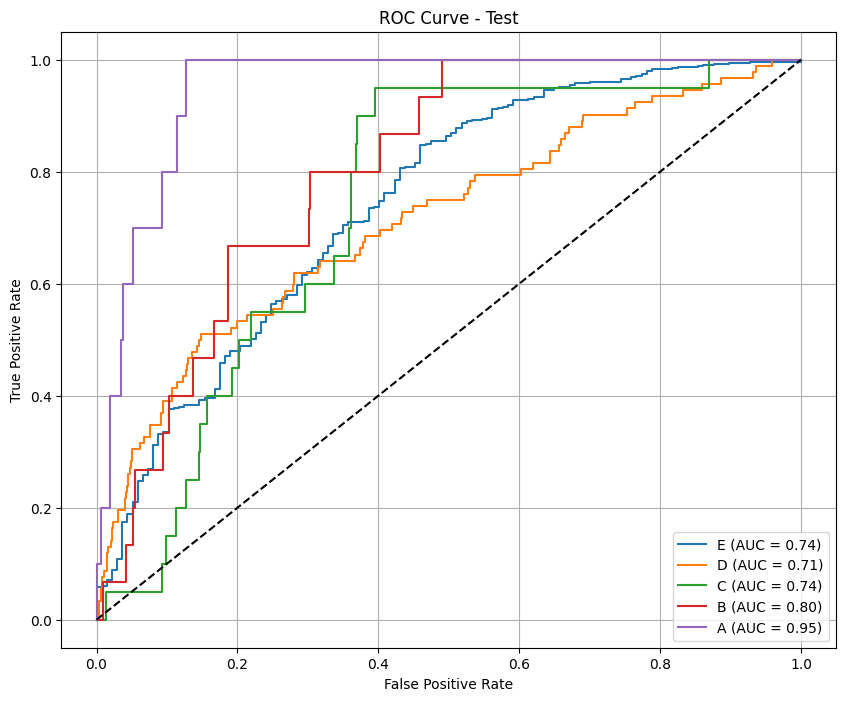

Calibrated predictions saved as test_results_calibrate_robust_f1_macro_phase2.csv

=== Permutation Importance for phase phase2 ===

=== Permutation Importance (Top Features) ===
exercise_count: 0.0405
remaining_time: 0.0374
school: 0.0259
video_count: 0.0226
video: 0.0168
total_words_phase1: 0.0151
assignment: 0.0148
duration_days: 0.0147
chapter_count: 0.0120
user_month: 0.0090
total_words_phase2: 0.0071
num_prerequisites: 0.0056
start_month: 0.0051
total_neutral1: 0.0043
user_past_course_count: 0.0037
total_positive1: 0.0037
entropy_time_comment_phase1: 0.0032
end_month: 0.0029
exercise_correct_sum_2: 0.0027
user_time_since_last_course: 0.0024
field_encoded_1: 0.0021
total_neutral2: 0.0021
field_encoded_2: 0.0020
exam: 0.0018
entropy_time_comment_phase2: 0.0014
total_positive2: 0.0014
start_year: 0.0010
exercise_perc_real_score_sum_1: 0.0008
total_negative1: 0.0007
total_negative2: 0.0006
certificate: 0.0004
exercise_diff_max_2: 0.0003
exercise_correct_sum_1: 0.0003
exercise_perc_rea

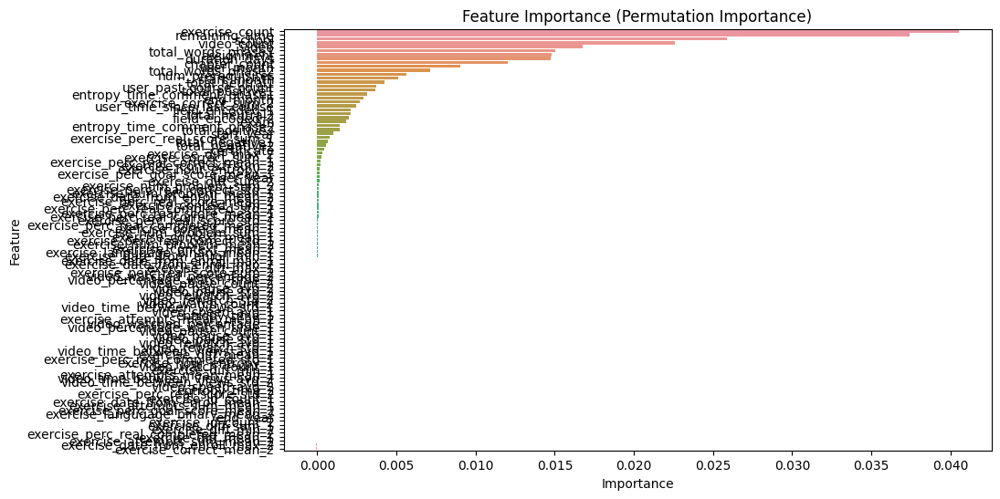


=== Lasso Feature Selection for phase phase2 ===

=== Lasso Feature Importance ===
video: 0.2769
chapter_count: 0.1682
video_count: 0.1124
duration_days: 0.0798
exercise_count: 0.0597
start_month: 0.0520
remaining_time: 0.0408
total_neutral2: 0.0334
exercise_correct_sum_2: 0.0194
user_past_course_count: 0.0184
exercise_correct_sum_1: 0.0110
exercise_date_from_enroll_mean_2: 0.0107
total_neutral1: 0.0077
exam: 0.0057
exercise_num_problem_sum_1: 0.0050
exercise_num_problem_sum_2: 0.0049
exercise_num_problem_mean_2: 0.0048
num_prerequisites: 0.0035
field_encoded_2: 0.0026
exercise_context_sum_2: 0.0019
school: 0.0013
exercise_diff_sum_2: 0.0011
exercise_diff_sum_1: 0.0004
field_encoded_1: 0.0004
user_time_since_last_course: 0.0001
total_words_phase1: 0.0001
total_words_phase2: 0.0000
exercise_attempts_sum_mean_2: 0.0000
exercise_langugage_binary_mean_2: 0.0000
exercise_context_mean_2: 0.0000
video_time_between_views_avg_2: 0.0000
exercise_date_from_enroll_max_2: 0.0000
video_time_between

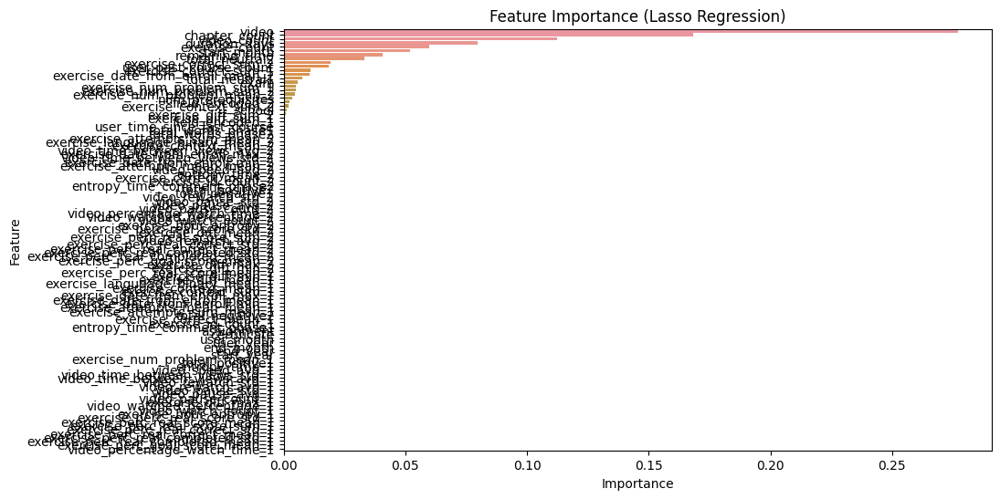


=== Boruta Trick ===

=== Boruta (Trick) Feature Importance ===
Random Feature: 12.6424
remaining_time: 11.8112
video: 11.5619
school: 11.1118
exercise_count: 9.7240
video_count: 7.0666
assignment: 5.5559
chapter_count: 5.0115
duration_days: 4.3702
user_month: 4.1646
num_prerequisites: 2.4422
total_words_phase1: 1.9316
start_month: 1.7847
end_month: 1.5125
total_words_phase2: 1.3433
user_past_course_count: 0.8523
field_encoded_1: 0.8485
total_neutral2: 0.7494
total_neutral1: 0.7056
start_year: 0.7016
exam: 0.5956
certificate: 0.4928
entropy_time_comment_phase1: 0.4200
entropy_time_comment_phase2: 0.3540
user_time_since_last_course: 0.3325
user_year: 0.3316
total_positive1: 0.3204
field_encoded_2: 0.2867
exercise_correct_sum_2: 0.1399
total_positive2: 0.1096
exercise_perc_real_correct_mean_1: 0.0510
exercise_context_mean_2: 0.0487
total_negative1: 0.0356
total_negative2: 0.0343
exercise_num_problem_sum_1: 0.0297
exercise_context_sum_1: 0.0280
exercise_perc_real_score_sum_1: 0.0279
exer

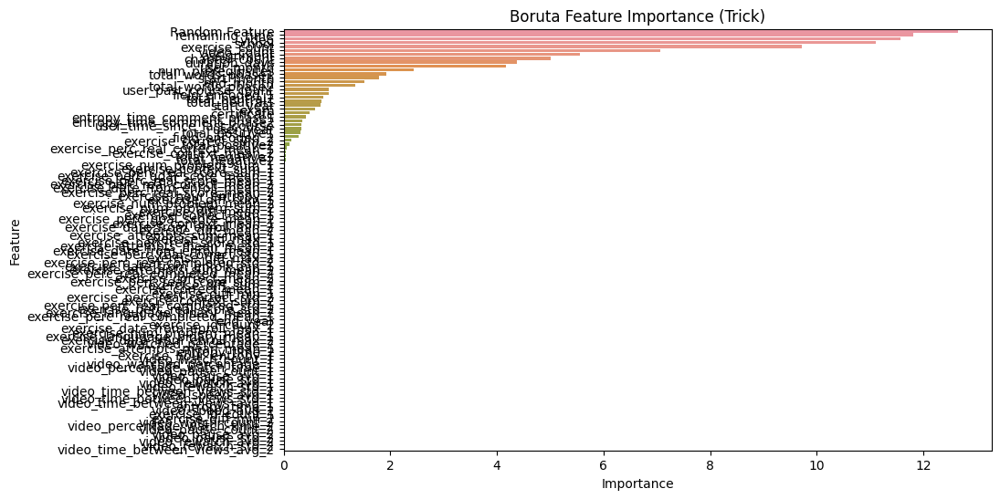


=== Phase phase2 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7803 entries, 0 to 7802
Columns: 156 entries, user_id to label_encoded
dtypes: float64(143), int64(9), object(4)
memory usage: 9.3+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

[CV] END border_count=32, depth=4, iterations=300, l2_leaf_reg=5, learning_rate=0.01, rsm=0.8; total time=   8.5s
[CV] END border_count=32, depth=8, iterations=200, l2_leaf_reg=5, learning_rate=0.15, rsm=0.8; total time=  26.6s
[CV] END border_count=64, depth=8, iterations=200, l2_leaf_reg=7, learning_rate=0.01, rsm=0.9; total time=  32.8s
[CV] END border_count=64, depth=6, iterations=400, l2_leaf_reg=3, learning_rate=0.15, rsm=0.8; total time=  28.3s
[CV] END border_count=64, depth=9, iterations=300, l2_leaf_reg=3, learning_rate=0.1, rsm=0.8; total time= 1.2min
[CV] END border_count=64, depth=4, iterations=200, l2_leaf_reg=7, learning_rate=0.1, rsm=0.9; total time=   7.7s
[CV] END border_count=64, depth=4,

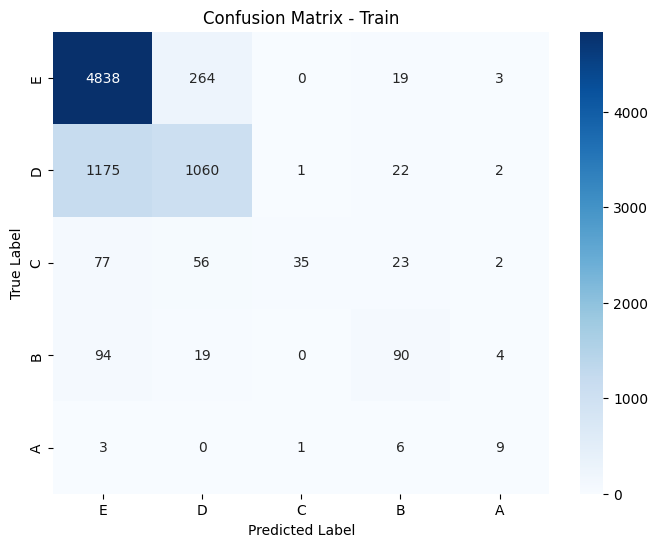

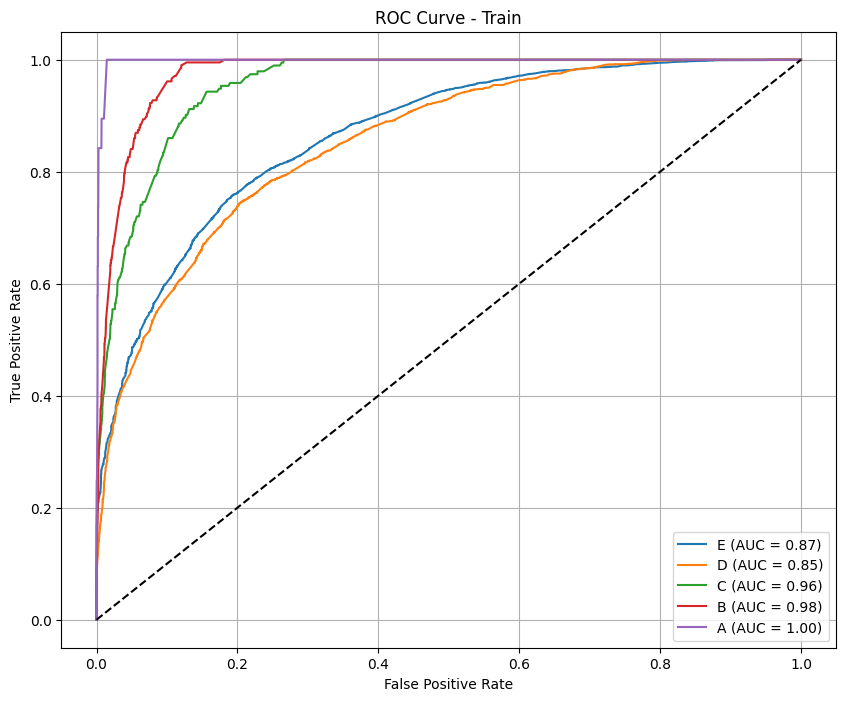


--- Test Metrics ---
F1 Score (per class): [0.89852827 0.0952381  0.         0.         0.        ]
Precision (per class): [0.82503556 0.27777778 0.         0.         0.        ]
Recall (per class): [0.98639456 0.05747126 0.         0.         0.        ]
Accuracy: 0.8114
AUC (One-vs-Rest): 0.7239

Classification Report:
              precision    recall  f1-score   support

           E       0.83      0.99      0.90       588
           D       0.28      0.06      0.10        87
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.81       721
   macro avg       0.22      0.21      0.20       721
weighted avg       0.71      0.81      0.74       721



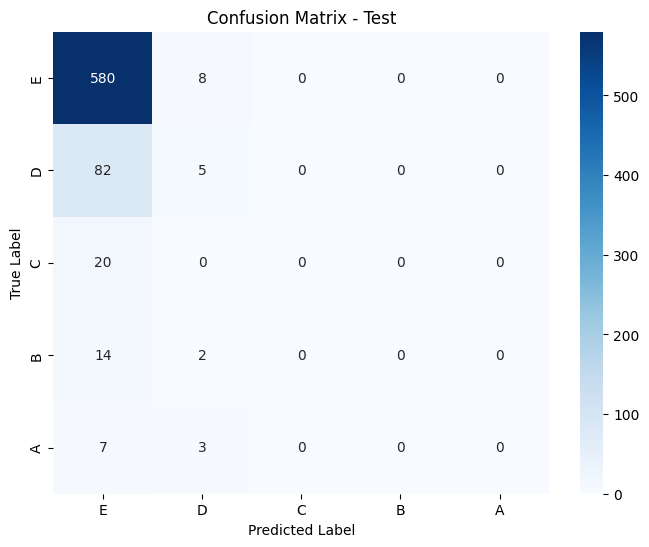

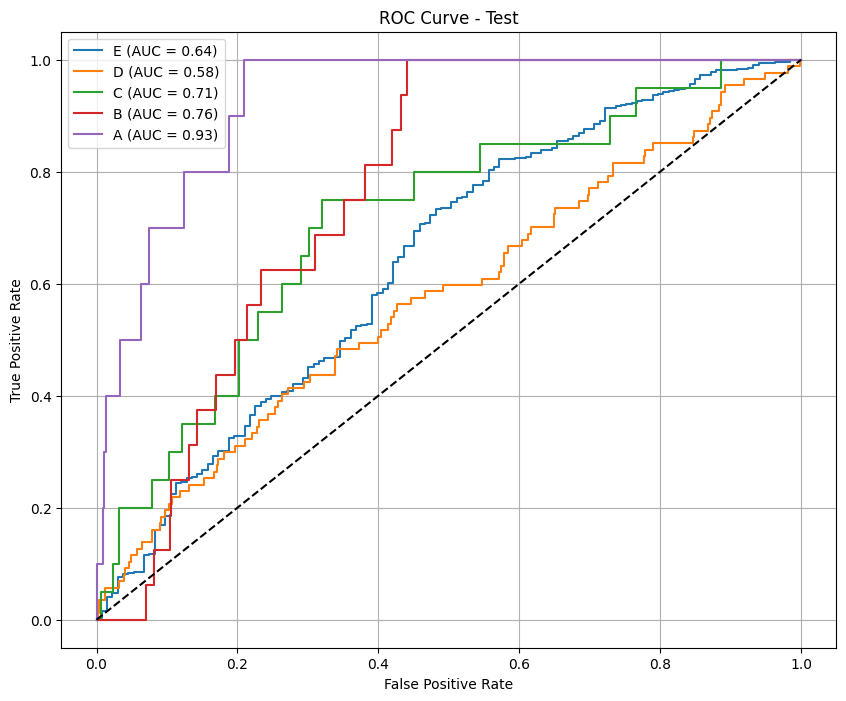

Test predictions saved as test_results_robust_f1_macro_phase3.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase3 ===

--- Train Metrics ---
F1 Score (per class): [0.83577128 0.46367452 0.09852217 0.26771654 0.1       ]
Precision (per class): [0.72785177 0.85782557 1.         0.72340426 1.        ]
Recall (per class): [0.98126464 0.31769912 0.05181347 0.16425121 0.05263158]
Accuracy: 0.7422
AUC (One-vs-Rest): 0.9271

Classification Report:
              precision    recall  f1-score   support

           E       0.73      0.98      0.84      5124
           D       0.86      0.32      0.46      2260
           C       1.00      0.05      0.10       193
           B       0.72      0.16      0.27       207
           A       1.00      0.05      0.10        19

    accuracy                           0.74      7803
   macro avg       0.86      0.31      0.35      7803
weighted avg       0.77  

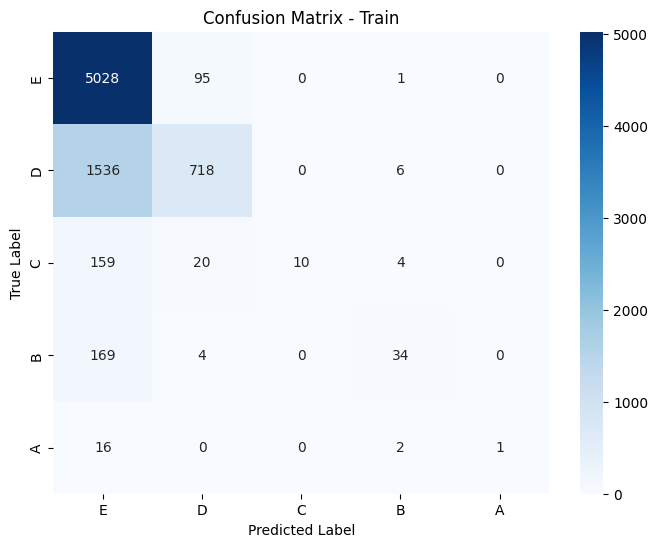

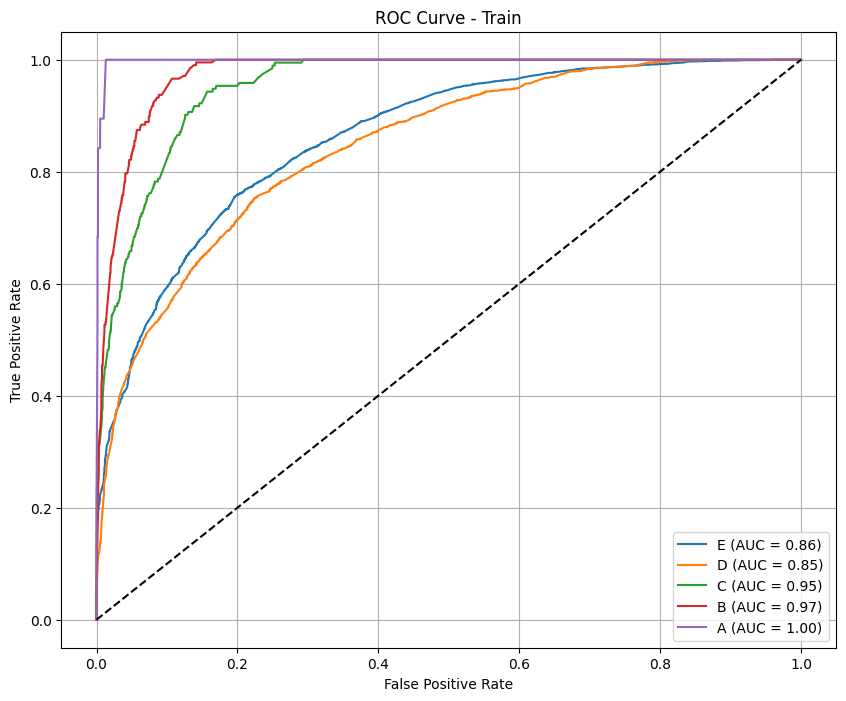


--- Test Metrics ---
F1 Score (per class): [0.89824024 0.02247191 0.         0.         0.        ]
Precision (per class): [0.81641168 0.5        0.         0.         0.        ]
Recall (per class): [0.99829932 0.01149425 0.         0.         0.        ]
Accuracy: 0.8155
AUC (One-vs-Rest): 0.7235

Classification Report:
              precision    recall  f1-score   support

           E       0.82      1.00      0.90       588
           D       0.50      0.01      0.02        87
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.82       721
   macro avg       0.26      0.20      0.18       721
weighted avg       0.73      0.82      0.74       721



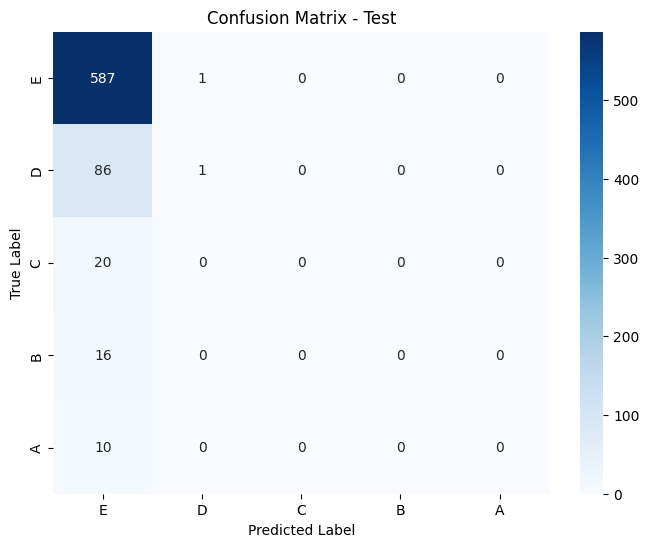

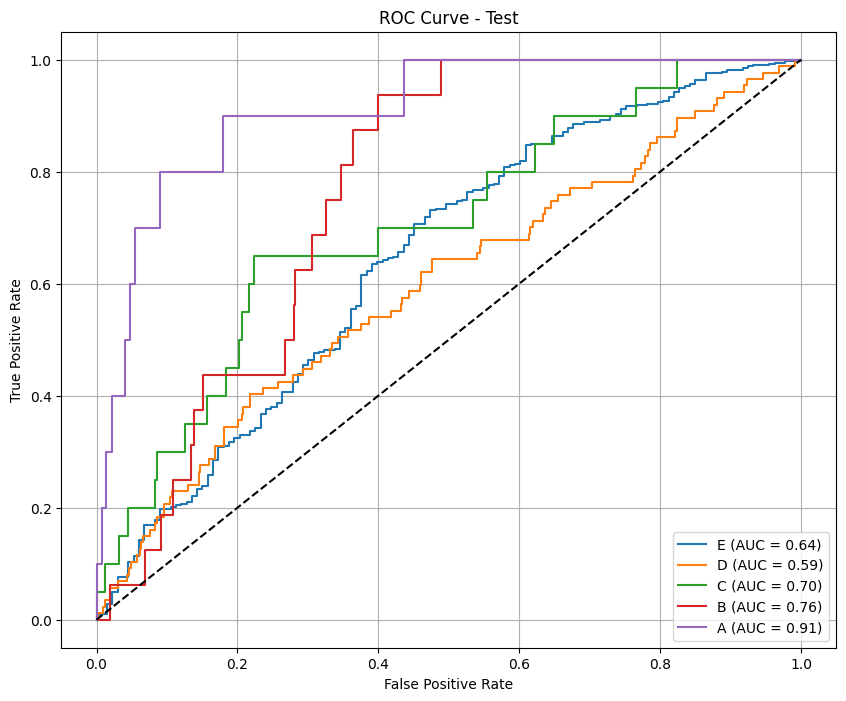

Calibrated predictions saved as test_results_calibrate_robust_f1_macro_phase3.csv

=== Phase phase3 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5363 entries, 0 to 5362
Columns: 199 entries, user_id to label_encoded
dtypes: float64(186), int64(9), object(4)
memory usage: 8.1+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END border_count=64, depth=6, iterations=200, l2_leaf_reg=7, learning_rate=0.01, rsm=0.7; total time=  14.1s
[CV] END border_count=32, depth=4, iterations=300, l2_leaf_reg=5, learning_rate=0.01, rsm=0.8; total time=   9.4s
[CV] END border_count=32, depth=4, iterations=300, l2_leaf_reg=5, learning_rate=0.01, rsm=0.8; total time=   9.0s
[CV] END border_count=32, depth=8, iterations=200, l2_leaf_reg=5, learning_rate=0.15, rsm=0.8; total time=  26.1s
[CV] END border_count=64, depth=8, iterations=200, l2_leaf_reg=7, learning_rate=0.01, rsm=0.9; total time=  32.1s
[CV] END border_count=64, depth=6, iterations=400, l2_leaf_reg=3,

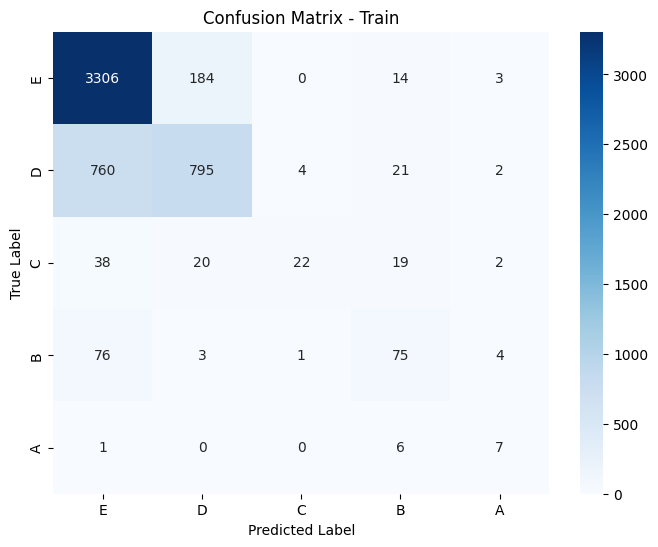

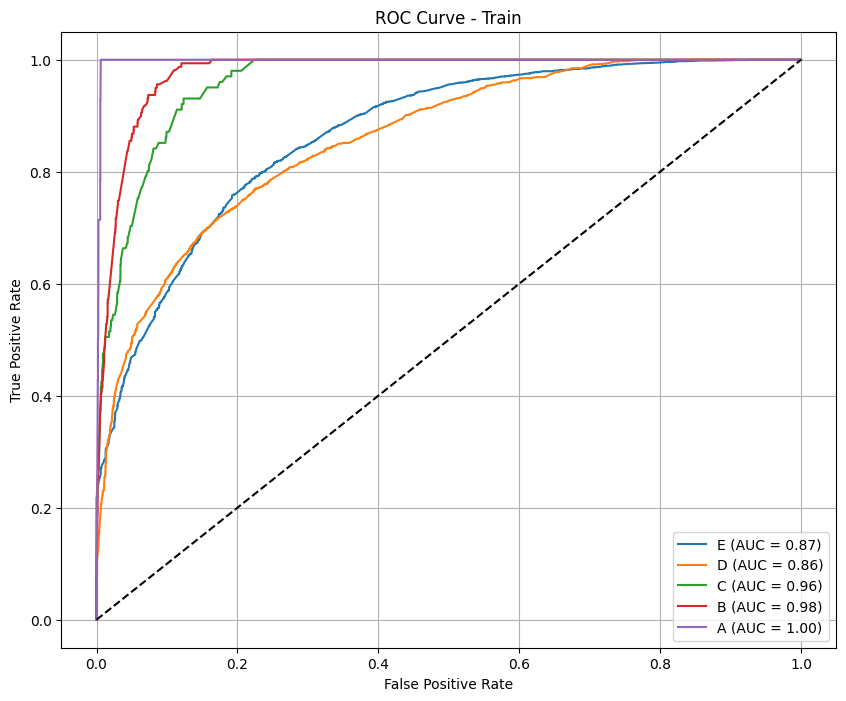


--- Test Metrics ---
F1 Score (per class): [0.87980376 0.01923077 0.         0.         0.        ]
Precision (per class): [0.80538922 0.05263158 0.         0.         0.        ]
Recall (per class): [0.96936937 0.01176471 0.         0.         0.        ]
Accuracy: 0.7846
AUC (One-vs-Rest): 0.6511

Classification Report:
              precision    recall  f1-score   support

           E       0.81      0.97      0.88       555
           D       0.05      0.01      0.02        85
           C       0.00      0.00      0.00        18
           B       0.00      0.00      0.00        18
           A       0.00      0.00      0.00        11

    accuracy                           0.78       687
   macro avg       0.17      0.20      0.18       687
weighted avg       0.66      0.78      0.71       687



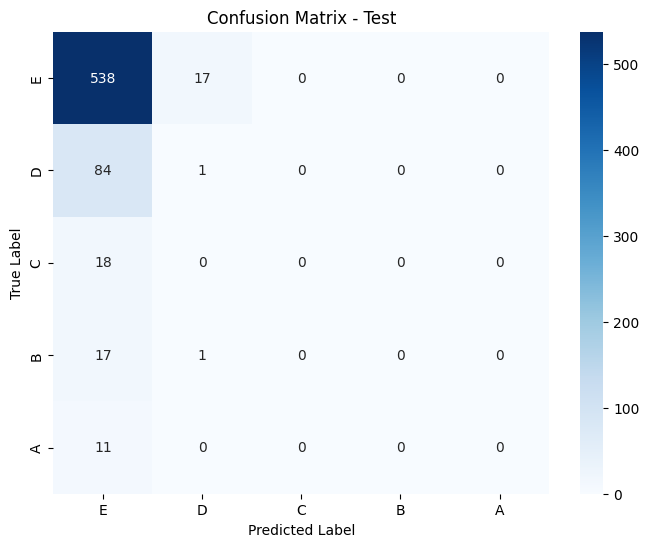

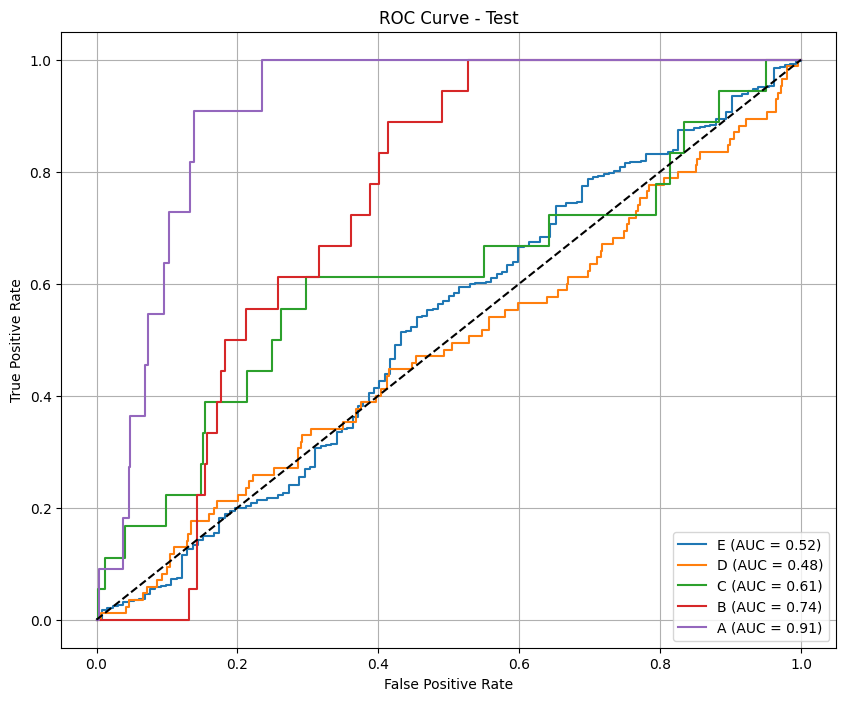

Test predictions saved as test_results_robust_f1_macro_phase4.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase4 ===

--- Train Metrics ---
F1 Score (per class): [0.84478936 0.5070922  0.32520325 0.39069767 0.        ]
Precision (per class): [0.74365647 0.84866469 0.90909091 0.75       0.        ]
Recall (per class): [0.97775877 0.36156764 0.1980198  0.26415094 0.        ]
Accuracy: 0.7576
AUC (One-vs-Rest): 0.9304

Classification Report:
              precision    recall  f1-score   support

           E       0.74      0.98      0.84      3507
           D       0.85      0.36      0.51      1582
           C       0.91      0.20      0.33       101
           B       0.75      0.26      0.39       159
           A       0.00      0.00      0.00        14

    accuracy                           0.76      5363
   macro avg       0.65      0.36      0.41      5363
weighted avg       0.78  

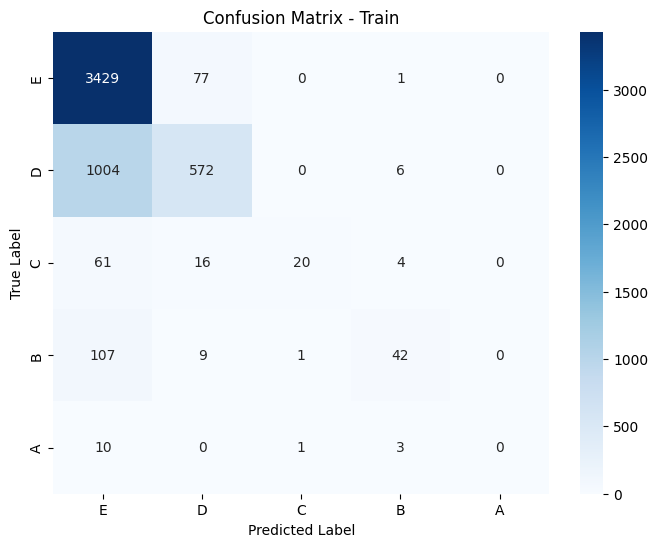

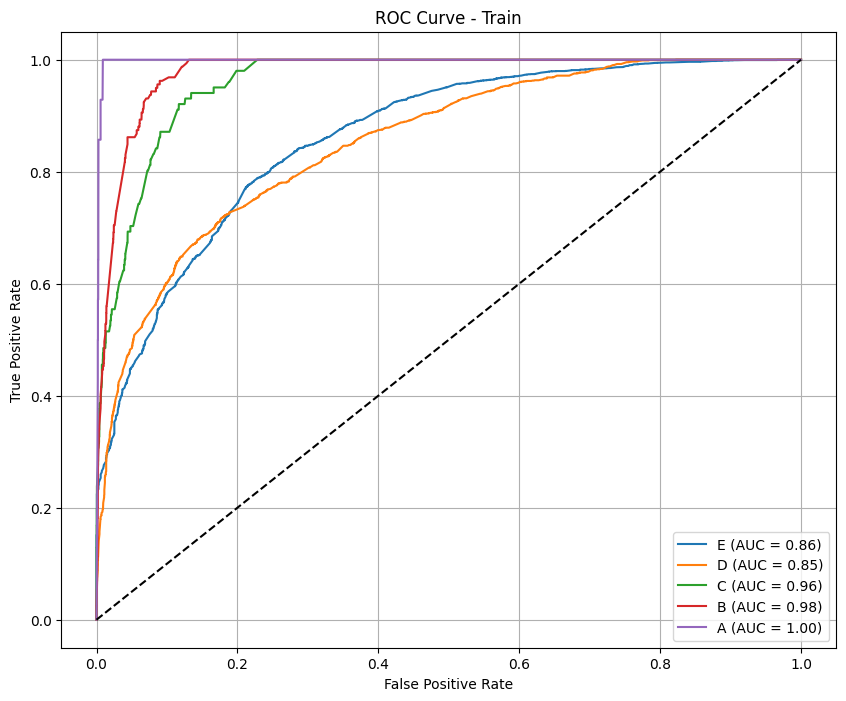


--- Test Metrics ---
F1 Score (per class): [0.89282836 0.         0.         0.         0.        ]
Precision (per class): [0.80758017 0.         0.         0.         0.        ]
Recall (per class): [0.9981982 0.        0.        0.        0.       ]
Accuracy: 0.8064
AUC (One-vs-Rest): 0.6382

Classification Report:
              precision    recall  f1-score   support

           E       0.81      1.00      0.89       555
           D       0.00      0.00      0.00        85
           C       0.00      0.00      0.00        18
           B       0.00      0.00      0.00        18
           A       0.00      0.00      0.00        11

    accuracy                           0.81       687
   macro avg       0.16      0.20      0.18       687
weighted avg       0.65      0.81      0.72       687



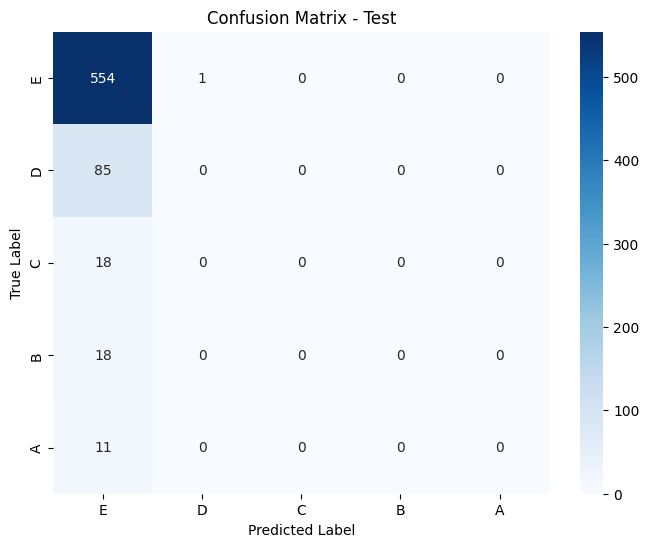

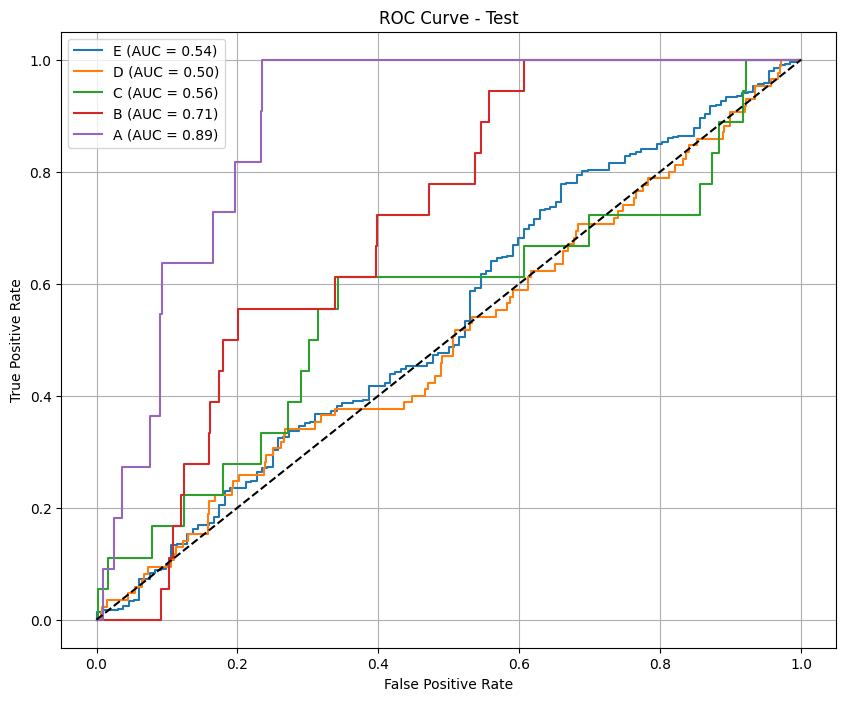

Calibrated predictions saved as test_results_calibrate_robust_f1_macro_phase4.csv

=== Phase phase4 completed ===


In [14]:
# Lặp qua các phase
for phase in ["phase1", "phase2", "phase3", "phase4"]:
    process_phase(phase, metric='f1_macro')

# 4. Scale dữ liệu theo Log

In [15]:
def process_phase(phase, scale='log', metric='accuracy'):
    # Load dữ liệu
    X_train, y_train, X_test, y_test = load_data(phase)

    # Scale dữ liệu
    X_train_scaled, X_test_scaled = scale_data(X_train, X_test, scaler_type=scale)
    X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

    # StratifiedKFold
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Định nghĩa mô hình
    model = CatBoostClassifier(random_state=42, verbose=0)

    # Tham số tìm kiếm
    param_grid = {
        'iterations': [100, 200, 300, 400],
        'depth': [4, 6, 8, 9],
        'learning_rate': [0.01, 0.05, 0.1, 0.15],
        'l2_leaf_reg': [1, 3, 5, 7],
        'border_count': [32, 64],
        'rsm': [0.7, 0.8, 0.9],
    }

    # RandomizedSearchCV
    randomized_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=10,
        cv=skf,
        scoring=metric,
        random_state=42,
        n_jobs=-1,
        verbose=2
    )

    # Train mô hình
    randomized_search.fit(X_train_scaled, y_train)

    best_model = randomized_search.best_estimator_
    best_params = randomized_search.best_params_
    print(f"\n=== Best Parameters for phase {phase}: {best_params} ===")

    # Đánh giá mô hình trước calibrate
    print(f"\n=== Evaluation for phase {phase} ===")
    eval_results = evaluate_model(best_model, X_train_scaled, y_train, X_test_scaled, y_test)

    # Lưu kết quả dự đoán
    y_test_pred = best_model.predict(X_test_scaled)
    results_df = X_test.copy()
    results_df['True_Label'] = y_test
    results_df['Predicted_Label'] = y_test_pred
    filename = f"test_results_{scale}_{metric}_{phase}.csv"
    results_df.to_csv(filename, index=False)
    print(f"Test predictions saved as {filename}")

    # Calibrate mô hình
    calibrated_model = calibrate_model(best_model, X_train_scaled, y_train)

    # Đánh giá mô hình sau calibrate
    print(f"\n=== Evaluation after calibration for phase {phase} ===")
    eval_results_cal = evaluate_model(calibrated_model, X_train_scaled, y_train, X_test_scaled, y_test)

    # Lưu kết quả dự đoán sau calibrate
    y_calibrated_pred = calibrated_model.predict(X_test_scaled)
    results_df['Calibrated_Predicted_Label'] = y_calibrated_pred
    filename_cal = f"test_results_calibrate_{scale}_{metric}_{phase}.csv"
    results_df.to_csv(filename_cal, index=False)
    print(f"Calibrated predictions saved as {filename_cal}")

    # Nếu phase 1 hoặc 2 → chọn feature
    if int(phase[-1]) <= 2:
        print(f"\n=== Permutation Importance for phase {phase} ===")
        perm_importance = plot_permutation_importance(best_model, X_train_scaled, y_train)
        perm_importance.to_csv(f"perm_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

        print(f"\n=== Lasso Feature Selection for phase {phase} ===")
        selected_features, lasso_importance = lasso_feature_selection(X_train_scaled, y_train)
        lasso_importance.to_csv(f"lasso_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

        print("\n=== Boruta Trick ===")
        boruta_model = CatBoostClassifier(**best_params, random_state=42, verbose=0)
        important_features = boruta_trick(boruta_model, X_train_scaled, y_train)
        important_features.to_csv(f"boruta_importance_{phase}.csv", index=False)  # <- Bật lên nếu muốn lưu

    print(f"\n=== Phase {phase} completed ===")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10570 entries, 0 to 10569
Data columns (total 70 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   user_id                              10570 non-null  object 
 1   school                               6715 non-null   object 
 2   course_id                            10570 non-null  object 
 3   field_encoded_1                      10570 non-null  int64  
 4   field_encoded_2                      10570 non-null  int64  
 5   start_year                           10570 non-null  float64
 6   start_month                          10570 non-null  float64
 7   end_year                             10570 non-null  float64
 8   end_month                            10570 non-null  float64
 9   user_year                            10570 non-null  float64
 10  user_month                           10570 non-null  float64
 11  video_count                 

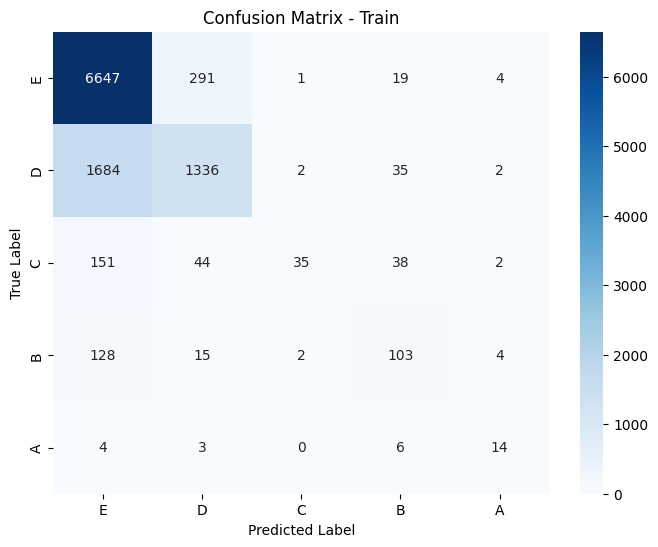

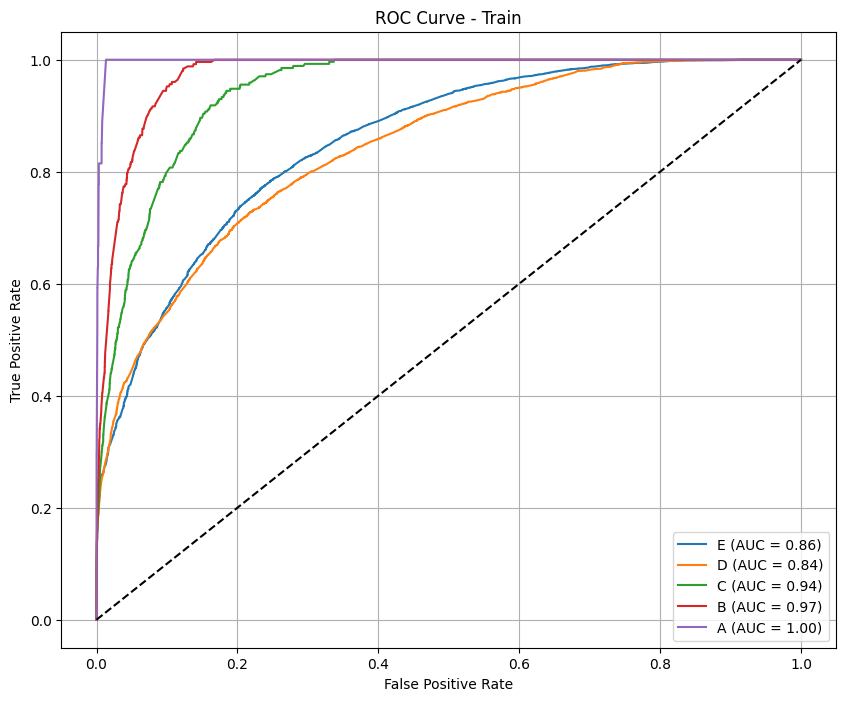


--- Test Metrics ---
F1 Score (per class): [0.90639626 0.39130435 0.         0.         0.        ]
Precision (per class): [0.87237237 0.4        0.         0.         0.        ]
Recall (per class): [0.94318182 0.38297872 0.         0.         0.        ]
Accuracy: 0.8161
AUC (One-vs-Rest): 0.7951

Classification Report:
              precision    recall  f1-score   support

           E       0.87      0.94      0.91       616
           D       0.40      0.38      0.39        94
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.82       756
   macro avg       0.25      0.27      0.26       756
weighted avg       0.76      0.82      0.79       756



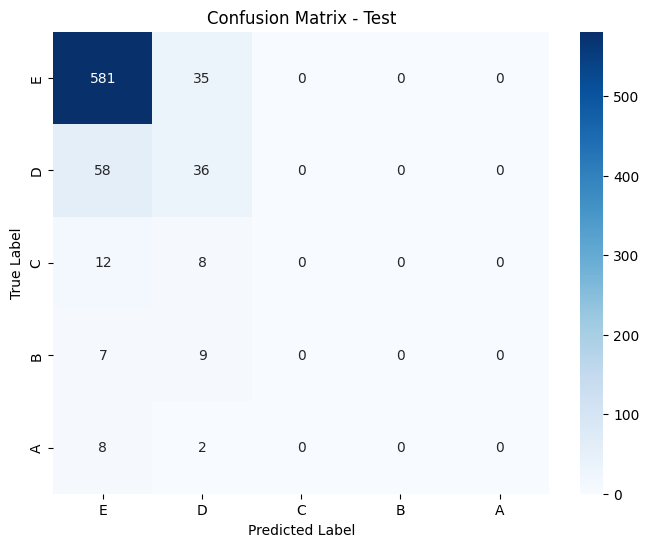

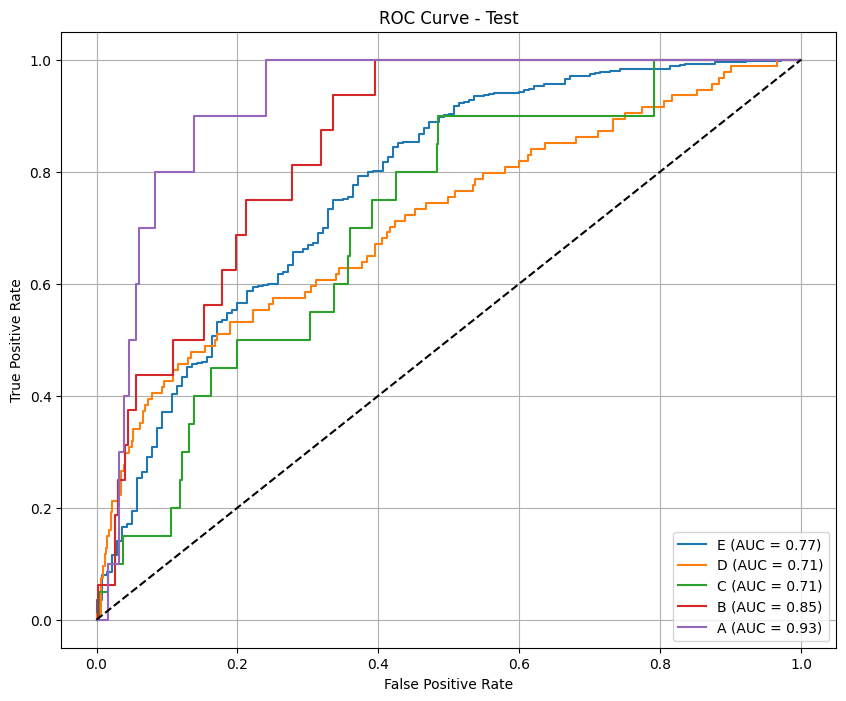

Test predictions saved as test_results_log_f1_macro_phase1.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase1 ===

--- Train Metrics ---
F1 Score (per class): [0.83928351 0.4975923  0.09187279 0.13235294 0.35294118]
Precision (per class): [0.73623754 0.83333333 1.         0.9        0.85714286]
Recall (per class): [0.975869   0.35469108 0.04814815 0.07142857 0.22222222]
Accuracy: 0.7489
AUC (One-vs-Rest): 0.9209

Classification Report:
              precision    recall  f1-score   support

           E       0.74      0.98      0.84      6962
           D       0.83      0.35      0.50      3059
           C       1.00      0.05      0.09       270
           B       0.90      0.07      0.13       252
           A       0.86      0.22      0.35        27

    accuracy                           0.75     10570
   macro avg       0.87      0.33      0.38     10570
weighted avg       0.78     

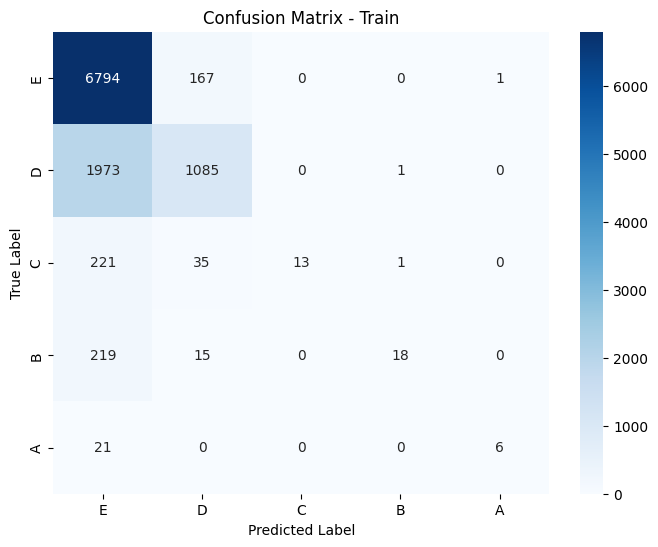

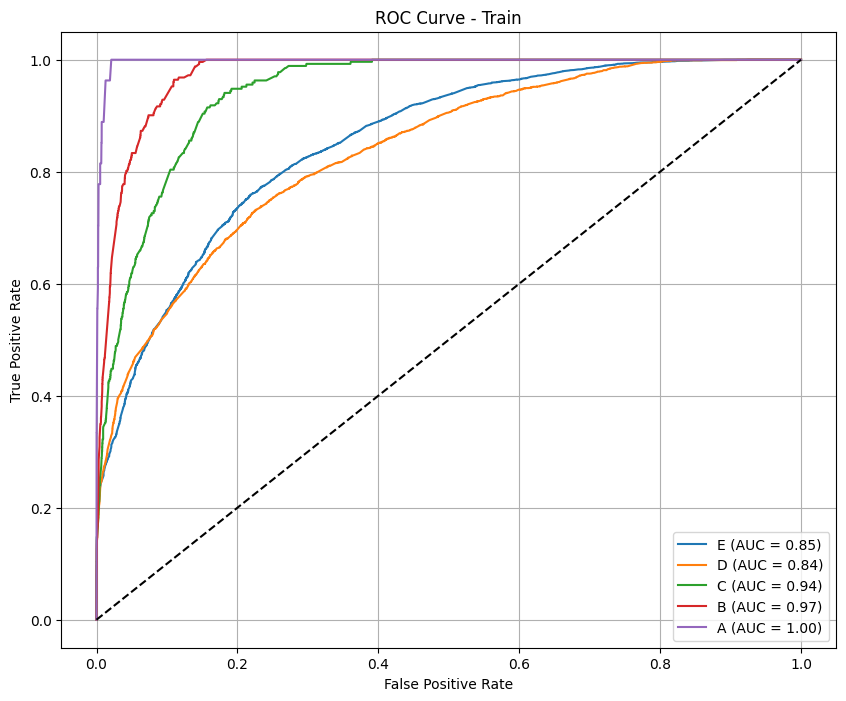


--- Test Metrics ---
F1 Score (per class): [0.92156863 0.4        0.         0.         0.        ]
Precision (per class): [0.86056338 0.60869565 0.         0.         0.        ]
Recall (per class): [0.99188312 0.29787234 0.         0.         0.        ]
Accuracy: 0.8452
AUC (One-vs-Rest): 0.8264

Classification Report:
              precision    recall  f1-score   support

           E       0.86      0.99      0.92       616
           D       0.61      0.30      0.40        94
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.85       756
   macro avg       0.29      0.26      0.26       756
weighted avg       0.78      0.85      0.80       756



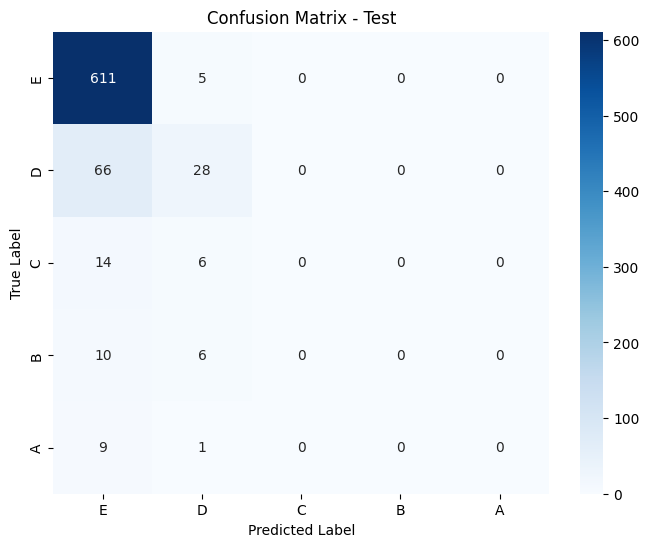

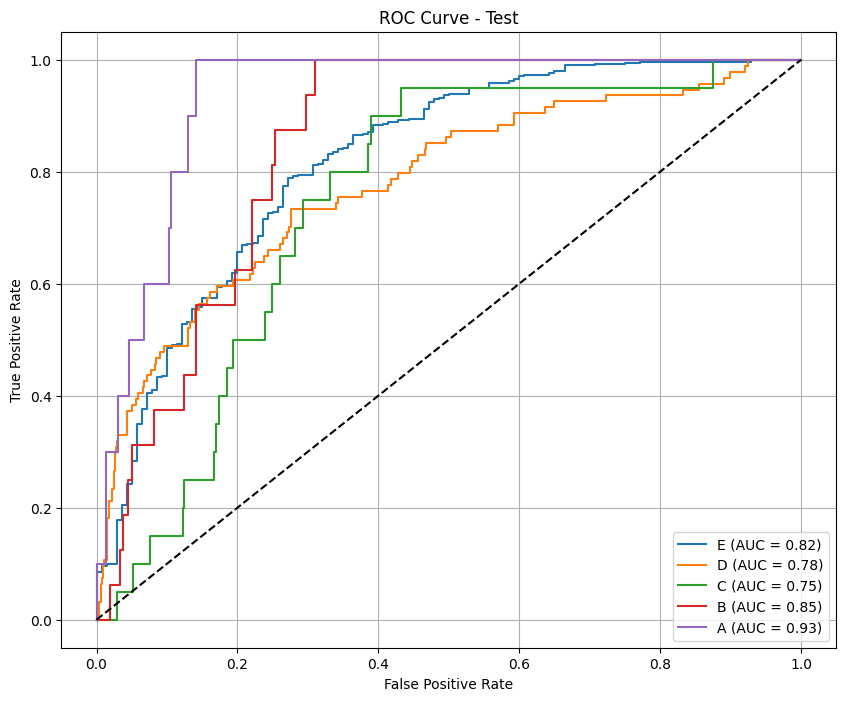

Calibrated predictions saved as test_results_calibrate_log_f1_macro_phase1.csv

=== Permutation Importance for phase phase1 ===

=== Permutation Importance (Top Features) ===
exercise_count: 0.0390
remaining_time: 0.0323
video_count: 0.0221
school: 0.0175
total_words_phase1: 0.0141
video: 0.0131
assignment: 0.0130
duration_days: 0.0117
chapter_count: 0.0109
user_month: 0.0090
start_month: 0.0044
num_prerequisites: 0.0043
exercise_correct_sum_1: 0.0040
entropy_time_comment_phase1: 0.0033
total_neutral1: 0.0033
user_time_since_last_course: 0.0028
end_month: 0.0026
user_past_course_count: 0.0025
exercise_perc_real_score_sum_1: 0.0020
total_positive1: 0.0020
exam: 0.0018
exercise_perc_goal_score_mean_1: 0.0017
exercise_context_mean_1: 0.0012
field_encoded_1: 0.0011
exercise_perc_real_completed_mean_1: 0.0010
exercise_diff_max_1: 0.0010
exercise_diff_sum_1: 0.0009
user_year: 0.0008
exercise_num_problem_mean_1: 0.0008
total_negative1: 0.0008
field_encoded_2: 0.0007
exercise_perc_real_correct

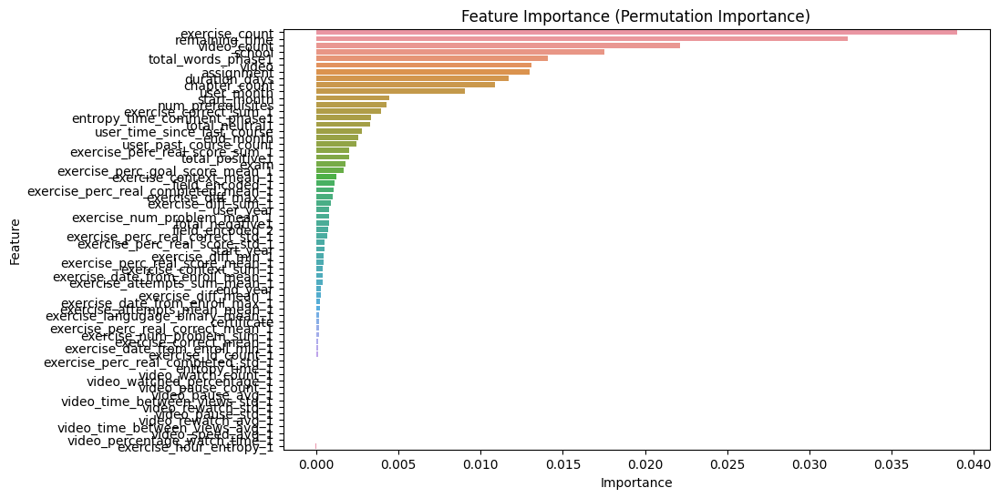


=== Lasso Feature Selection for phase phase1 ===

=== Lasso Feature Importance ===
chapter_count: 0.3817
exercise_perc_real_score_sum_1: 0.3792
assignment: 0.2673
video: 0.2356
exercise_num_problem_sum_1: 0.1928
duration_days: 0.1850
user_year: 0.1238
exercise_count: 0.1236
exercise_correct_mean_1: 0.1230
video_count: 0.0949
user_past_course_count: 0.0647
end_month: 0.0467
exercise_correct_sum_1: 0.0321
start_month: 0.0231
num_prerequisites: 0.0231
total_neutral1: 0.0226
exercise_date_from_enroll_mean_1: 0.0223
remaining_time: 0.0216
user_time_since_last_course: 0.0136
exercise_id_count_1: 0.0129
total_positive1: 0.0060
total_words_phase1: 0.0046
school: 0.0023
field_encoded_1: 0.0003
certificate: 0.0000
exam: 0.0000
entropy_time_comment_phase1: 0.0000
exercise_num_problem_mean_1: 0.0000
field_encoded_2: 0.0000
user_month: 0.0000
start_year: 0.0000
end_year: 0.0000
exercise_date_from_enroll_max_1: 0.0000
exercise_date_from_enroll_min_1: 0.0000
exercise_attempts_mean_mean_1: 0.0000
exe

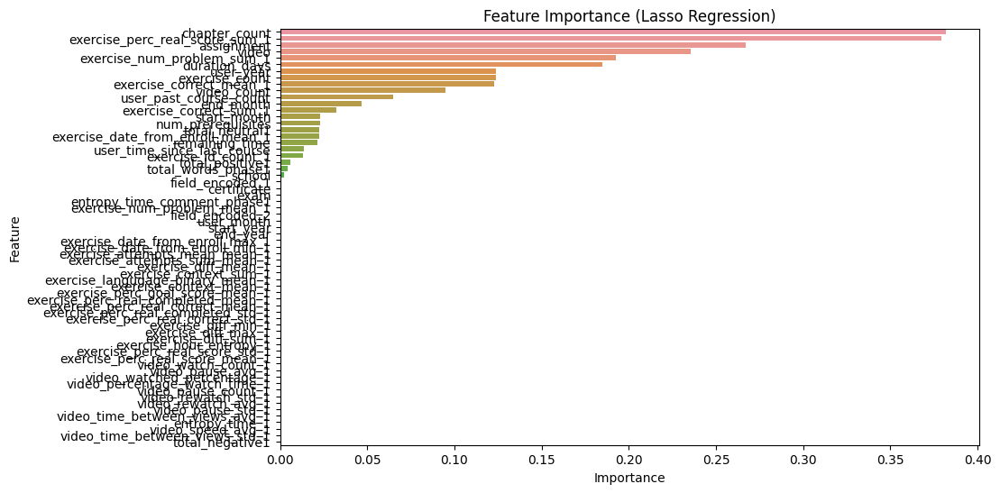


=== Boruta Trick ===

=== Boruta (Trick) Feature Importance ===
Random Feature: 13.8939
remaining_time: 12.6964
school: 9.6678
video: 9.2012
exercise_count: 7.5590
video_count: 7.5412
assignment: 6.7689
chapter_count: 5.4963
duration_days: 4.9422
user_month: 3.5921
total_words_phase1: 3.4615
start_month: 2.8839
num_prerequisites: 1.6464
total_neutral1: 1.0347
field_encoded_1: 0.8649
user_time_since_last_course: 0.8430
end_month: 0.7302
certificate: 0.6781
exercise_correct_sum_1: 0.6773
user_past_course_count: 0.5572
exam: 0.5037
entropy_time_comment_phase1: 0.4949
field_encoded_2: 0.4327
total_positive1: 0.4024
exercise_perc_real_score_sum_1: 0.3241
exercise_perc_goal_score_mean_1: 0.3239
user_year: 0.3175
exercise_context_sum_1: 0.2783
exercise_perc_real_correct_std_1: 0.2488
exercise_correct_mean_1: 0.2361
exercise_perc_real_correct_mean_1: 0.2055
exercise_num_problem_mean_1: 0.1557
exercise_date_from_enroll_max_1: 0.1380
exercise_diff_max_1: 0.1261
exercise_attempts_mean_mean_1: 0.

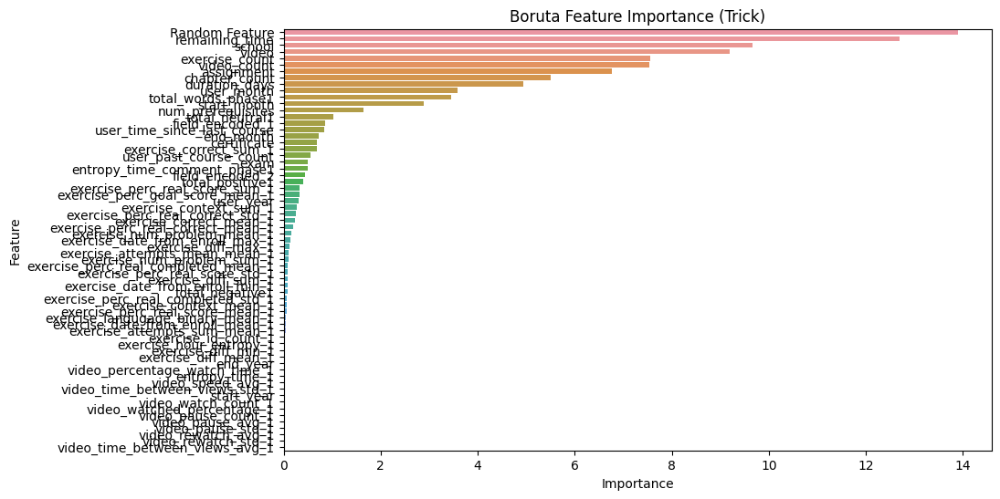


=== Phase phase1 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8548 entries, 0 to 8547
Columns: 113 entries, user_id to label_encoded
dtypes: float64(100), int64(9), object(4)
memory usage: 7.4+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase2: {'rsm': 0.8, 'learning_rate': 0.15, 'l2_leaf_reg': 3, 'iterations': 400, 'depth': 6, 'border_count': 64} ===

=== Evaluation for phase phase2 ===

--- Train Metrics ---
F1 Score (per class): [0.84933483 0.55179487 0.22900763 0.44938272 0.54901961]
Precision (per class): [0.77267425 0.73850377 0.9375     0.52       0.53846154]
Recall (per class): [0.94288256 0.44044208 0.13043478 0.39565217 0.56      ]
Accuracy: 0.7616
AUC (One-vs-Rest): 0.9192

Classification Report:
              precision    recall  f1-score   support

           E       0.77      0.94      0.85      5620
           D       0.74      0.44      0.55      2443
           C       0.94      0.13      0.23

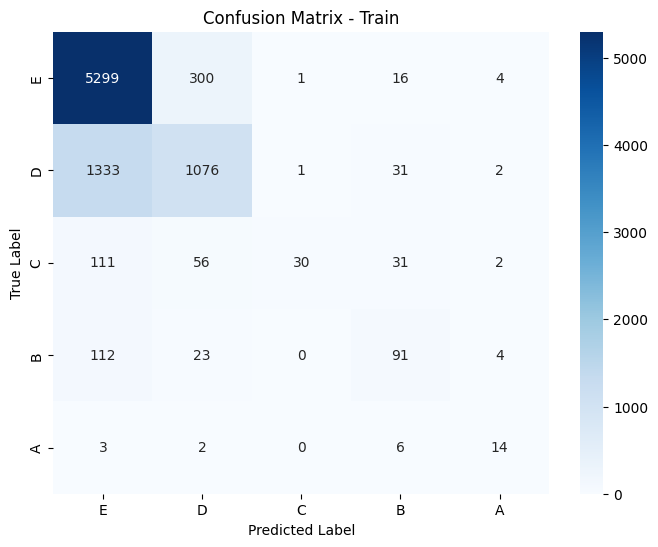

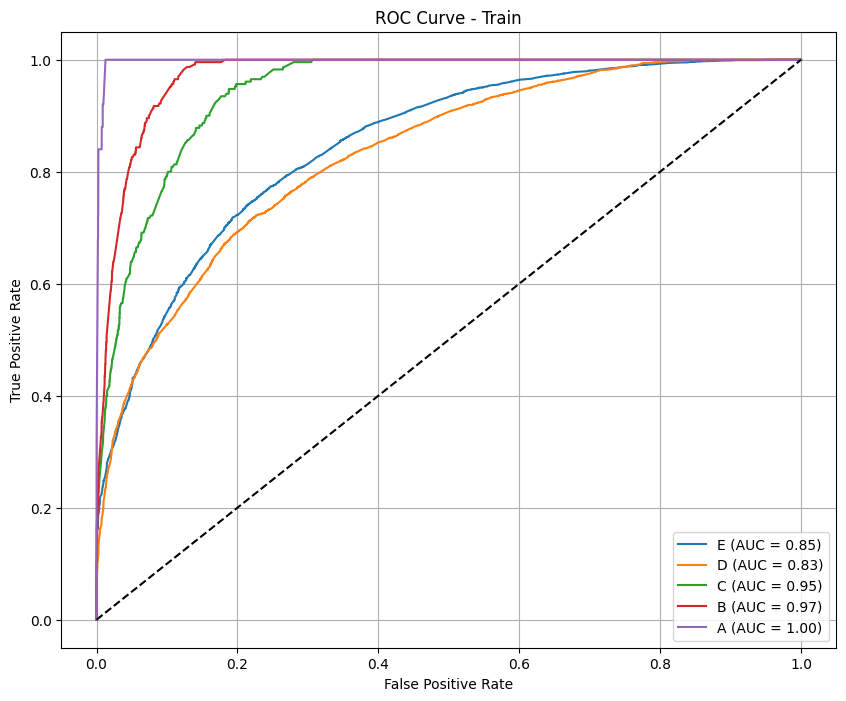


--- Test Metrics ---
F1 Score (per class): [0.90125392 0.31764706 0.         0.         0.        ]
Precision (per class): [0.86206897 0.34615385 0.         0.         0.        ]
Recall (per class): [0.94417077 0.29347826 0.         0.         0.        ]
Accuracy: 0.8070
AUC (One-vs-Rest): 0.7639

Classification Report:
              precision    recall  f1-score   support

           E       0.86      0.94      0.90       609
           D       0.35      0.29      0.32        92
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        15
           A       0.00      0.00      0.00        10

    accuracy                           0.81       746
   macro avg       0.24      0.25      0.24       746
weighted avg       0.75      0.81      0.77       746



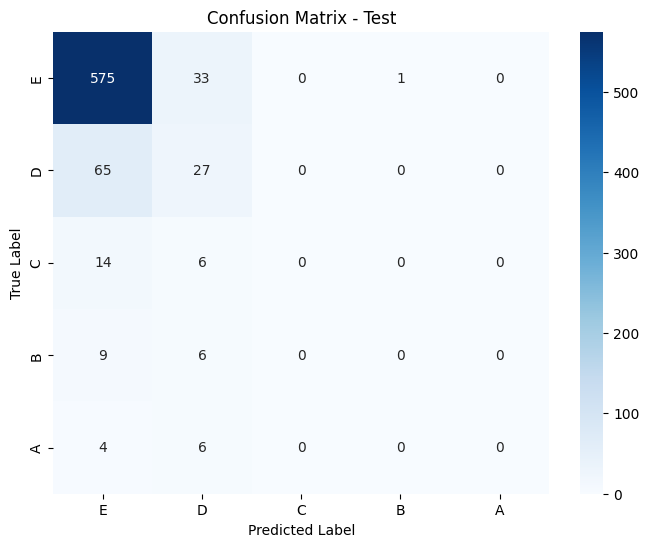

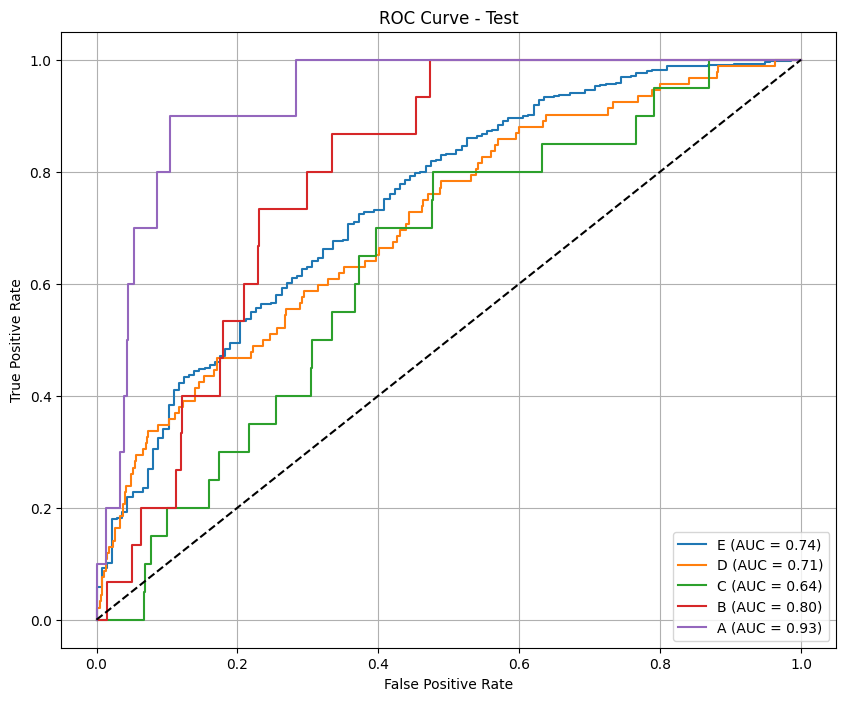

Test predictions saved as test_results_log_f1_macro_phase2.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase2 ===

--- Train Metrics ---
F1 Score (per class): [0.82718272 0.42263919 0.06722689 0.09836066 0.32258065]
Precision (per class): [0.71498963 0.85024752 1.         0.85714286 0.83333333]
Recall (per class): [0.98113879 0.28121163 0.03478261 0.05217391 0.2       ]
Accuracy: 0.7284
AUC (One-vs-Rest): 0.9168

Classification Report:
              precision    recall  f1-score   support

           E       0.71      0.98      0.83      5620
           D       0.85      0.28      0.42      2443
           C       1.00      0.03      0.07       230
           B       0.86      0.05      0.10       230
           A       0.83      0.20      0.32        25

    accuracy                           0.73      8548
   macro avg       0.85      0.31      0.35      8548
weighted avg       0.77     

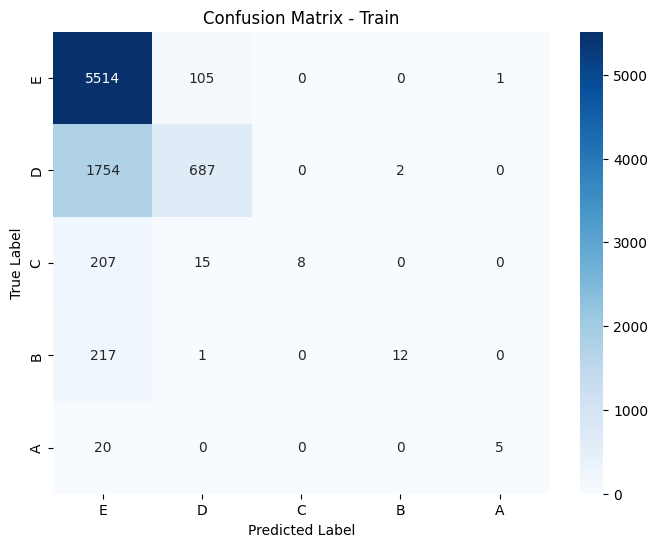

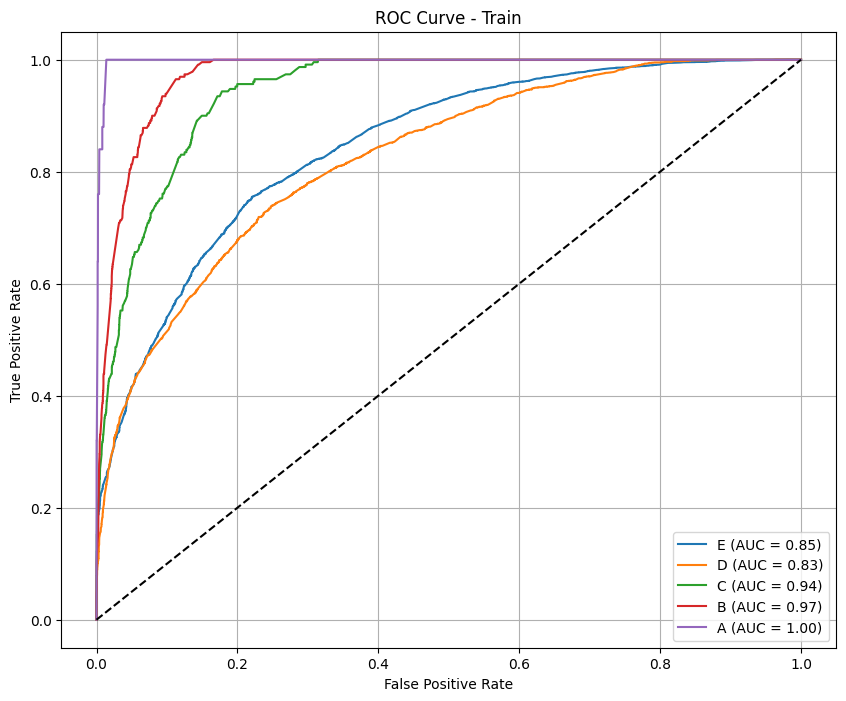


--- Test Metrics ---
F1 Score (per class): [0.90231171 0.13207547 0.         0.         0.        ]
Precision (per class): [0.82650273 0.5        0.         0.         0.        ]
Recall (per class): [0.99343186 0.07608696 0.         0.         0.        ]
Accuracy: 0.8204
AUC (One-vs-Rest): 0.7849

Classification Report:
              precision    recall  f1-score   support

           E       0.83      0.99      0.90       609
           D       0.50      0.08      0.13        92
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        15
           A       0.00      0.00      0.00        10

    accuracy                           0.82       746
   macro avg       0.27      0.21      0.21       746
weighted avg       0.74      0.82      0.75       746



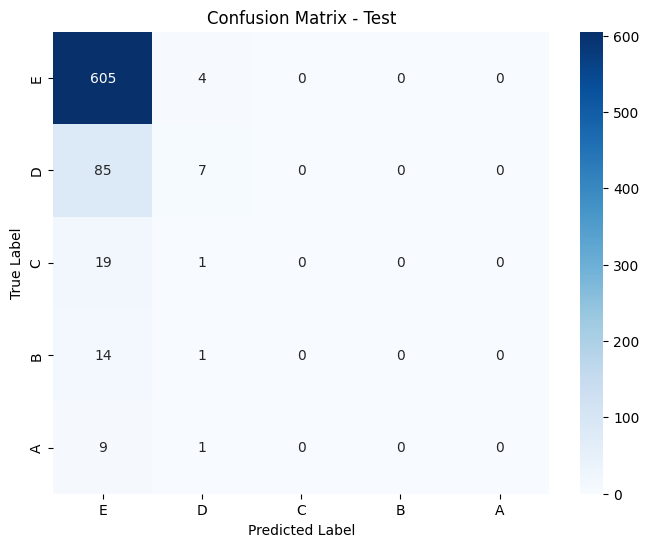

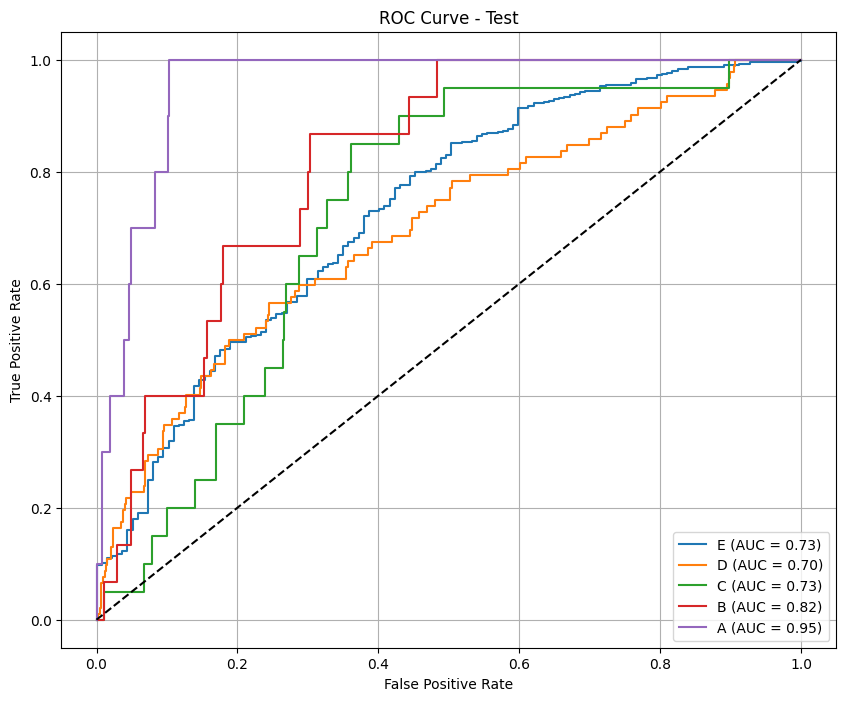

Calibrated predictions saved as test_results_calibrate_log_f1_macro_phase2.csv

=== Permutation Importance for phase phase2 ===

=== Permutation Importance (Top Features) ===
exercise_count: 0.0405
remaining_time: 0.0374
school: 0.0259
video_count: 0.0226
video: 0.0168
total_words_phase1: 0.0151
assignment: 0.0148
duration_days: 0.0147
chapter_count: 0.0120
user_month: 0.0090
total_words_phase2: 0.0071
num_prerequisites: 0.0056
start_month: 0.0051
total_neutral1: 0.0043
user_past_course_count: 0.0037
total_positive1: 0.0037
entropy_time_comment_phase1: 0.0032
end_month: 0.0029
exercise_correct_sum_2: 0.0027
user_time_since_last_course: 0.0024
field_encoded_1: 0.0021
total_neutral2: 0.0021
field_encoded_2: 0.0020
exam: 0.0018
entropy_time_comment_phase2: 0.0014
total_positive2: 0.0014
start_year: 0.0010
exercise_perc_real_score_sum_1: 0.0008
total_negative1: 0.0007
total_negative2: 0.0006
certificate: 0.0004
exercise_diff_max_2: 0.0003
exercise_correct_sum_1: 0.0003
exercise_perc_real_c

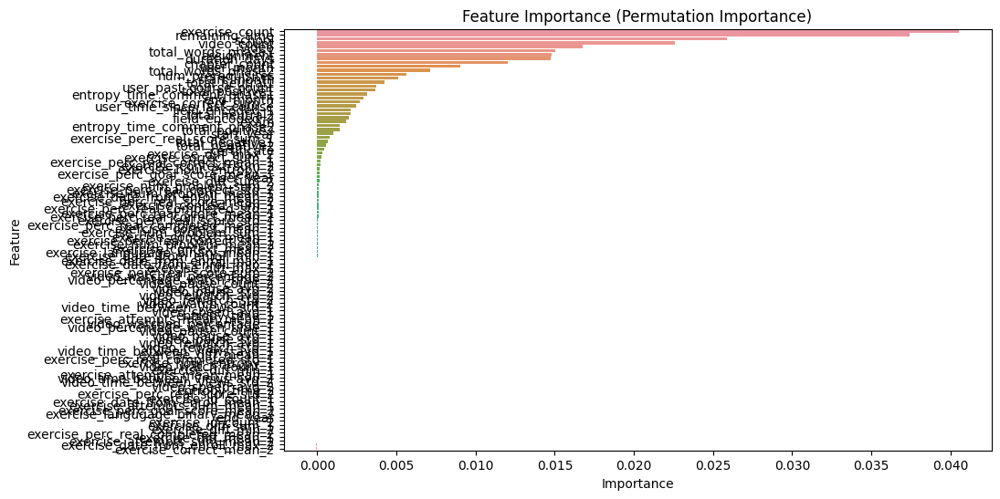


=== Lasso Feature Selection for phase phase2 ===

=== Lasso Feature Importance ===
video: 0.2840
exercise_count: 0.0885
chapter_count: 0.0738
video_count: 0.0609
user_time_since_last_course: 0.0274
total_words_phase2: 0.0193
school: 0.0017
exercise_langugage_binary_mean_2: 0.0000
exercise_context_mean_2: 0.0000
exercise_context_sum_2: 0.0000
exercise_date_from_enroll_max_2: 0.0000
exercise_date_from_enroll_mean_2: 0.0000
exercise_num_problem_sum_2: 0.0000
exercise_diff_sum_2: 0.0000
exercise_diff_min_2: 0.0000
exercise_date_from_enroll_min_2: 0.0000
exercise_attempts_mean_mean_2: 0.0000
exercise_attempts_sum_mean_2: 0.0000
exercise_num_problem_mean_2: 0.0000
exercise_correct_mean_2: 0.0000
exercise_correct_sum_2: 0.0000
exercise_id_count_2: 0.0000
entropy_time_comment_phase2: 0.0000
total_neutral1: 0.0000
total_negative1: 0.0000
total_positive1: 0.0000
total_words_phase1: 0.0000
entropy_time_1: 0.0000
video_speed_avg_1: 0.0000
video_time_between_views_avg_1: 0.0000
exercise_diff_mean_

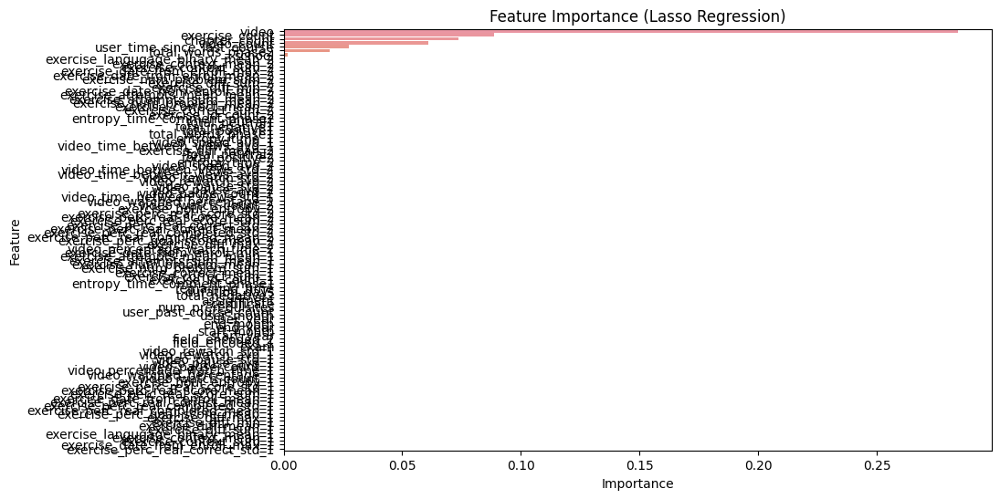


=== Boruta Trick ===

=== Boruta (Trick) Feature Importance ===
Random Feature: 12.6102
remaining_time: 12.2172
video: 11.3912
school: 9.7975
exercise_count: 9.4449
video_count: 7.1309
assignment: 7.0099
chapter_count: 4.7129
duration_days: 4.0967
user_month: 4.0909
num_prerequisites: 2.3707
start_month: 2.2836
end_month: 2.1564
total_words_phase1: 1.8745
total_words_phase2: 1.5185
total_neutral1: 1.3344
field_encoded_1: 0.9329
user_past_course_count: 0.6814
total_neutral2: 0.5730
certificate: 0.5095
exam: 0.4393
user_time_since_last_course: 0.3609
total_positive1: 0.3467
entropy_time_comment_phase1: 0.3050
entropy_time_comment_phase2: 0.2839
field_encoded_2: 0.2584
start_year: 0.2221
exercise_correct_sum_2: 0.1424
total_positive2: 0.1231
total_negative1: 0.0582
exercise_perc_real_correct_mean_1: 0.0540
exercise_context_sum_1: 0.0382
exercise_context_mean_2: 0.0355
total_negative2: 0.0334
user_year: 0.0288
exercise_attempts_sum_mean_2: 0.0279
exercise_perc_real_score_sum_1: 0.0259
exe

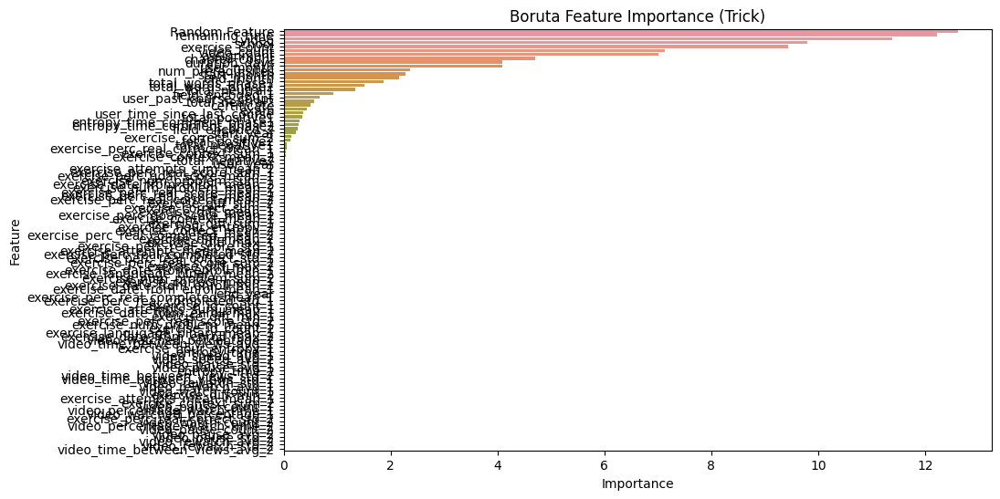


=== Phase phase2 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7803 entries, 0 to 7802
Columns: 156 entries, user_id to label_encoded
dtypes: float64(143), int64(9), object(4)
memory usage: 9.3+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase3: {'rsm': 0.8, 'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 300, 'depth': 9, 'border_count': 64} ===

=== Evaluation for phase phase3 ===

--- Train Metrics ---
F1 Score (per class): [0.85545045 0.57939328 0.30434783 0.49046322 0.46153846]
Precision (per class): [0.78196218 0.75768406 0.94594595 0.5625     0.45      ]
Recall (per class): [0.94418423 0.46902655 0.18134715 0.43478261 0.47368421]
Accuracy: 0.7730
AUC (One-vs-Rest): 0.9299

Classification Report:
              precision    recall  f1-score   support

           E       0.78      0.94      0.86      5124
           D       0.76      0.47      0.58      2260
           C       0.95      0.18      0.30 

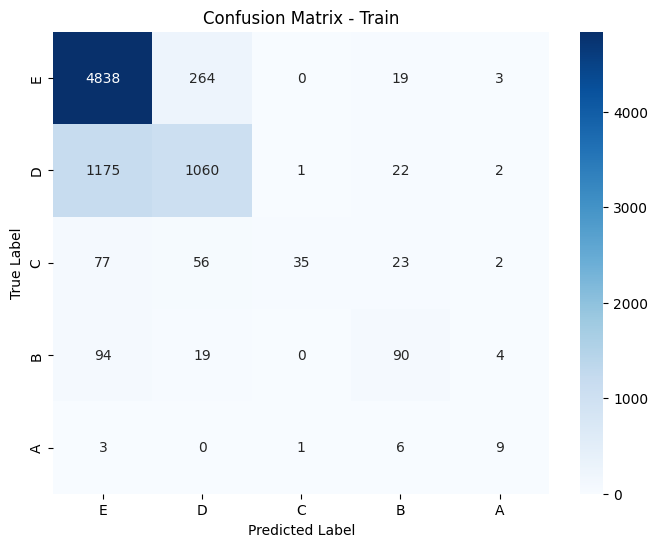

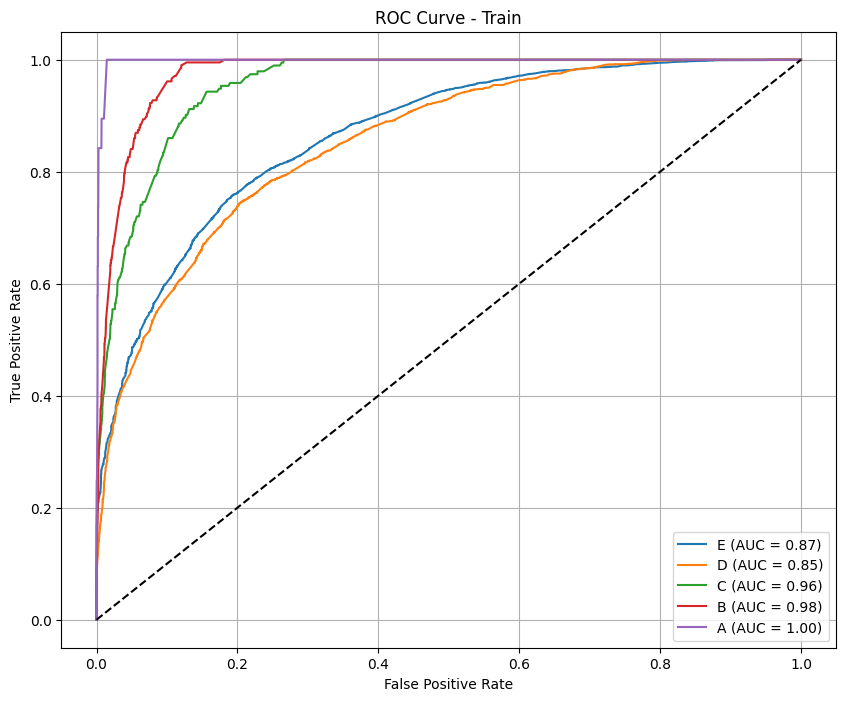


--- Test Metrics ---
F1 Score (per class): [0.89559165 0.09708738 0.         0.         0.        ]
Precision (per class): [0.8212766 0.3125    0.        0.        0.       ]
Recall (per class): [0.98469388 0.05747126 0.         0.         0.        ]
Accuracy: 0.8100
AUC (One-vs-Rest): 0.7207

Classification Report:
              precision    recall  f1-score   support

           E       0.82      0.98      0.90       588
           D       0.31      0.06      0.10        87
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.81       721
   macro avg       0.23      0.21      0.20       721
weighted avg       0.71      0.81      0.74       721



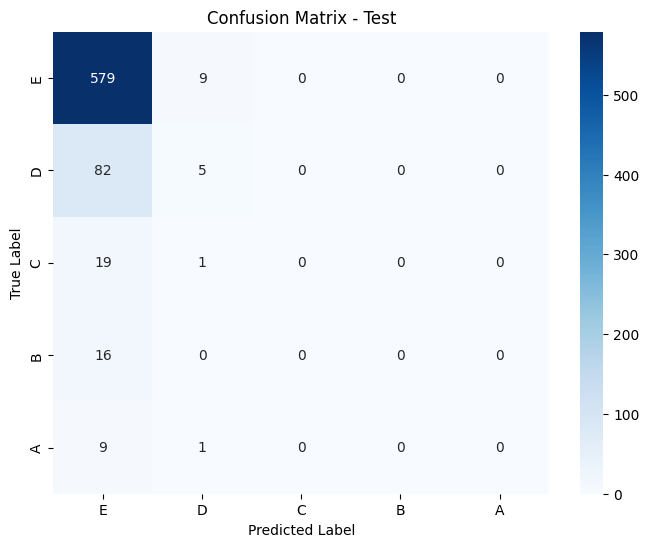

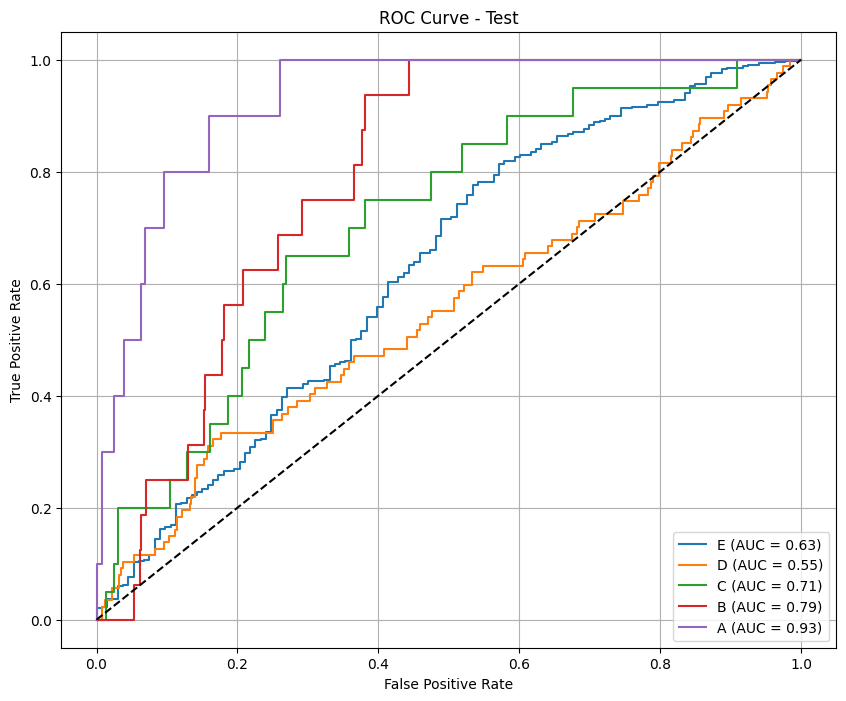

Test predictions saved as test_results_log_f1_macro_phase3.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase3 ===

--- Train Metrics ---
F1 Score (per class): [0.83577128 0.46367452 0.09852217 0.26771654 0.1       ]
Precision (per class): [0.72785177 0.85782557 1.         0.72340426 1.        ]
Recall (per class): [0.98126464 0.31769912 0.05181347 0.16425121 0.05263158]
Accuracy: 0.7422
AUC (One-vs-Rest): 0.9271

Classification Report:
              precision    recall  f1-score   support

           E       0.73      0.98      0.84      5124
           D       0.86      0.32      0.46      2260
           C       1.00      0.05      0.10       193
           B       0.72      0.16      0.27       207
           A       1.00      0.05      0.10        19

    accuracy                           0.74      7803
   macro avg       0.86      0.31      0.35      7803
weighted avg       0.77     

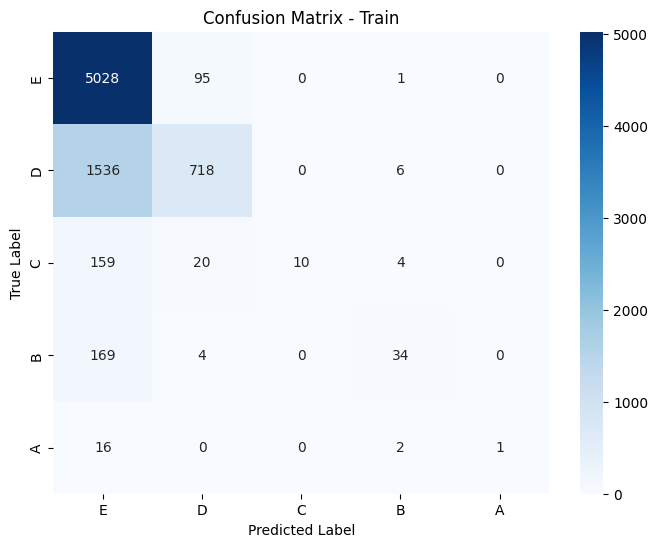

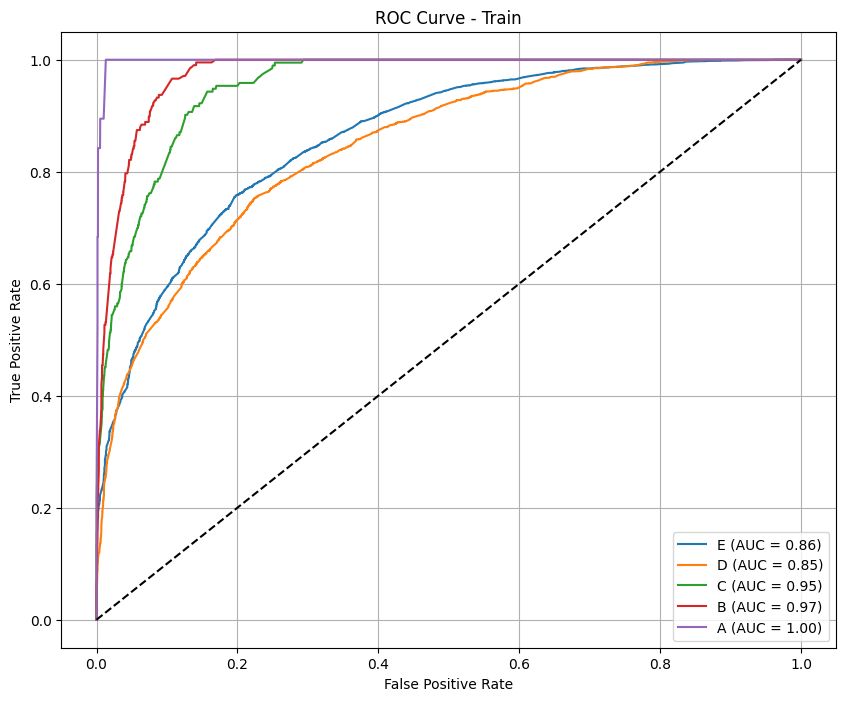


--- Test Metrics ---
F1 Score (per class): [0.89755352 0.         0.         0.         0.        ]
Precision (per class): [0.81527778 0.         0.         0.         0.        ]
Recall (per class): [0.99829932 0.         0.         0.         0.        ]
Accuracy: 0.8141
AUC (One-vs-Rest): 0.7216

Classification Report:
              precision    recall  f1-score   support

           E       0.82      1.00      0.90       588
           D       0.00      0.00      0.00        87
           C       0.00      0.00      0.00        20
           B       0.00      0.00      0.00        16
           A       0.00      0.00      0.00        10

    accuracy                           0.81       721
   macro avg       0.16      0.20      0.18       721
weighted avg       0.66      0.81      0.73       721



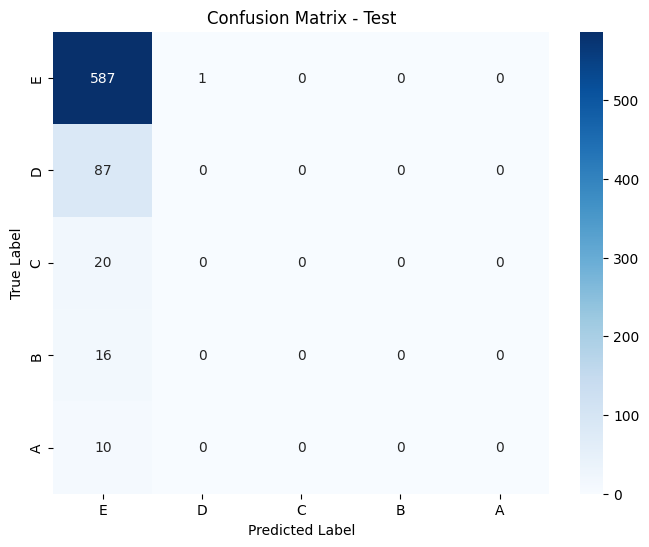

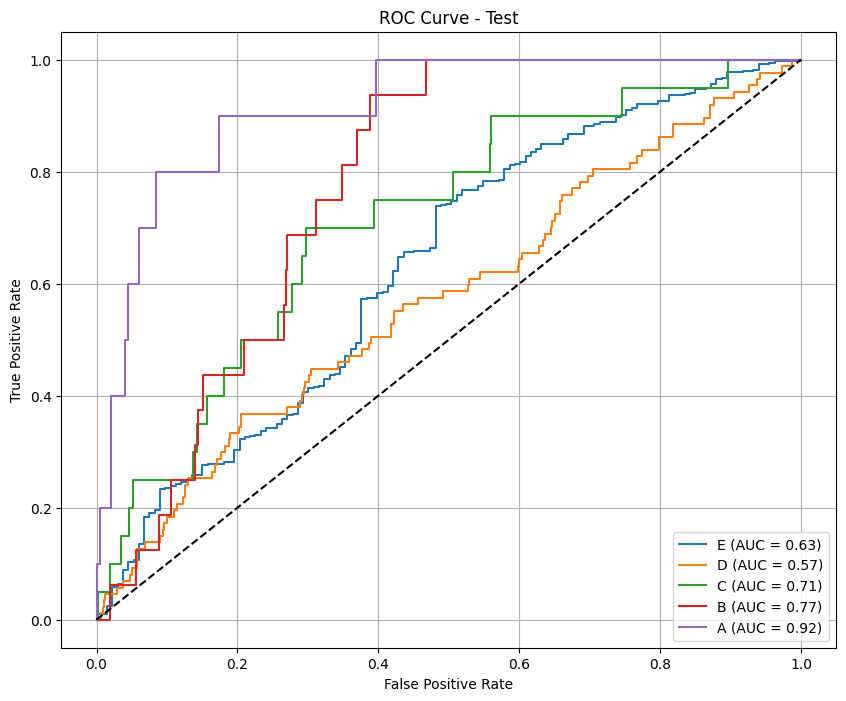

Calibrated predictions saved as test_results_calibrate_log_f1_macro_phase3.csv

=== Phase phase3 completed ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5363 entries, 0 to 5362
Columns: 199 entries, user_id to label_encoded
dtypes: float64(186), int64(9), object(4)
memory usage: 8.1+ MB
None
Fitting 5 folds for each of 10 candidates, totalling 50 fits

=== Best Parameters for phase phase4: {'rsm': 0.8, 'learning_rate': 0.15, 'l2_leaf_reg': 7, 'iterations': 300, 'depth': 8, 'border_count': 64} ===

=== Evaluation for phase phase4 ===

--- Train Metrics ---
F1 Score (per class): [0.86004162 0.61532508 0.34375    0.51020408 0.4375    ]
Precision (per class): [0.79071992 0.79341317 0.81481481 0.55555556 0.38888889]
Recall (per class): [0.94268606 0.50252845 0.21782178 0.47169811 0.5       ]
Accuracy: 0.7841
AUC (One-vs-Rest): 0.9328

Classification Report:
              precision    recall  f1-score   support

           E       0.79      0.94      0.86      3507
           D      

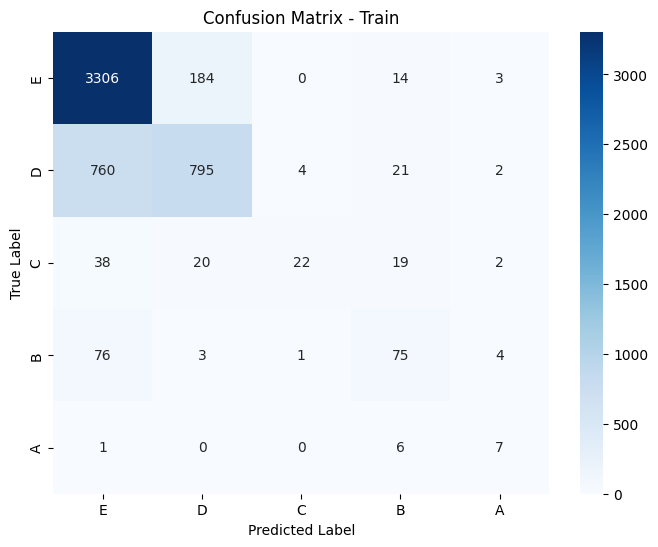

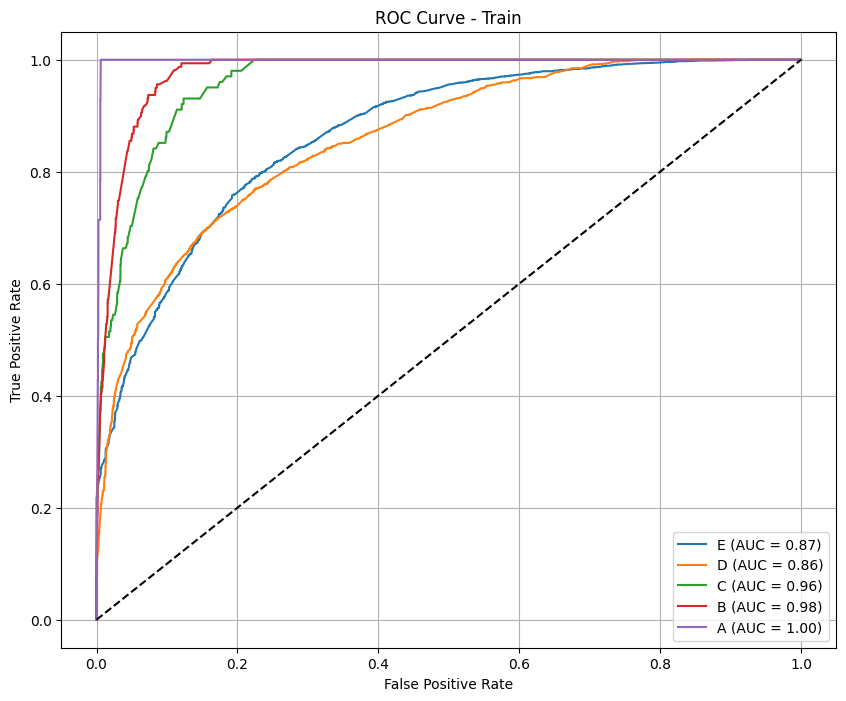


--- Test Metrics ---
F1 Score (per class): [0.87633088 0.01886792 0.         0.         0.        ]
Precision (per class): [0.8033033  0.04761905 0.         0.         0.        ]
Recall (per class): [0.96396396 0.01176471 0.         0.         0.        ]
Accuracy: 0.7802
AUC (One-vs-Rest): 0.6514

Classification Report:
              precision    recall  f1-score   support

           E       0.80      0.96      0.88       555
           D       0.05      0.01      0.02        85
           C       0.00      0.00      0.00        18
           B       0.00      0.00      0.00        18
           A       0.00      0.00      0.00        11

    accuracy                           0.78       687
   macro avg       0.17      0.20      0.18       687
weighted avg       0.65      0.78      0.71       687



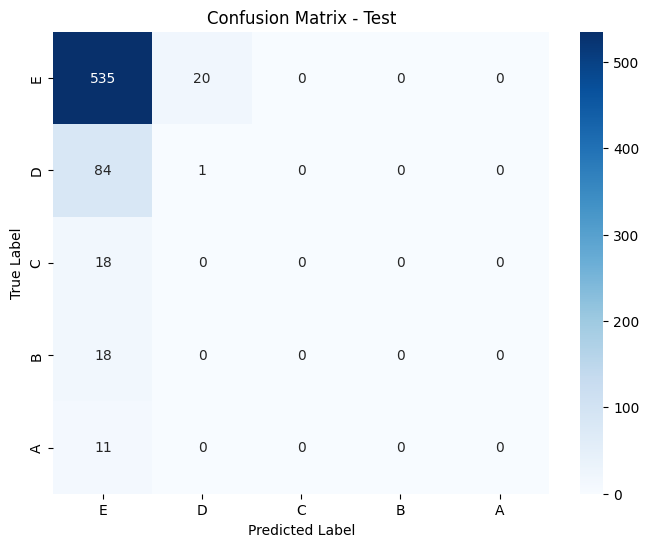

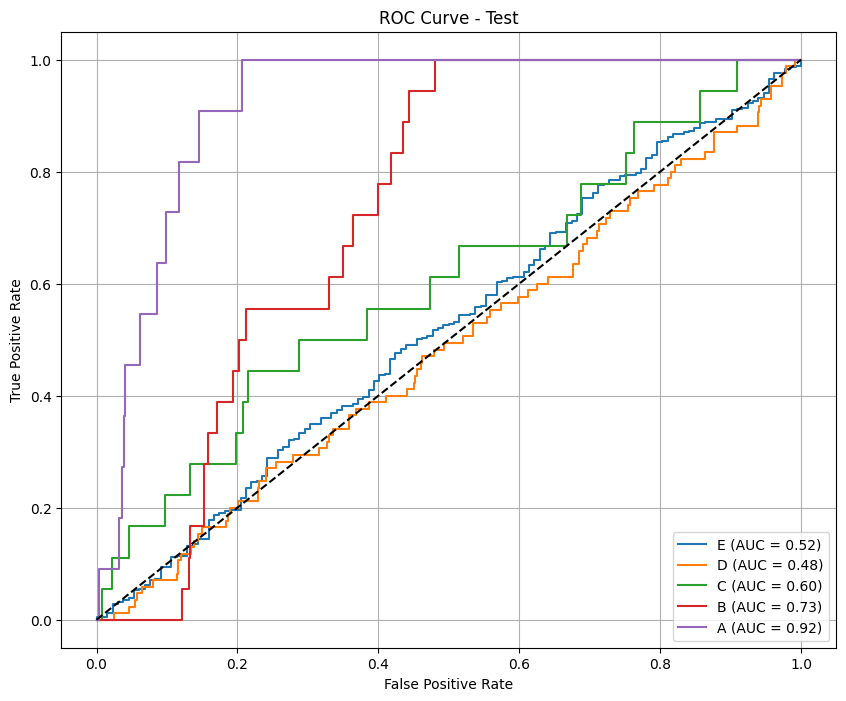

Test predictions saved as test_results_log_f1_macro_phase4.csv
[Warning] CatBoostClassifier đã hỗ trợ predict_proba tốt. Calibration có thể không cần thiết.

=== Evaluation after calibration for phase phase4 ===

--- Train Metrics ---
F1 Score (per class): [0.84478936 0.5070922  0.32520325 0.39069767 0.        ]
Precision (per class): [0.74365647 0.84866469 0.90909091 0.75       0.        ]
Recall (per class): [0.97775877 0.36156764 0.1980198  0.26415094 0.        ]
Accuracy: 0.7576
AUC (One-vs-Rest): 0.9304

Classification Report:
              precision    recall  f1-score   support

           E       0.74      0.98      0.84      3507
           D       0.85      0.36      0.51      1582
           C       0.91      0.20      0.33       101
           B       0.75      0.26      0.39       159
           A       0.00      0.00      0.00        14

    accuracy                           0.76      5363
   macro avg       0.65      0.36      0.41      5363
weighted avg       0.78     

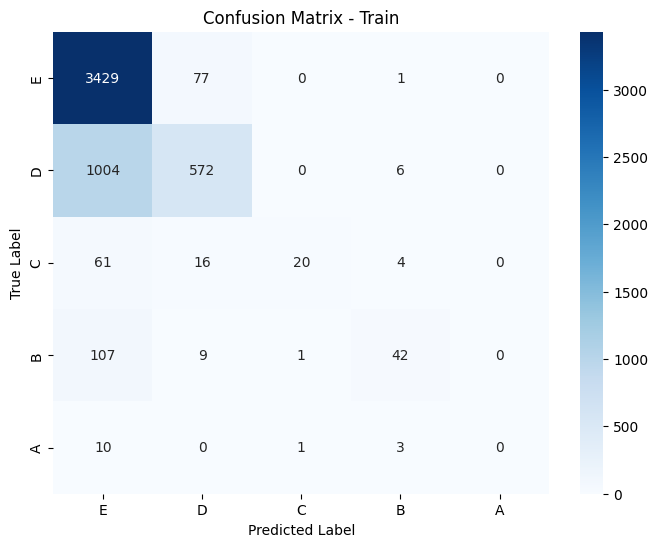

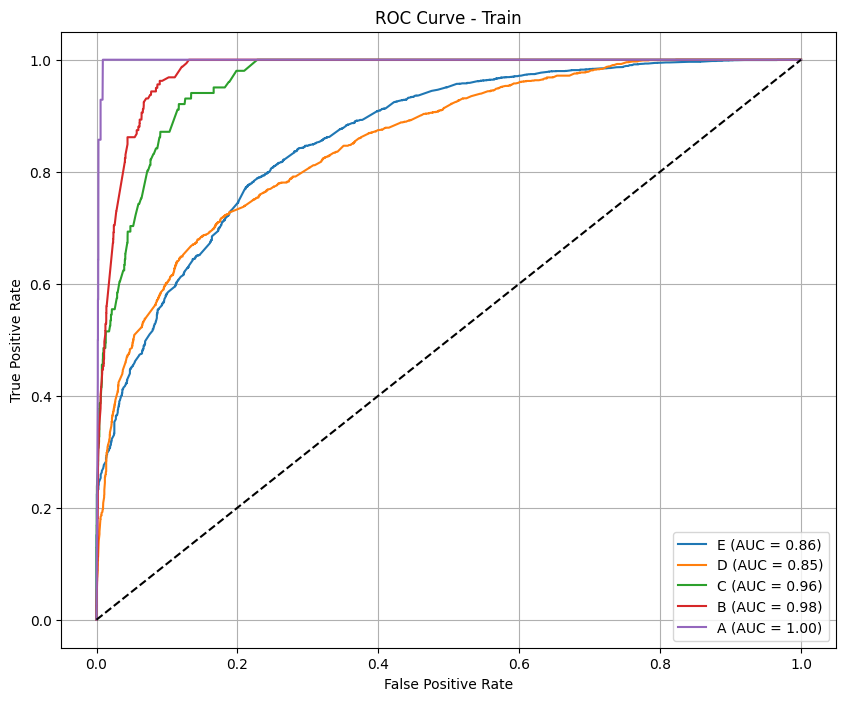


--- Test Metrics ---
F1 Score (per class): [0.89371981 0.         0.         0.         0.        ]
Precision (per class): [0.80786026 0.         0.         0.         0.        ]
Recall (per class): [1. 0. 0. 0. 0.]
Accuracy: 0.8079
AUC (One-vs-Rest): 0.6334

Classification Report:
              precision    recall  f1-score   support

           E       0.81      1.00      0.89       555
           D       0.00      0.00      0.00        85
           C       0.00      0.00      0.00        18
           B       0.00      0.00      0.00        18
           A       0.00      0.00      0.00        11

    accuracy                           0.81       687
   macro avg       0.16      0.20      0.18       687
weighted avg       0.65      0.81      0.72       687



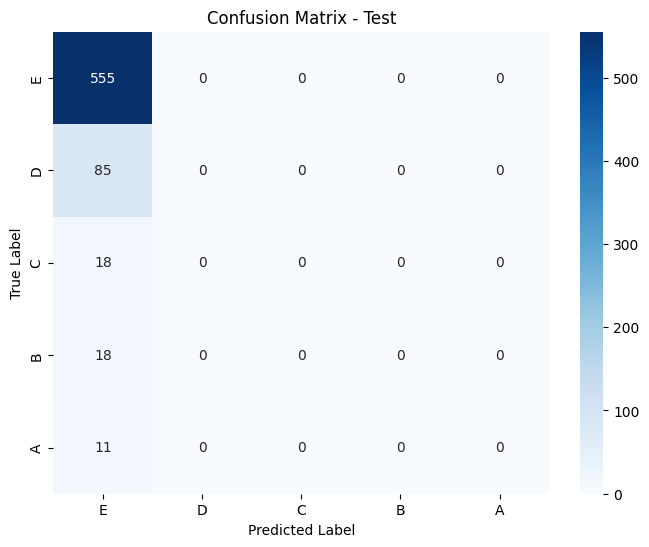

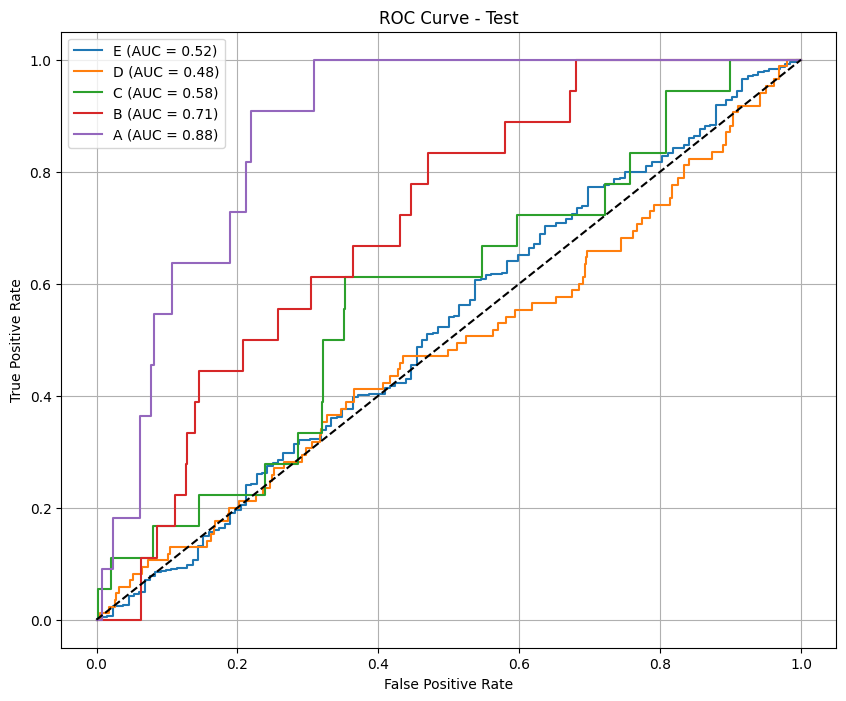

Calibrated predictions saved as test_results_calibrate_log_f1_macro_phase4.csv

=== Phase phase4 completed ===


In [16]:
# Lặp qua các phase
for phase in ["phase1", "phase2", "phase3", "phase4"]:
    process_phase(phase, metric='f1_macro')